# Electrical Energy Market Forecasting 
## Using Seasonal Decomposition, ARIMA and SARIMAX to examine CAISO data

The purpose of this notebook is to compute forecasts on the trends found within the CAISO Load and Duck Curve timeseries. The Cells in this notebook can be run in sequence to produce the analysis. Note that in the second cell under the comment saying CONTROL, there are variables for specifying "caiso_load" or "duck" as well as dates dt0, dt1 & dt2 and period sper. The dates are the training / test splits for the ARIMA forecast, and the sper variable is the period used in the call to Seasonal Decomposition. 


**Excecution guidelines**

The cells below hold code for executing the following aspects of the analytical computation: 

```
(1)  Imports 
(2)  Dataset   
(3)* Duck Curve over interval     
(4)* Duck Curve superimposed over one day    
(5)* Seasonal Decomposition     
(6)  ARIMA definition    
(7)* ARIMA gridsearch    
(8)  SARIMAX definition   
(9)* SARIMAX model prep and call     
```

Note that the asterisk * indicates cells which produce an analytic result, and these are listed as (A) - (E) below. An analytic result is a plot or visualization, but could also include file output as images or result data in tabular form. There is an order of operations for producing any of the analytic results. This is to say that there are some dependencies to which the cells are run. In all cases, both steps (1) and (2) need to be run first, and then the other cells can be run according to the following sequences: 

```
(A) : Duck Curve Interval    : (1) -> (2) -> (3)      
(B) : Duck Curve Day         : (1) -> (2) -> (4)      
(C) : Seasonal Decomposition : (1) -> (2) -> (5)      
(D) : ARIMA                  : (1) -> (2) -> (5) -> (6) -> (7)    
(E) : SARIMAX                : (1) -> (2) -> (5) -> (8) -> (9)      
```

The steps (A) and (B) are stand alone / basic plots of the Load, Solar/wind renewables and Duck Curve, where (A) is a visualization across an interval of N days, and (B) is the same data superimposed over a 24 hour day. The Visual characteristics and cyclical nature of the Duck Curve stand out and are more pronounced in (B).  The computation for (C) Seasonal Decomposition y = t + s + r where the original curve y is split into t trend, s seasonal & r residue (see additional notes below in the Seasonal Decomposition section). The trend t further goes on to be used as the basis for the (D) ARIMA and (E) SARIMAX forecasts. Thus the analytic results for ARIMA and SARIMAX dependend on both Seasonal Decomposition,  as well as the definitions for the ARIMA and SARIMAX functions. 





### (1)  Imports 

Load the python libraries and modules which are used in the project. 


In [35]:

import os
import pandas as pd
import psycopg2 as pg
import sys
import math

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from datetime import timedelta

from statsmodels.tsa.stattools import adfuller

from statsmodels.tsa import arima_process
from statsmodels.datasets import nile
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.forecasting.stl import STLForecast
from statsmodels.tsa.arima.model import ARIMA

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import mean_squared_error

from statsmodels.tsa.stattools import adfuller
import pmdarima as pm
from statsmodels.tsa.seasonal import seasonal_decompose
        
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error



### (2)  Dataset   

Load the caiso dataset held in csv format, and do some some light string clean up before storing into a dataframe for further processing.


In [36]:



#fil0 = 'ucb_aiml_capstone_caiso.csv'
fil0 = '_dat/ucb_aiml_capstone_caiso.csv'
pay0 = []
with open(fil0,'r') as f0:
    lin0 = f0.readlines()

for i1,a1 in enumerate(lin0):
    a2 = a1.replace('\n','')
    a3 = a2.split(',')
    pay0.append(a3)


lin1 = lin0[0]
lin2 = lin1.replace('\n','')
lin3 = lin2.split(',')

df0a = pd.DataFrame(pay0,columns=lin3)
df0b = df0a[df0a['caiso_load'] != 'caiso_load']
df0c = df0b.sort_index()
df0_origin = df0c 
print(f' df0_origin.head() { df0_origin.head() }')

def jitter(values,j):
    return values + np.random.normal(j,0.1,values.shape)


###
### CONTROL 
###

#tic0 = 'caiso_load'
tic0 = 'duck'

sper = 48
dt0 = '2020-01-01'
dt1 = '2020-05-31'
dt2 = '2020-05-01'


 df0_origin.head()                           ts0         dt0 hr0 solar  wind caiso_load sol_wind  \
1  2019-01-01 00:00:00.000000  2019-01-01   0     0  2810                2810   
2  2019-01-01 01:00:00.000000  2019-01-01   1     0  2554                2554   
3  2019-01-01 02:00:00.000000  2019-01-01   2     0  2391                2391   
4  2019-01-01 03:00:00.000000  2019-01-01   3     0  2455                2455   
5  2019-01-01 04:00:00.000000  2019-01-01   4     0  2322                2322   

  duck  
1       
2       
3       
4       
5       


### (3) Duck Curve over interval     


The plot is an illustration of the Total Caiso Load, Solar/Wind Curve and Duck Curve timeseries showing the sequence across an interval spanning many days. 


caiso_0()


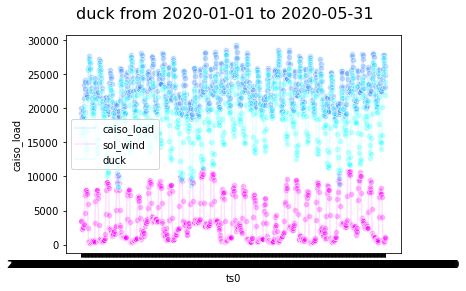

In [37]:




print(f'caiso_0()')


df0 = df0_origin
df1 = df0.query(f'dt0 == "{dt2}"') 
df2 = df0.query(f'caiso_load != ""') 
#df3 = df2.query(f'dt0 > "2020-01-01" and dt0 < "2020-05-31"') 
df3 = df2.query(f'dt0 > "2020-01-01" and dt0 < "2020-01-31"') 



#X0 = df0[['ts0']]
#x0 = df0['ts0'] 
#X1 = df0[['hr0']]
#x1 = df0['hr0'].astype(float)


X0 = df3[['ts0']]
x0 = df3['ts0'] 
X1 = df3[['hr0']]
x1 = df3['hr0'].astype(float)

y0 = df3['solar'].astype(float)
y1 = df3['wind'].astype(float)
y2 = df3['caiso_load'].astype(float)
y3 = df3['sol_wind'].astype(float)
y4 = df3['duck'].astype(float)

x2 = df1['hr0'].astype(float)
y5 = df1['caiso_load'].astype(float)
y6 = df1['sol_wind'].astype(float)
y7 = df1['duck'].astype(float)


def jitter(values,j):
    return values + np.random.normal(j,0.1,values.shape)


fig0, ax0 = plt.subplots()

sns.scatterplot(x=x0,y=y2,color='#2687ff4f')
sns.scatterplot(x=x0,y=y3,color='#ff00ff4f')
sns.scatterplot(x=x0,y=y4,color='#26ffff4f')

sns.lineplot(x=x0,y=y2,label=f'caiso_load',color='#2687ff1f')
sns.lineplot(x=x0,y=y3,label=f'sol_wind'  ,color='#ff00ff1f')
sns.lineplot(x=x0,y=y4,label=f'duck'      ,color='#26ffff1f')

fig0.suptitle(f'{tic0} from {dt0} to {dt1} ',size=16)
#ax1.invert_yaxis()

#plt.grid()
plt.savefig(f'_out/aaa_caiso_1_interval_{tic0}.png')
#plt.show()






### (4) Duck Curve superimposed over one day    

This plot illustrates the Total Caiso Load, Solar/Wind Curve and Duck Curve timeseries curves over the 24 hours in a day by showing many days superimposed over a 24 hour timeframe. 


caiso_1()


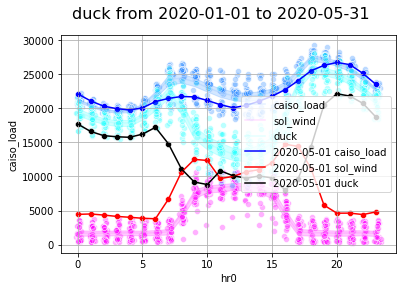

In [38]:


print(f'caiso_1()')


fig1, ax1 = plt.subplots()

sns.scatterplot(x=jitter(x1,0.1),y=y2,color='#2687ff4f')
sns.scatterplot(x=jitter(x1,0.1),y=y3,color='#ff00ff4f')
sns.scatterplot(x=jitter(x1,0.1),y=y4,color='#26ffff4f')
sns.scatterplot(x=x2,y=y5,color='#0000ffff')
sns.scatterplot(x=x2,y=y6,color='#ff0000ff')
sns.scatterplot(x=x2,y=y7,color='#000000ff')

sns.lineplot(x=x1,y=y2,label=f'caiso_load',color='#2687ff1f')
sns.lineplot(x=x1,y=y3,label=f'sol_wind'  ,color='#ff00ff1f')
sns.lineplot(x=x1,y=y4,label=f'duck'      ,color='#26ffff1f')
sns.lineplot(x=x2,y=y5,label=f'{dt2} caiso_load'  ,color='#0000ffff')
sns.lineplot(x=x2,y=y6,label=f'{dt2} sol_wind'    ,color='#ff0000ff')
sns.lineplot(x=x2,y=y7,label=f'{dt2} duck'        ,color='#000000ff')

fig1.suptitle(f'{tic0} from {dt0} to {dt1} ',size=16)

#ax0.invert_yaxis()

plt.grid()
plt.savefig(f'_out/aaa_caiso_0_day_{tic0}.png')
plt.show()




### (5) Seasonal Decomposition     


Use the Seasonal Decomposition method to establish the component trend, seasonality, and residue from the original timeseries given by the equation:

```
    y = t + s + r , or
    y = t * s * r 

where: 

    y  is the original timeseries,
    t  is the trend,
    s  is the seasonal component, and 
    r  is the residue. 
```

note that seasonality  can be determined by additive or multiplicative combination of the components, and either can be used. Plot image of all four components vertically aligned together. 




caiso_2_seasonal()


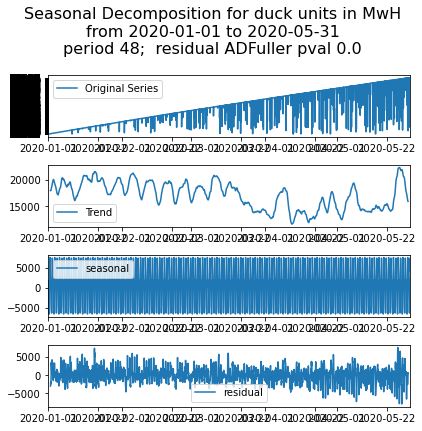

In [39]:
print(f'caiso_2_seasonal()')

df0 = df0_origin
        
df0['ts0'].dropna()
df0[tic0].dropna()
df0 = df0[df0[tic0] != '']
df0['ts0'] = pd.to_datetime(df0['ts0'],infer_datetime_format=True,errors='coerce')
df0 = df0.set_index(['ts0'])

df00 = df0
df0 = df00[dt0:dt1]

df0[tic0].fillna(method='backfill',inplace=True)

x0 = df0.index.min()
x1 = df0.index.max()


baz0 = df0[tic0].astype(float) 

res0 = seasonal_decompose(baz0,model='additive',period=sper)
self_original = original = df0[tic0]
self_trend    = trend    = res0.trend.dropna()
self_seasonal = seasonal = res0.seasonal.dropna()
self_residual = residual = res0.resid.dropna()

pval0 = adfuller(residual)[1]
pval1 = round(pval0,2)

tit0 = f'''Seasonal Decomposition for {tic0} units in MwH
from {dt0} to {dt1}
period {sper};  residual ADFuller pval {pval1}'''

plt.figure(figsize=(6,6))
plt.suptitle(tit0 , fontsize=16 ,y=.99)

plt.subplot(4,1,1) 
plt.plot(original,label='Original Series')
plt.xlim(x0,x1)
plt.legend()

plt.subplot(4,1,2) 
plt.plot(trend,label='Trend')
plt.xlim(x0,x1)
plt.legend()

plt.subplot(4,1,3) 
plt.plot(seasonal,label='seasonal')
plt.xlim(x0,x1)
plt.legend()

plt.subplot(4,1,4) 
plt.plot(residual,label='residual')
plt.xlim(x0,x1)
plt.legend()

plt.tight_layout()
plt.savefig(f'_out/caiso_season_decomp_{tic0}.png')
plt.show()




### (6) ARIMA definition    

Define a function for performing a single ARIMA training/test forecast run. 

The parameters of this function are the hyperparameters tested by gridsearch. Most noteably the function call contains the start and end dates of training and test timeframes, as well as the arima order in the form of (p,d,q) and the number of periods for the seasonal aspect of the calculation. The function produces many plots including the ACF and PACF to evaluate ARIMA's effectiveness as well as a plot showing the original time series with the ARIMA forecast shown in green and actual historical values given in orange for contrast/comparison. 

Note that the forecast/acutal segments can be slightly vertically offset from the original sequence due to a slight discrepency in the calculation of the starting point for the display. 

In [40]:
def eda_4_caiso_arima(tic1,sho0,nam0,dt1,dt2,dt3,ord0,per0,idx0):
    ''' TODO comment.

    TODO capstone read, undestand and apply vvv these.
    https://www.statsmodels.org/dev/generated/statsmodels.tsa.seasonal.STL.html
    https://stackoverflow.com/questions/66067471/how-to-choose-the-correct-arguments-of-statsmodels-stl-function


    
    '''

    ret_val  = None
 
    tic1['ts1'] = tic1.index
    tic1['lag1'] = tic1[tic0 ].shift(1)
    tic1['del0'] = tic1[tic0 ].astype(float) - tic1['lag1'].astype(float)

    # NOTE!! use dropna() on series otherwise plot_acf won't work. fas1['del0'].dropna()
    #tic2 = tic1.loc[:,['dt0','del0']].dropna()
    tic2 = tic1.loc[:,['del0']].dropna()

    y_hist   = tic2.loc[f'{dt1}':f'{dt2}']
    y_future = tic2.loc[f'{dt2}':f'{dt3}']
    y_future_len = (len(y_future))

    stl0  = STL(y_hist,period=per0)
    res0  = stl0.fit()
    stlf0 = STLForecast(y_hist,ARIMA
                    ,model_kwargs={'order':ord0, 'trend':'t'}
                    ,period=per0)

    stlf_res0 = stlf0.fit()
    fcst0 = stlf_res0.forecast(y_future_len)

    df1 = pd.DataFrame(fcst0,columns=['fcst'])
    df1.insert(0, 'idx0', range(0, len(df1)))

    df2 = y_future.copy(deep=True)
    df2['dt1'] = df2.index
    df2.insert(0, 'idx0', range(0, len(df2)))
    df3 = pd.merge(df1,df2,on='idx0')


    z0 = float(tic1.loc[tic1.ts1 == dt1,[tic0]][tic0])
    y8 = 100 + 40
    y9 = 10
    x0 = tic1['ts1']
    y0 = tic1['del0'].cumsum() + z0

    z1 = float(tic1.loc[tic1.ts1 == dt2,[tic0]][tic0])
    x1 = df3['dt1']
    y1 = df3['del0'].cumsum() + z1
    y2 = df3['fcst'].cumsum() + z1
    acf_lags = 24

    del1 = tic2['del0'].dropna()
    fig0, ax0 = plt.subplots(figsize=(10,4))
    plot_pacf(del1,lags=acf_lags, ax=ax0, title='PACF y1')
    plt.savefig(f'_out/out_eda_4_0_{nam0}_pacf.png')
    if sho0: plt.show()

    fig2, ax0 = plt.subplots(figsize=(10,4))
    plot_acf(del1,lags=acf_lags, ax=ax0, title='ACF y1')
    plt.savefig(f'_out/out_eda_4_0_{nam0}_acf.png')
    if sho0: plt.show()

    mse0 = round(float(mean_squared_error(y1,y2)),1)
    mae0 = round(float(mean_absolute_error(y1,y2)),1)
    mape0 = round(float(mean_absolute_percentage_error(y1,y2)),3)
    rmse0 = math.sqrt(mse0)
    ret_val = (mse0,rmse0,mae0,mape0)
 
    #print(f'!@! mse0   {mse0}')
    #print(f'!@! rmse0  {rmse0}')
    #print(f'!@! mae0   {mae0}')
    #print(f'!@! mape0  {mape0}')
    # #print(f'!@! rmse0 {rmse0}')

    plt.clf()
    plt.plot(res0.trend,    label='trend') 
    plt.plot(res0.seasonal, label='seasonal') 
    plt.plot(y_hist,        label='y_hist')
    plt.title(f'{nam0} STL hist with trend seasonal del0 ')
    plt.legend() 
    plt.savefig(f'_out/out_eda_4_1_{nam0}.png')
    if sho0: plt.show()

    plt.clf()
    plt.plot(res0.resid,label='residual')
    plt.grid()
    plt.title(f'{nam0} Residuals - look for stationarity')
    plt.savefig(f'_out/out_eda_4_2_{nam0}.png')
    if sho0: plt.show()


    plt.clf()
    plt.plot(y_future  ,label='actual future data')
    plt.plot(fcst0     ,label='forecast')
    plt.plot(y_hist    ,label='hist training data')
    plt.legend()
    plt.title(f'{nam0} STL Forecast with Future - del0')
    plt.grid()
    plt.savefig(f'_out/out_eda_4_3_{nam0}.png')
    if sho0: plt.show()


    #tit0 = f'''{nam0} forecast with STL & ARIMA x0/y0. (mae,mape) {mae0},{mape0}
    #order {ord0}; period{per0}; idx0 {idx0}
    #{dt1} {dt2} {dt3}'''
    tit0 = f'''{idx0} {nam0} forecast with STL & ARIMA (mae,mape) {mae0},{mape0}
    order {ord0}; period{per0}; 
    {dt1[:10]} {dt2[:10]} {dt3[:10]}'''
    plt.clf()
    fig1, ax0 = plt.subplots()
    sns.lineplot(x=x0,y=y0,label='hist')
    sns.lineplot(x=x1,y=y1,label='actual')
    sns.lineplot(x=x1,y=y2,label='forecast')
    #plt.title(f'{nam0} forecast with STL & ARIMA x0/y0. (mae,mape) {mae0},{mape0}')
    plt.title(tit0)
    plt.legend()
    plt.grid()
    plt.savefig(f'_out/{nam0}_{idx0}.png')
    #plt.savefig(f'../_out/out_eda_4_4_{nam0}_{idx0}.png')
    if sho0: plt.show()

    return ret_val 


### (7) ARIMA gridsearch    

Perform a grid search through the hyperparameters for arima order (p,d,q), arima period, and the forecast date range: 

```
(1) arima order, 
(2) arima period, and
(3) forecasts date range (7 day window starting on diff days/date).
```



caiso_3_arima()
(0,0,0) (0,0,1) (0,0,2) (0,0,3) (0,0,4) (0,1,0) (0,1,1) (0,1,2) (0,1,3) (0,1,4) (0,2,0) (0,2,1) (0,2,2) (0,2,3) (0,2,4) (0,3,0) (0,3,1) (0,3,2) (0,3,3) (0,3,4) (0,4,0) (0,4,1) (0,4,2) (0,4,3) (0,4,4) (1,0,0) (1,0,1) (1,0,2) (1,0,3) (1,0,4) (1,1,0) (1,1,1) (1,1,2) (1,1,3) (1,1,4) (1,2,0) (1,2,1) (1,2,2) (1,2,3) (1,2,4) (1,3,0) (1,3,1) (1,3,2) (1,3,3) (1,3,4) (1,4,0) (1,4,1) (1,4,2) (1,4,3) (1,4,4) (2,0,0) (2,0,1) (2,0,2) (2,0,3) (2,0,4) (2,1,0) (2,1,1) (2,1,2) (2,1,3) (2,1,4) (2,2,0) (2,2,1) (2,2,2) (2,2,3) (2,2,4) (2,3,0) (2,3,1) (2,3,2) (2,3,3) (2,3,4) (2,4,0) (2,4,1) (2,4,2) (2,4,3) (2,4,4) (3,0,0) (3,0,1) (3,0,2) (3,0,3) (3,0,4) (3,1,0) (3,1,1) (3,1,2) (3,1,3) (3,1,4) (3,2,0) (3,2,1) (3,2,2) (3,2,3) (3,2,4) (3,3,0) (3,3,1) (3,3,2) (3,3,3) (3,3,4) (3,4,0) (3,4,1) (3,4,2) (3,4,3) (3,4,4) (4,0,0) (4,0,1) (4,0,2) (4,0,3) (4,0,4) (4,1,0) (4,1,1) (4,1,2) (4,1,3) (4,1,4) (4,2,0) (4,2,1) (4,2,2) (4,2,3) (4,2,4) (4,3,0) (4,3,1) (4,3,2) (4,3,3) (4,3,4) (4,4,0) (4,4,1) (4,4,2) 

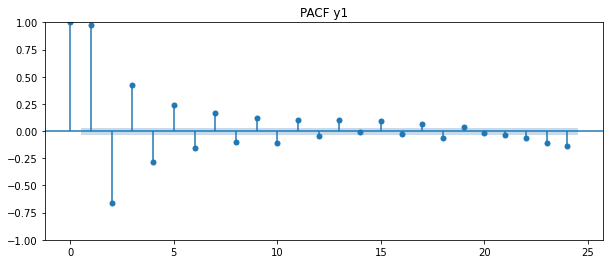

<Figure size 720x288 with 0 Axes>

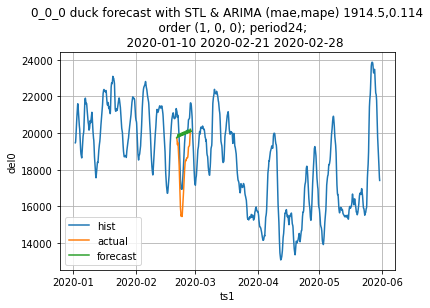

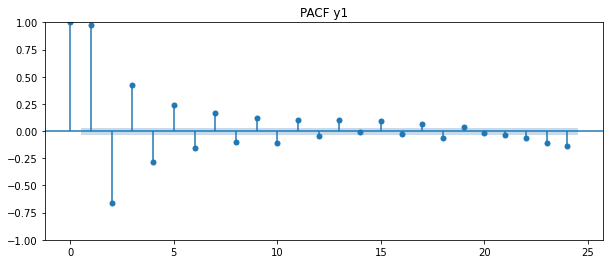

<Figure size 720x288 with 0 Axes>

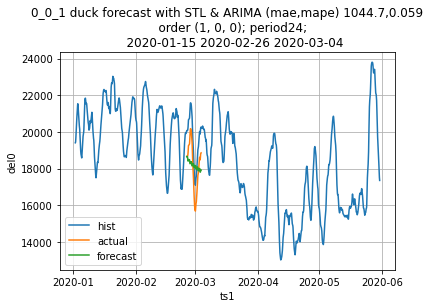

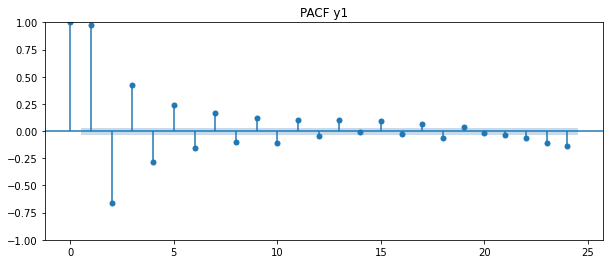

<Figure size 720x288 with 0 Axes>

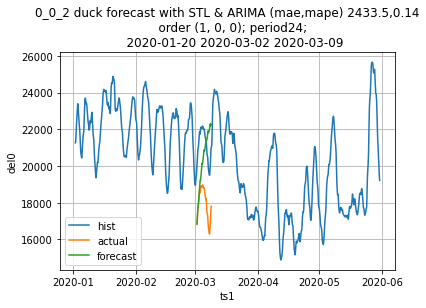

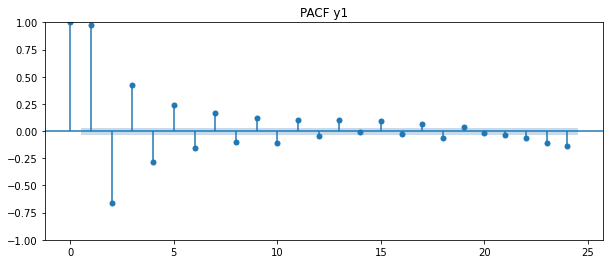

<Figure size 720x288 with 0 Axes>

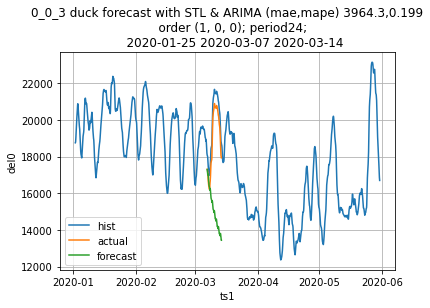

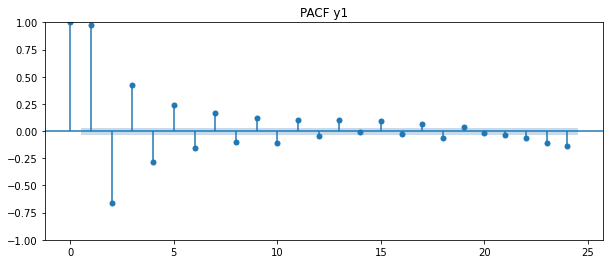

<Figure size 720x288 with 0 Axes>

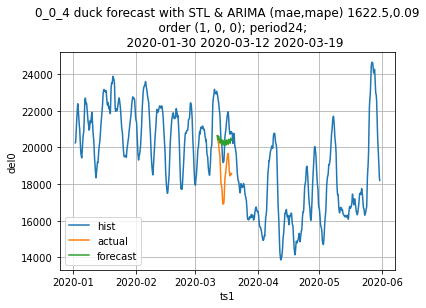

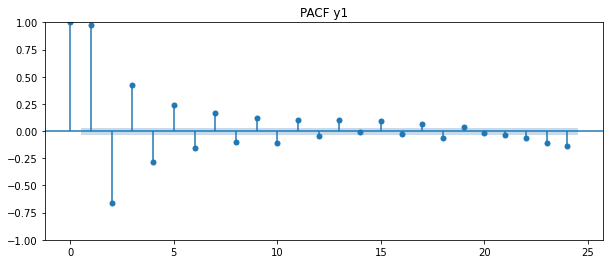

<Figure size 720x288 with 0 Axes>

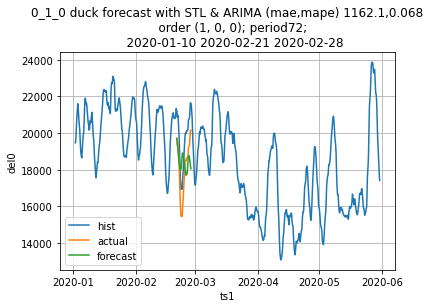

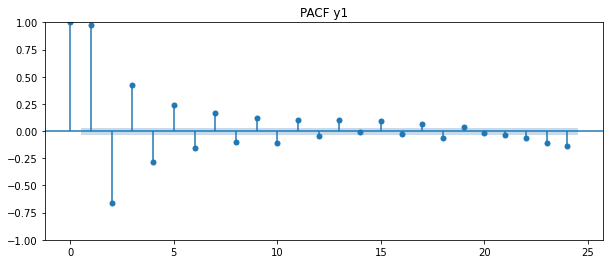

<Figure size 720x288 with 0 Axes>

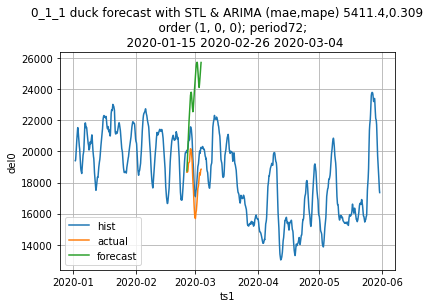

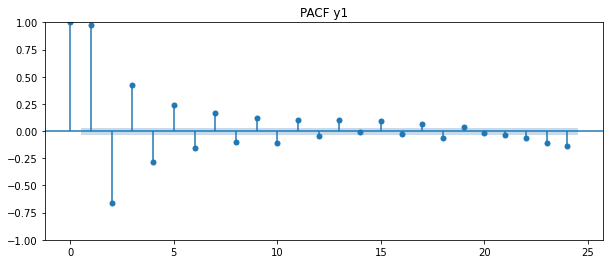

<Figure size 720x288 with 0 Axes>

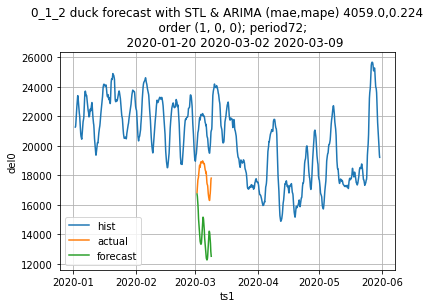

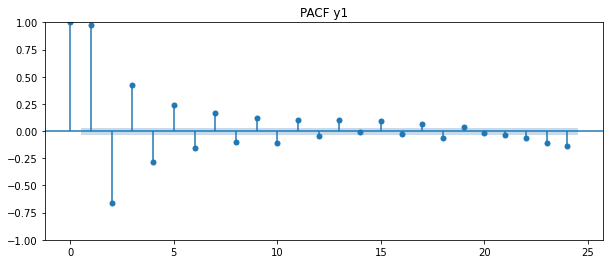

<Figure size 720x288 with 0 Axes>

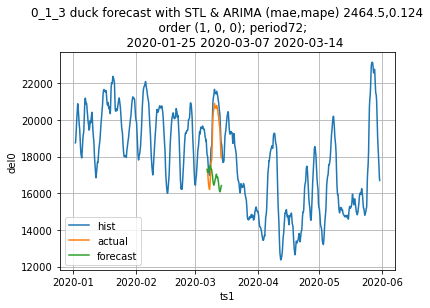

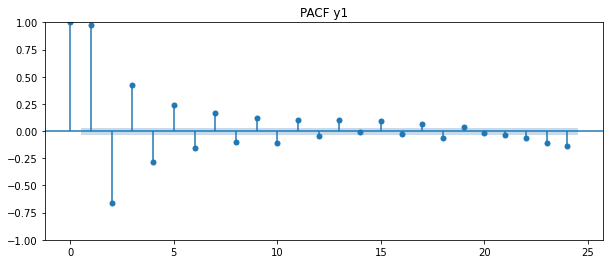

<Figure size 720x288 with 0 Axes>

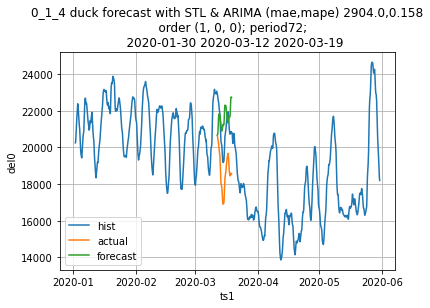

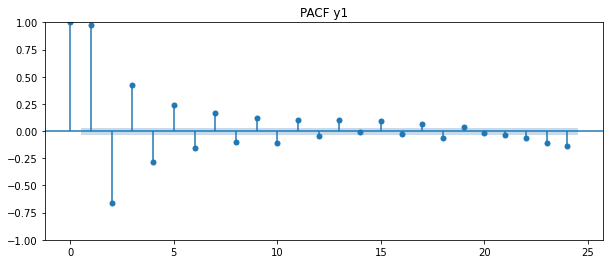

<Figure size 720x288 with 0 Axes>

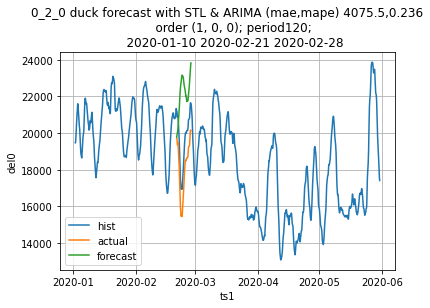

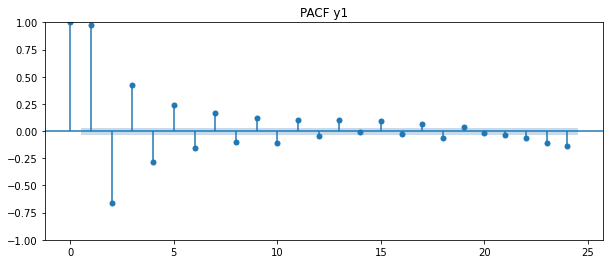

<Figure size 720x288 with 0 Axes>

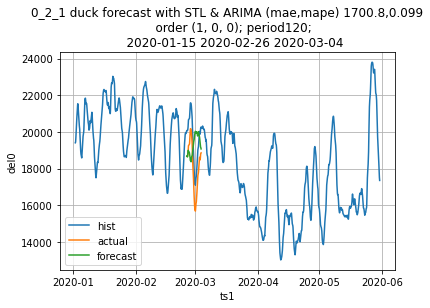

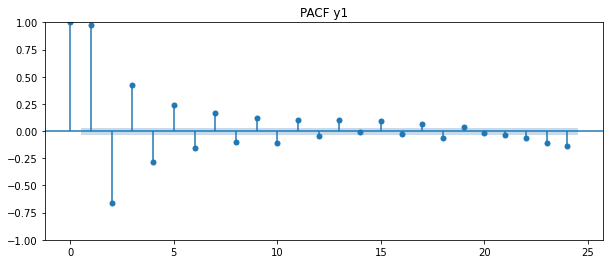

<Figure size 720x288 with 0 Axes>

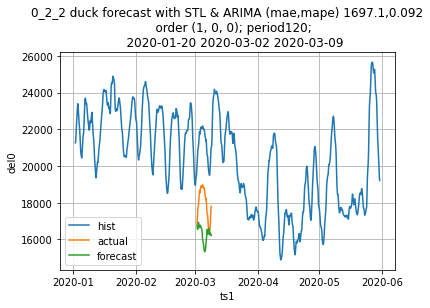

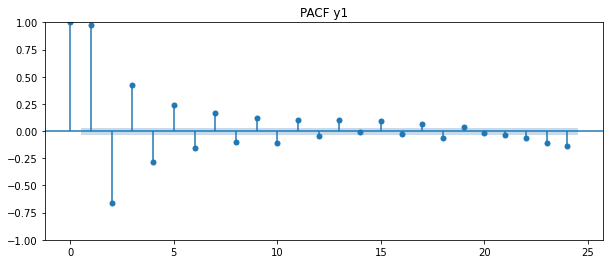

<Figure size 720x288 with 0 Axes>

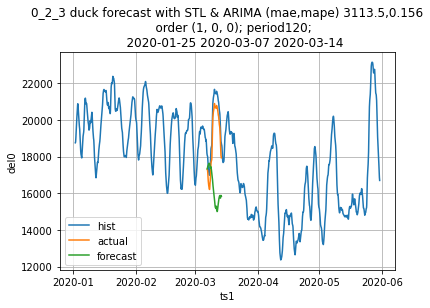

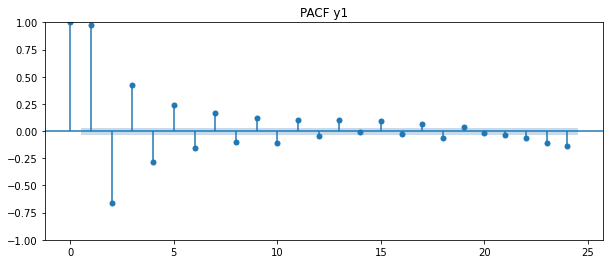

<Figure size 720x288 with 0 Axes>

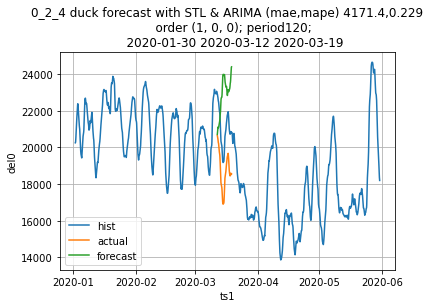

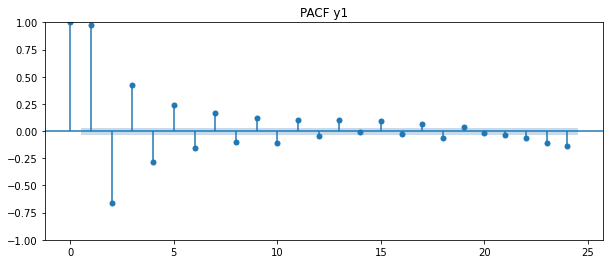

<Figure size 720x288 with 0 Axes>

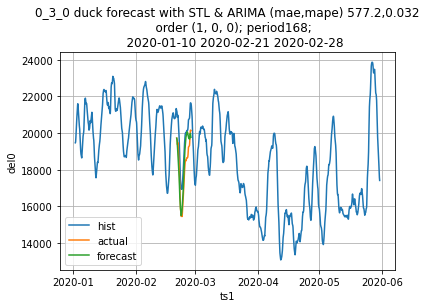

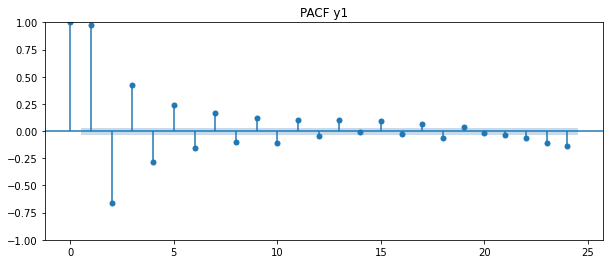

<Figure size 720x288 with 0 Axes>

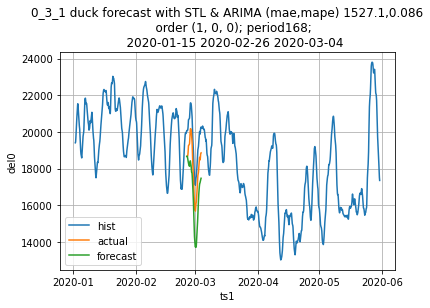

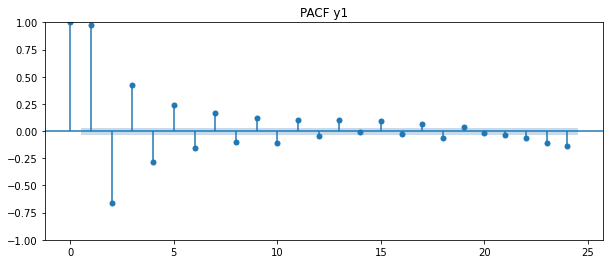

<Figure size 720x288 with 0 Axes>

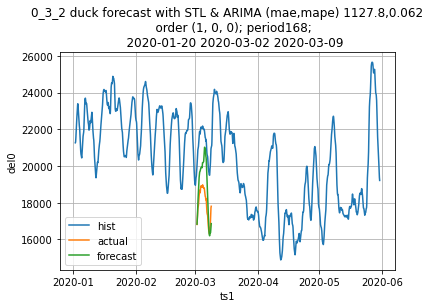

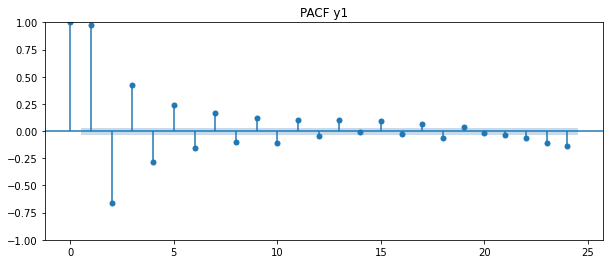

<Figure size 720x288 with 0 Axes>

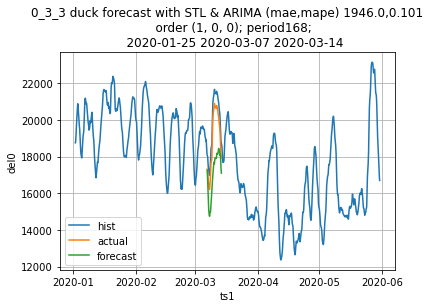

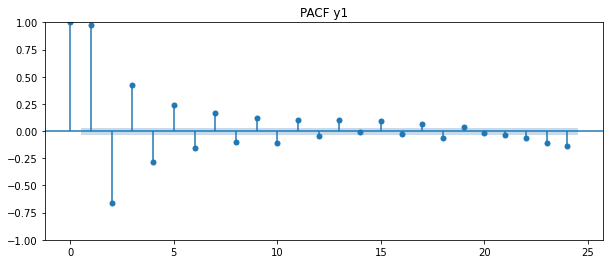

<Figure size 720x288 with 0 Axes>

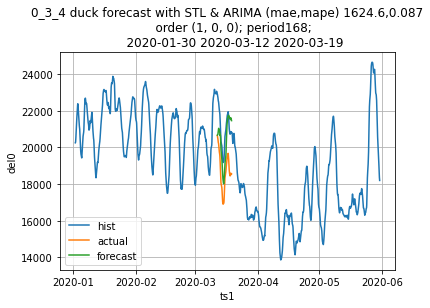

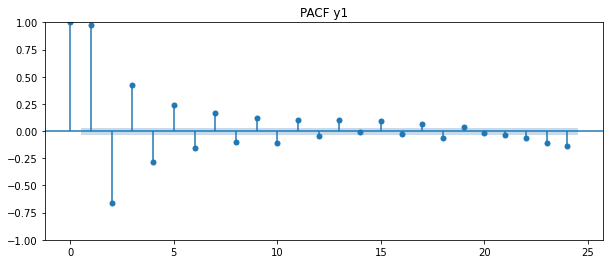

<Figure size 720x288 with 0 Axes>

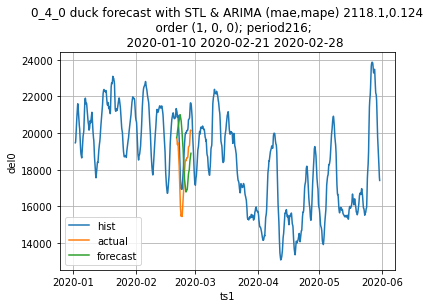

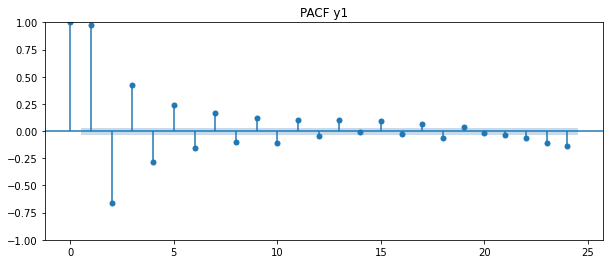

<Figure size 720x288 with 0 Axes>

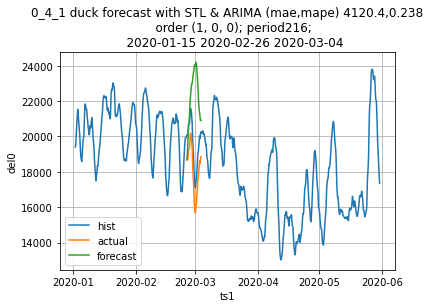

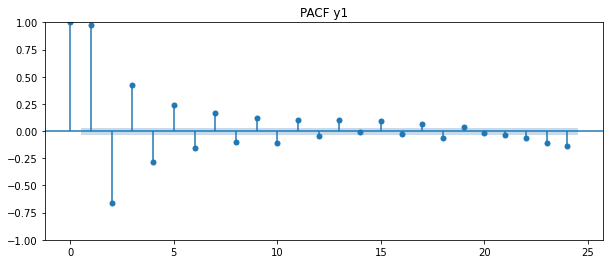

<Figure size 720x288 with 0 Axes>

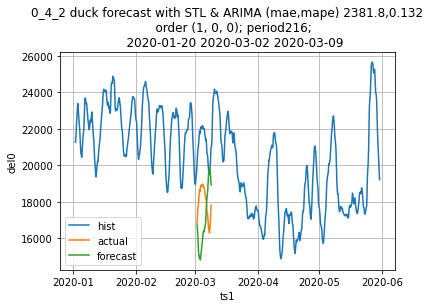

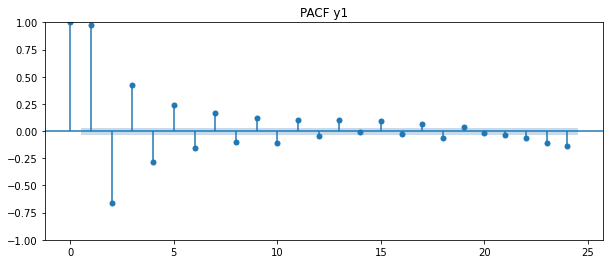

<Figure size 720x288 with 0 Axes>

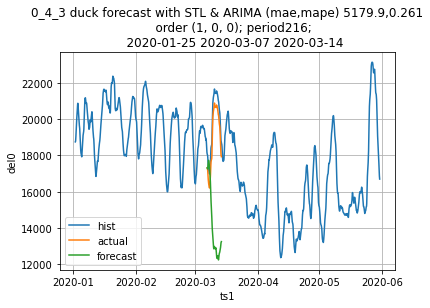

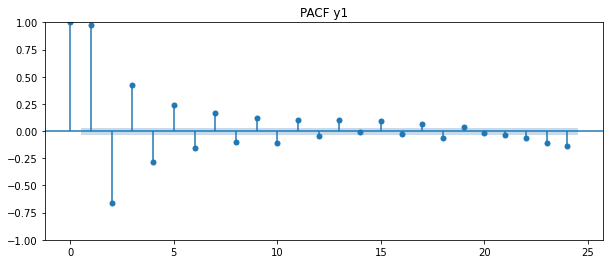

<Figure size 720x288 with 0 Axes>

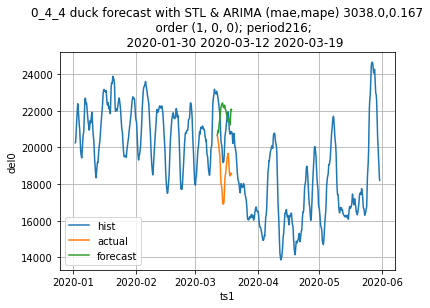

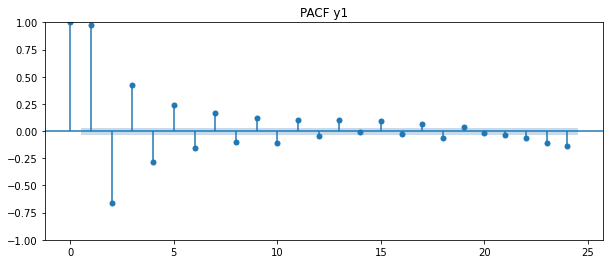

<Figure size 720x288 with 0 Axes>

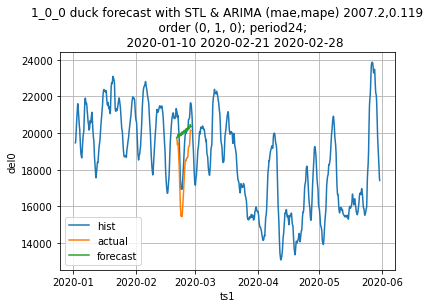

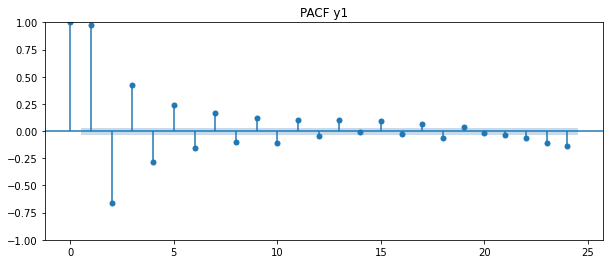

<Figure size 720x288 with 0 Axes>

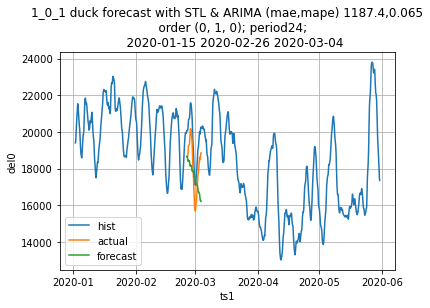

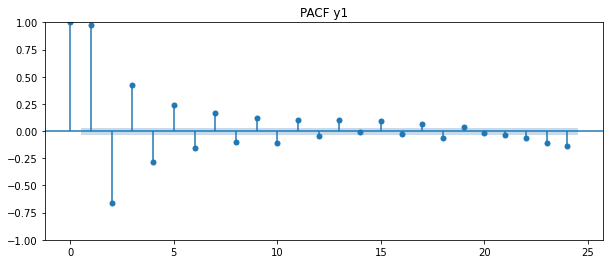

<Figure size 720x288 with 0 Axes>

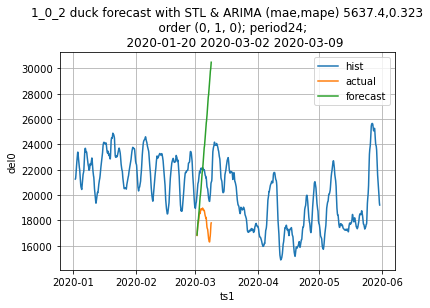

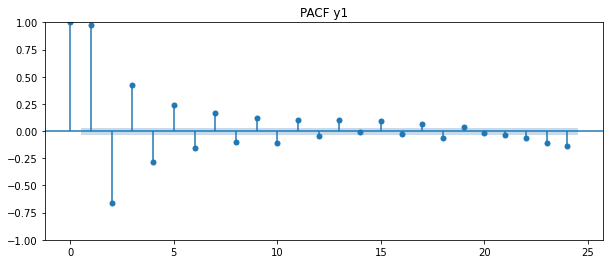

<Figure size 720x288 with 0 Axes>

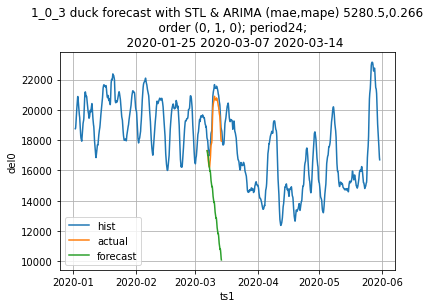

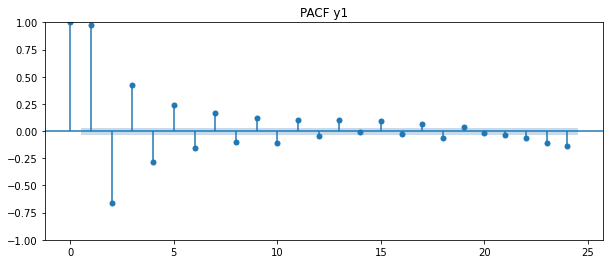

<Figure size 720x288 with 0 Axes>

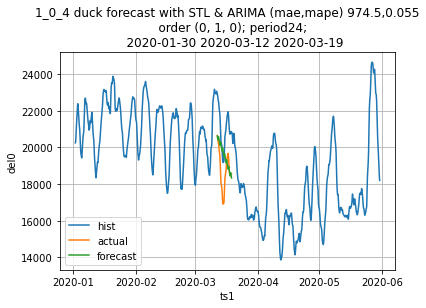

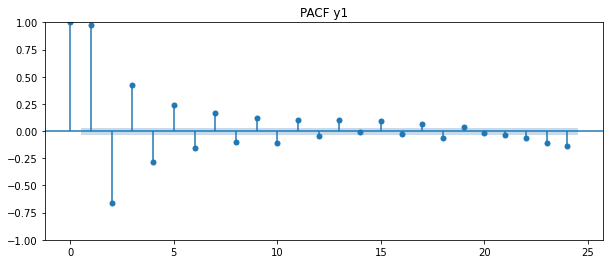

<Figure size 720x288 with 0 Axes>

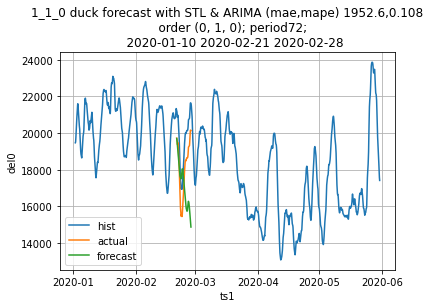

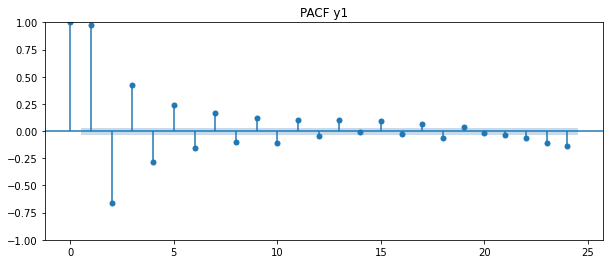

<Figure size 720x288 with 0 Axes>

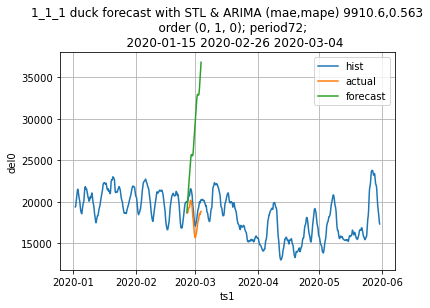

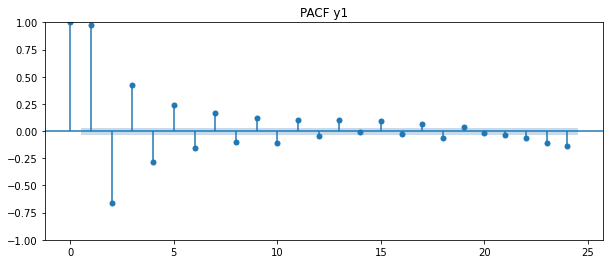

<Figure size 720x288 with 0 Axes>

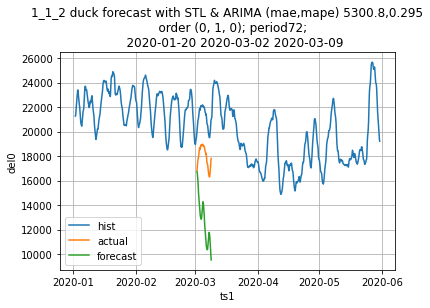

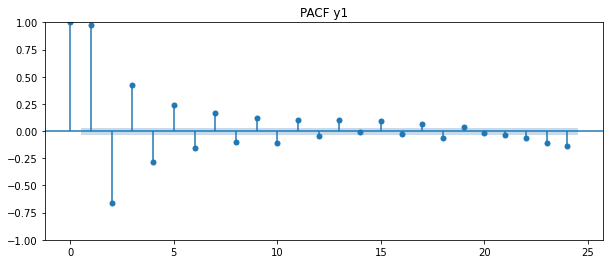

<Figure size 720x288 with 0 Axes>

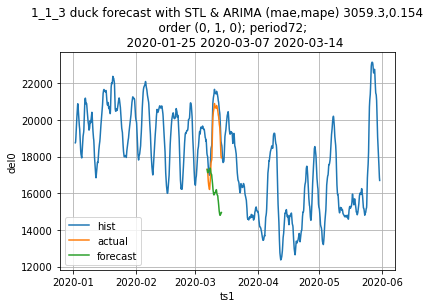

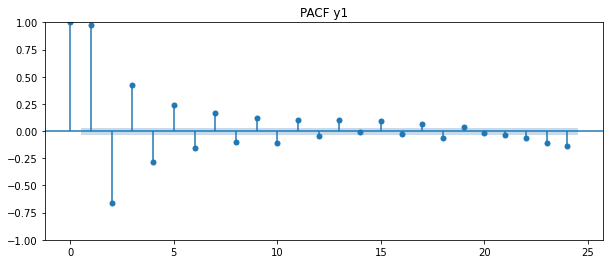

<Figure size 720x288 with 0 Axes>

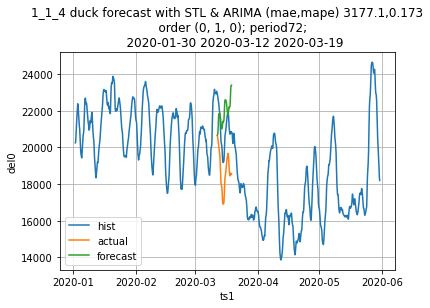

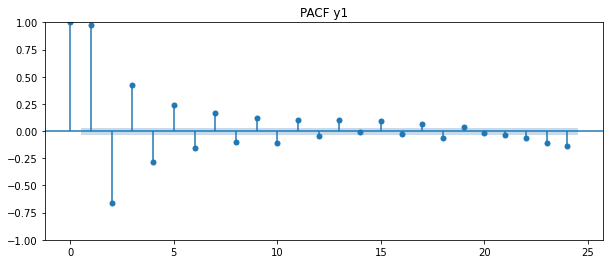

<Figure size 720x288 with 0 Axes>

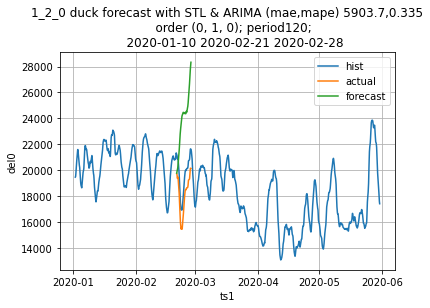

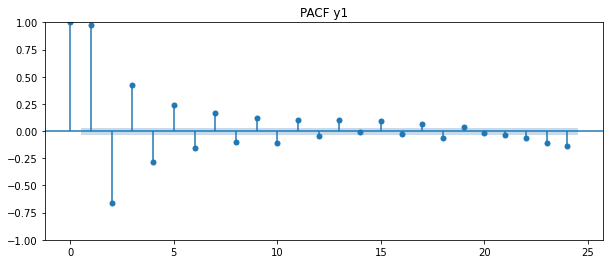

<Figure size 720x288 with 0 Axes>

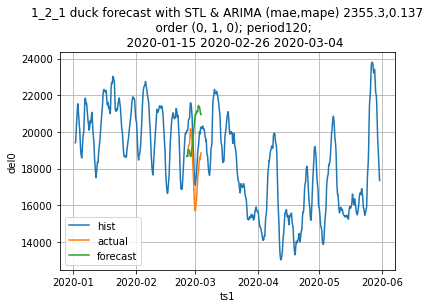

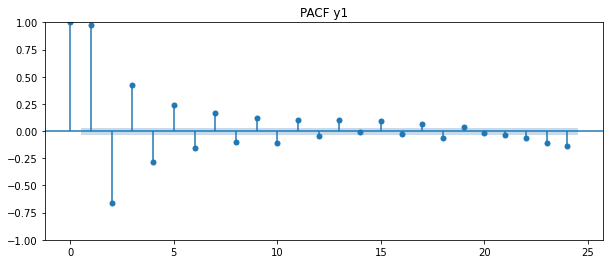

<Figure size 720x288 with 0 Axes>

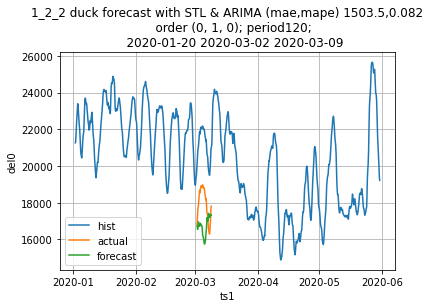

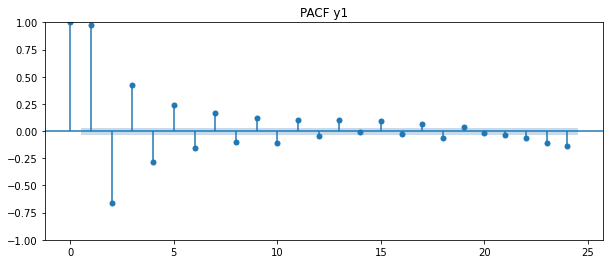

<Figure size 720x288 with 0 Axes>

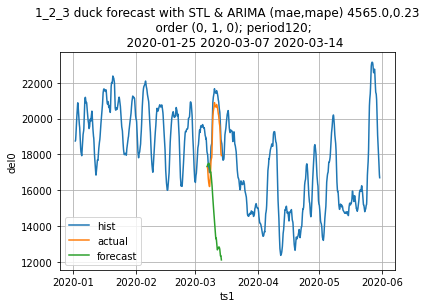

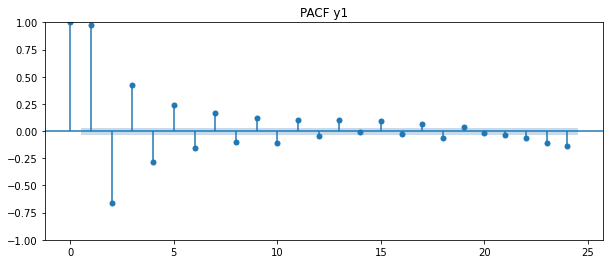

<Figure size 720x288 with 0 Axes>

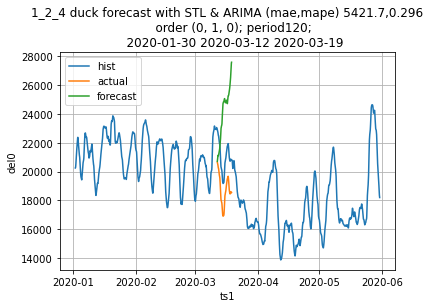

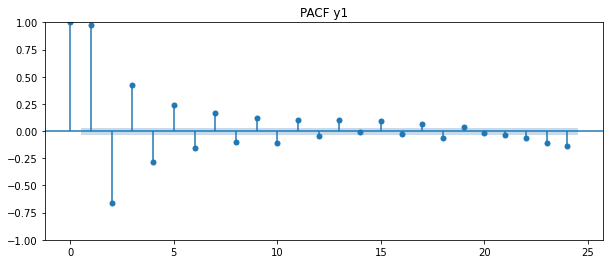

<Figure size 720x288 with 0 Axes>

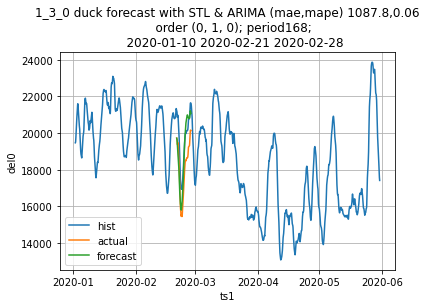

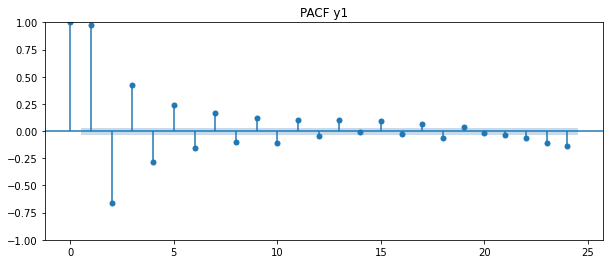

<Figure size 720x288 with 0 Axes>

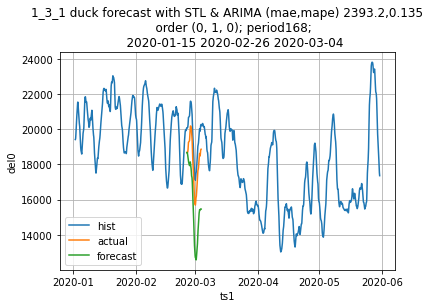

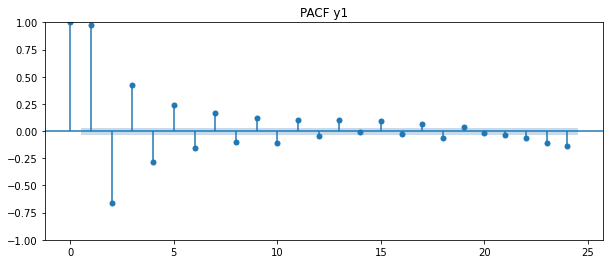

<Figure size 720x288 with 0 Axes>

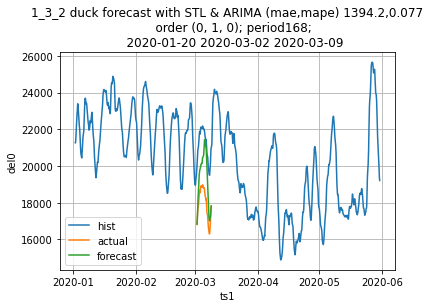

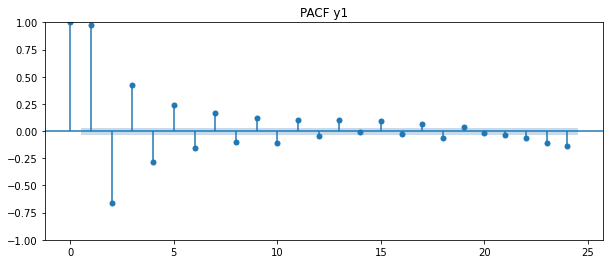

<Figure size 720x288 with 0 Axes>

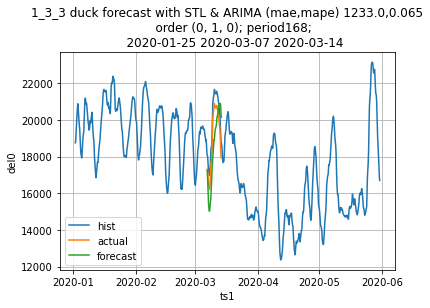

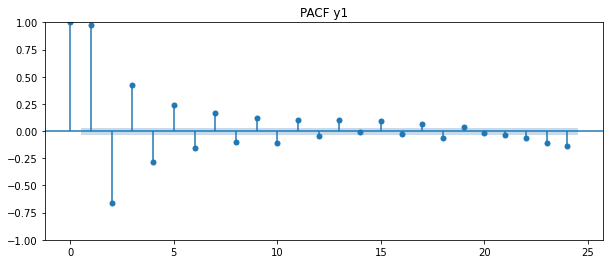

<Figure size 720x288 with 0 Axes>

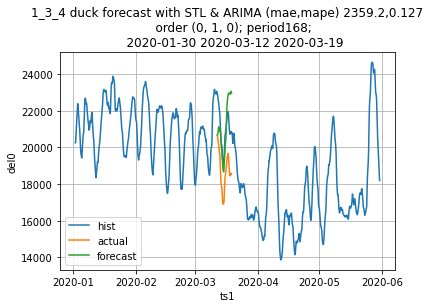

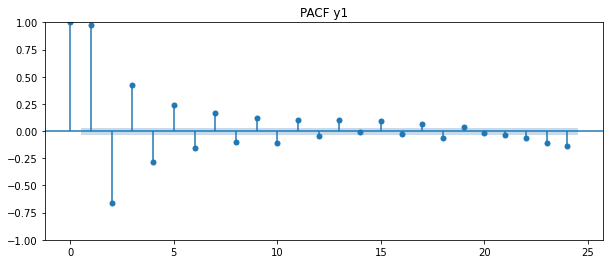

<Figure size 720x288 with 0 Axes>

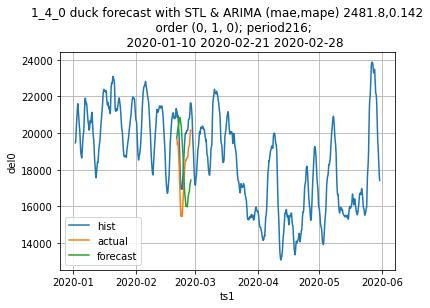

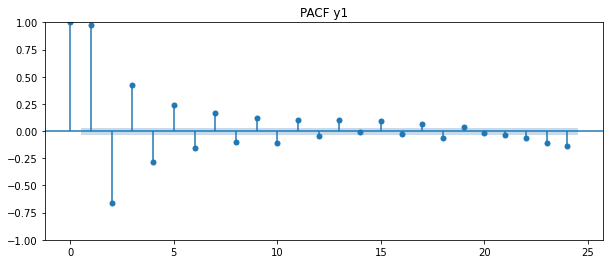

<Figure size 720x288 with 0 Axes>

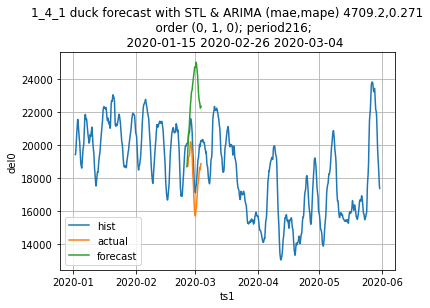

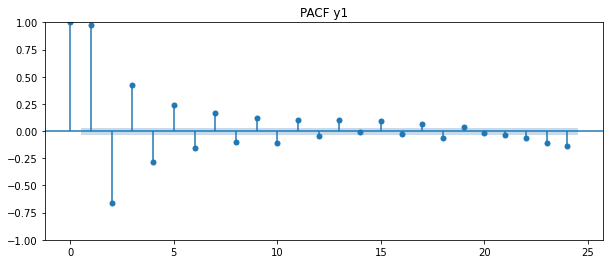

<Figure size 720x288 with 0 Axes>

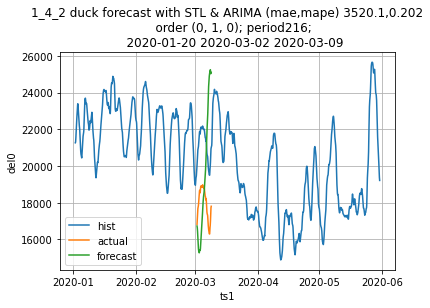

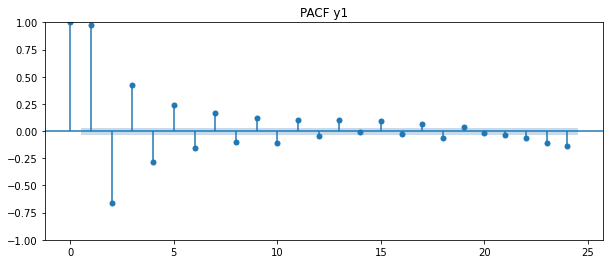

<Figure size 720x288 with 0 Axes>

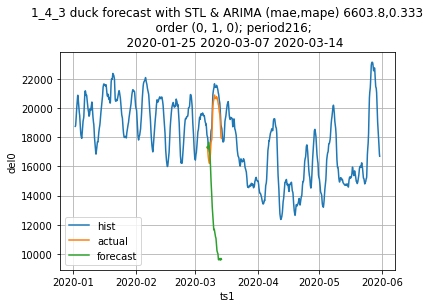

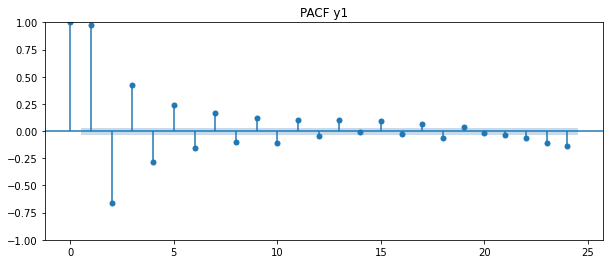

<Figure size 720x288 with 0 Axes>

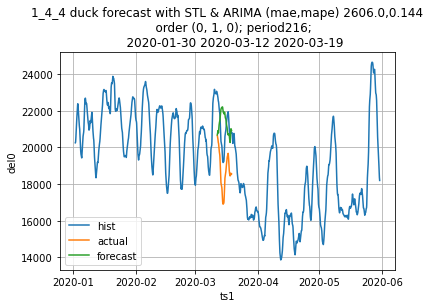

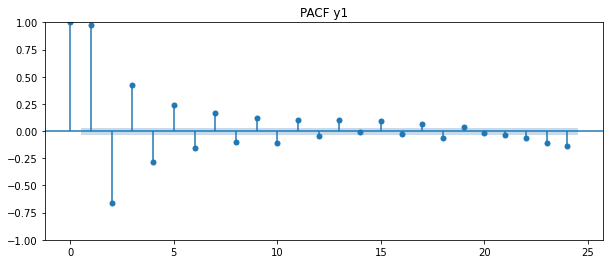

<Figure size 720x288 with 0 Axes>

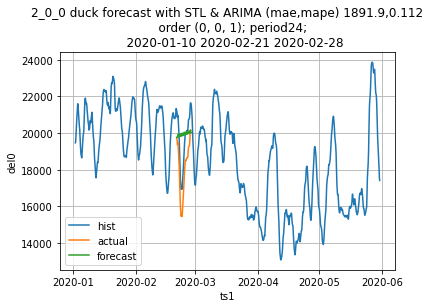

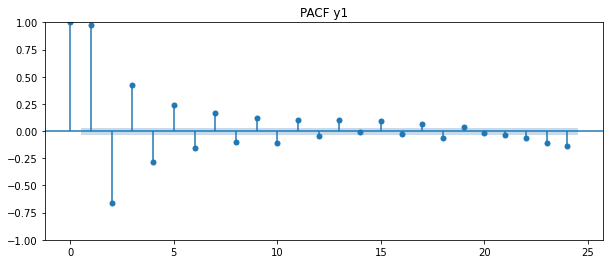

<Figure size 720x288 with 0 Axes>

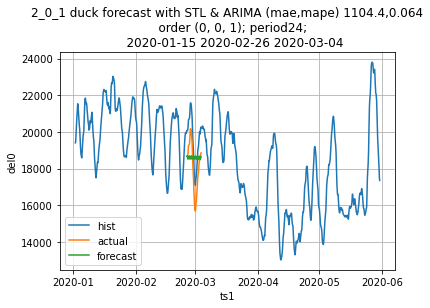

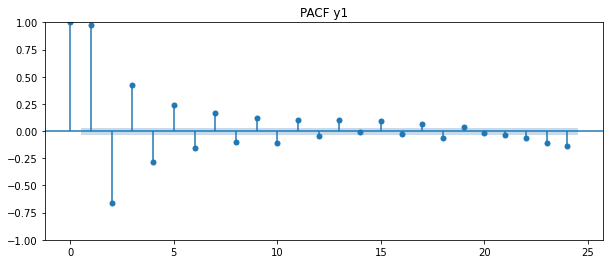

<Figure size 720x288 with 0 Axes>

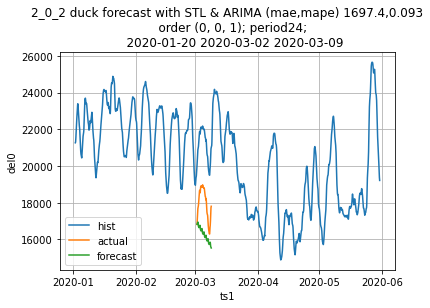

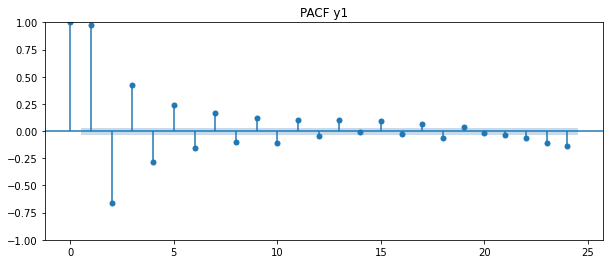

<Figure size 720x288 with 0 Axes>

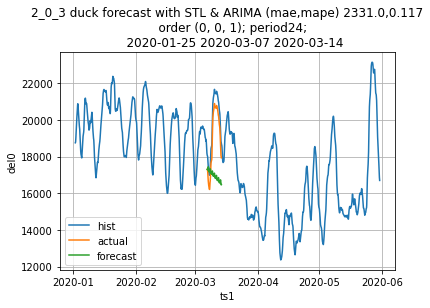

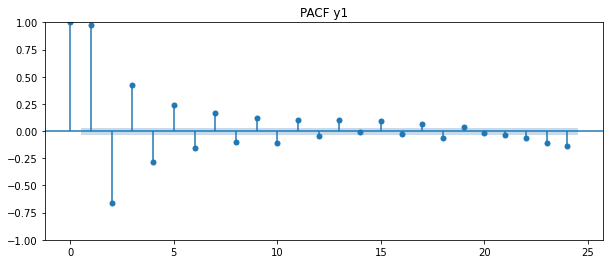

<Figure size 720x288 with 0 Axes>

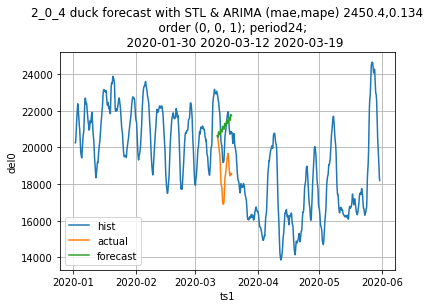

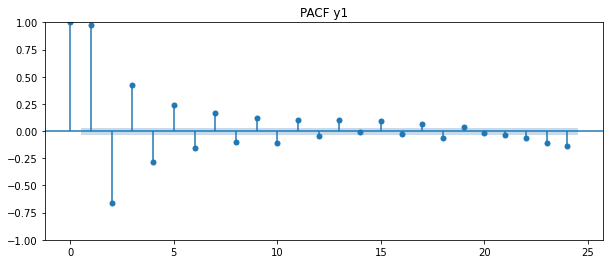

<Figure size 720x288 with 0 Axes>

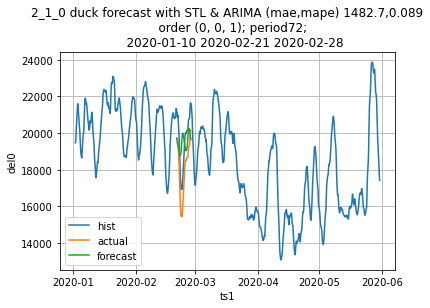

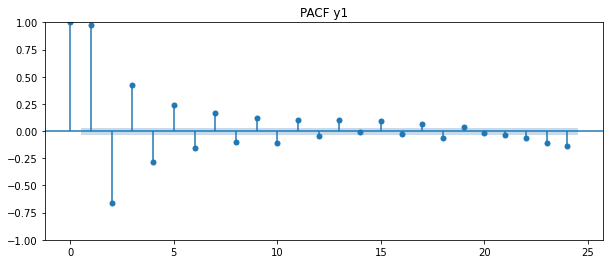

<Figure size 720x288 with 0 Axes>

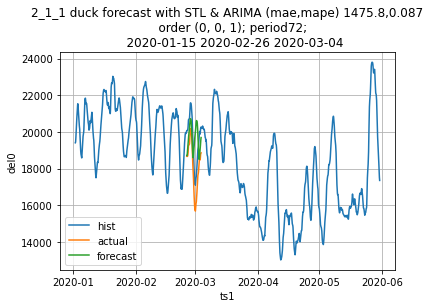

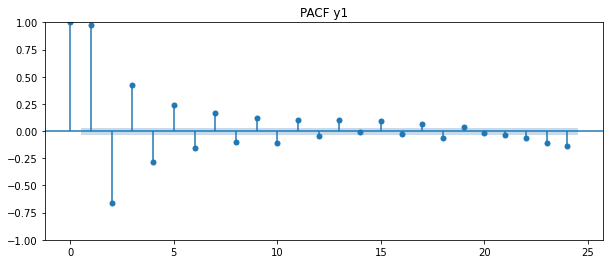

<Figure size 720x288 with 0 Axes>

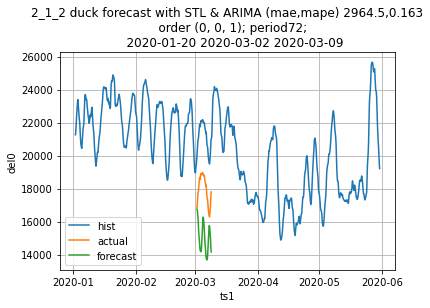

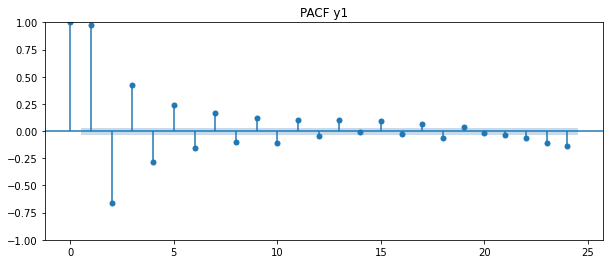

<Figure size 720x288 with 0 Axes>

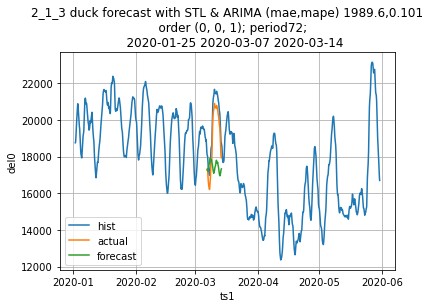

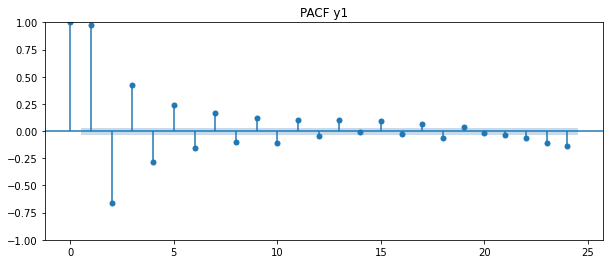

<Figure size 720x288 with 0 Axes>

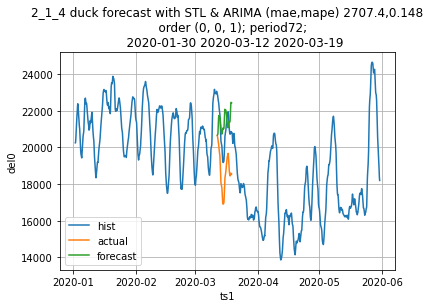

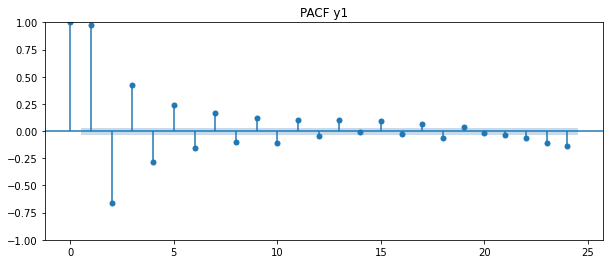

<Figure size 720x288 with 0 Axes>

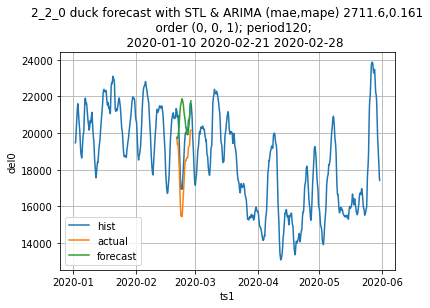

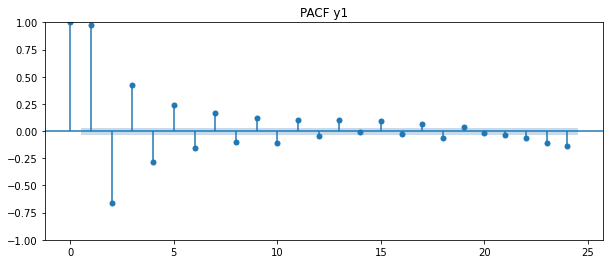

<Figure size 720x288 with 0 Axes>

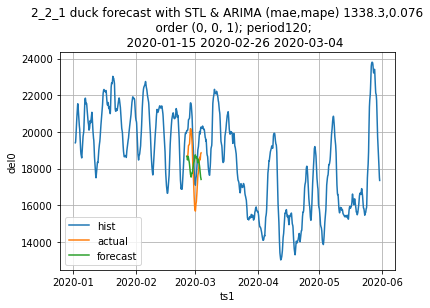

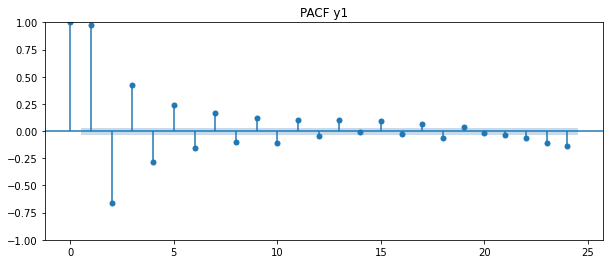

<Figure size 720x288 with 0 Axes>

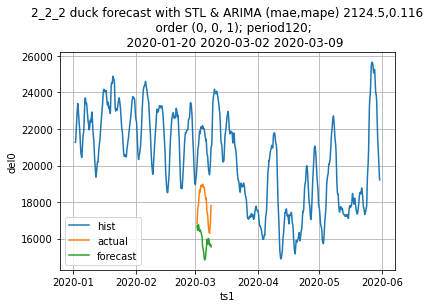

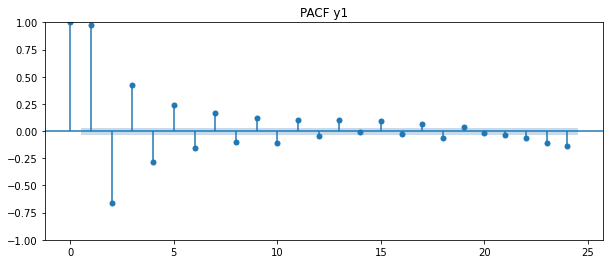

<Figure size 720x288 with 0 Axes>

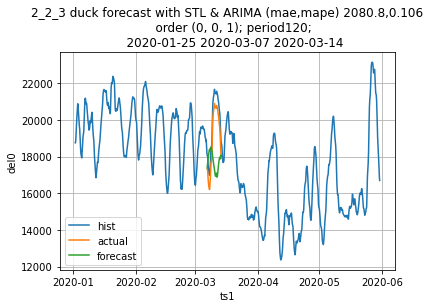

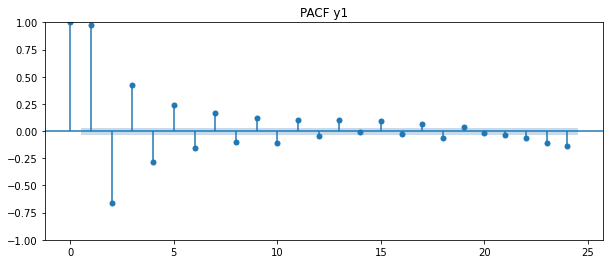

<Figure size 720x288 with 0 Axes>

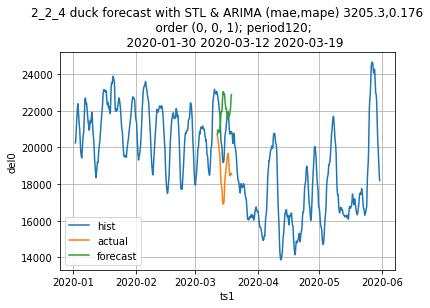

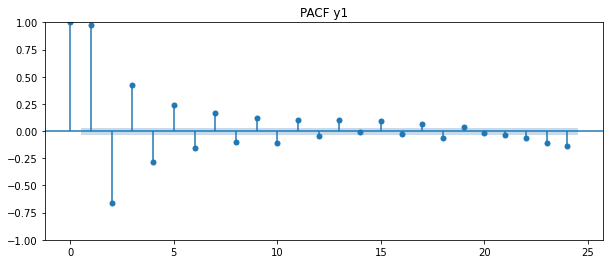

<Figure size 720x288 with 0 Axes>

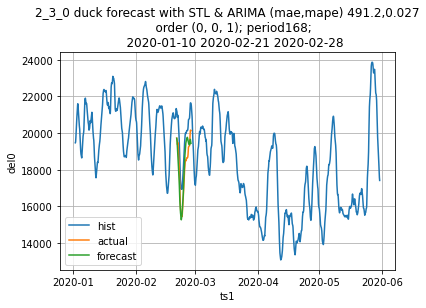

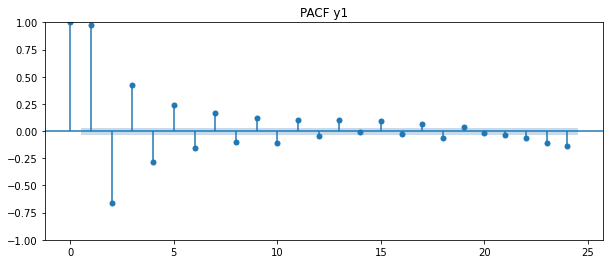

<Figure size 720x288 with 0 Axes>

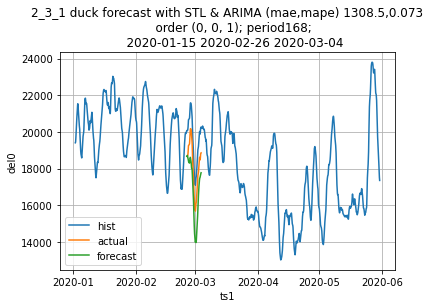

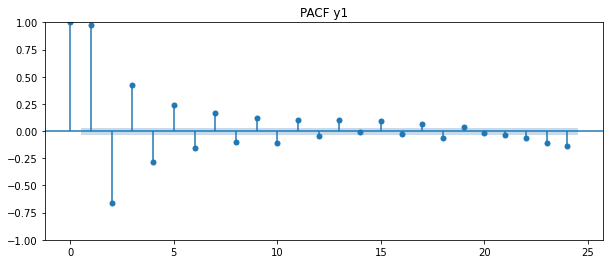

<Figure size 720x288 with 0 Axes>

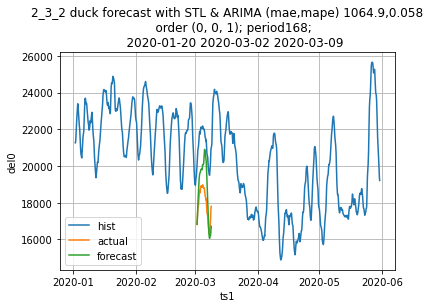

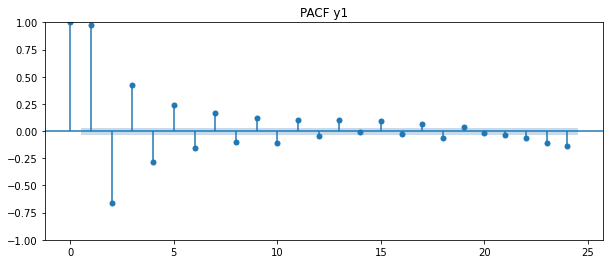

<Figure size 720x288 with 0 Axes>

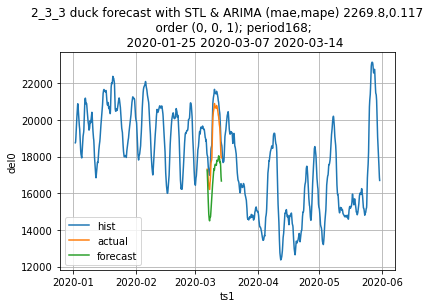

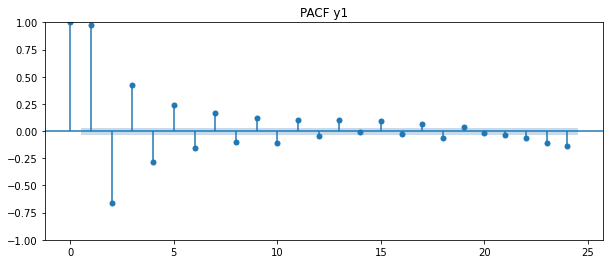

<Figure size 720x288 with 0 Axes>

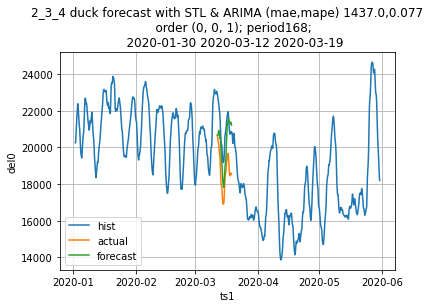

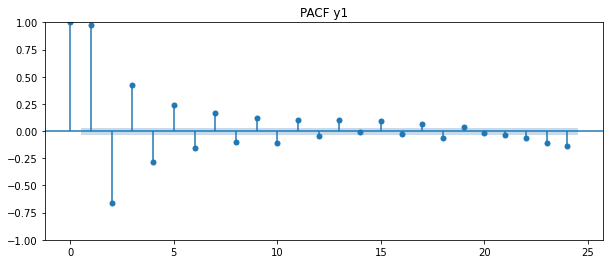

<Figure size 720x288 with 0 Axes>

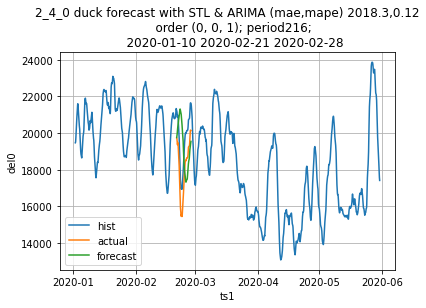

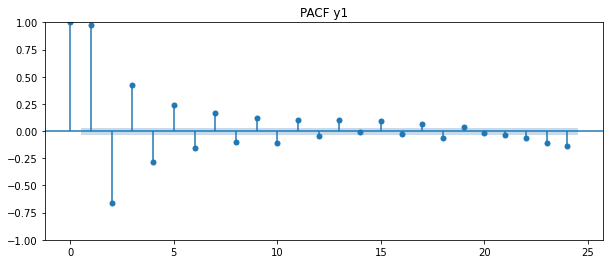

<Figure size 720x288 with 0 Axes>

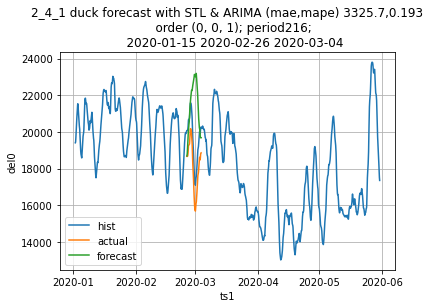

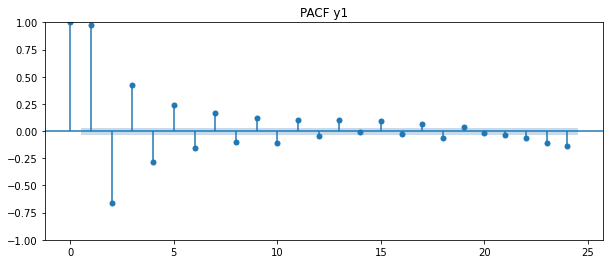

<Figure size 720x288 with 0 Axes>

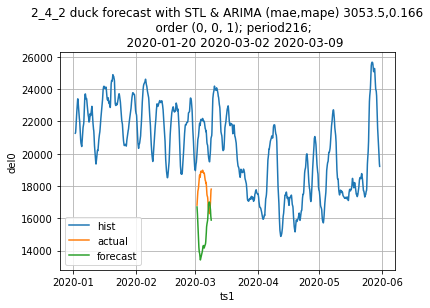

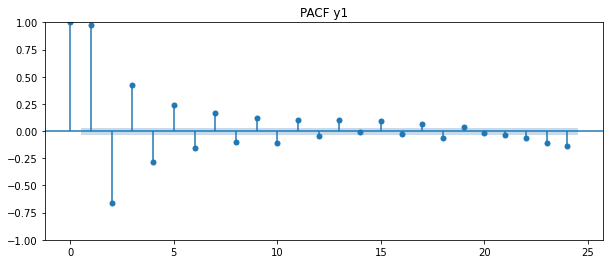

<Figure size 720x288 with 0 Axes>

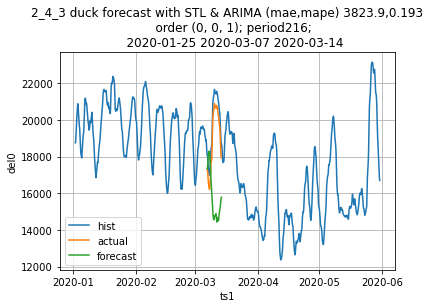

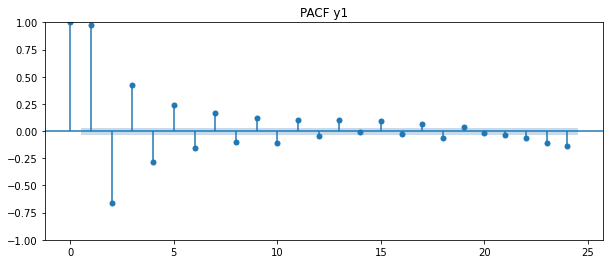

<Figure size 720x288 with 0 Axes>

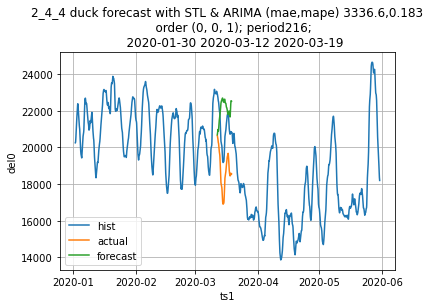

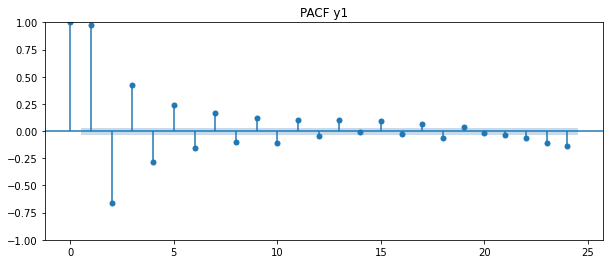

<Figure size 720x288 with 0 Axes>

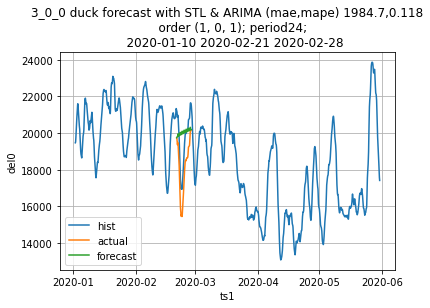

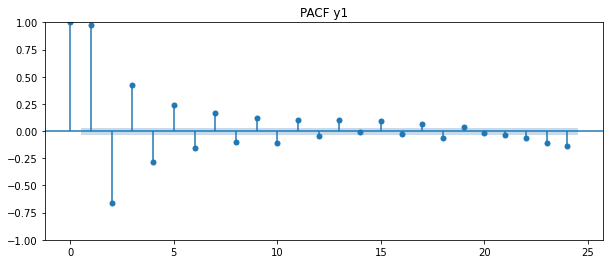

<Figure size 720x288 with 0 Axes>

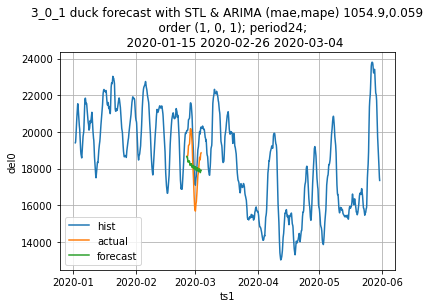

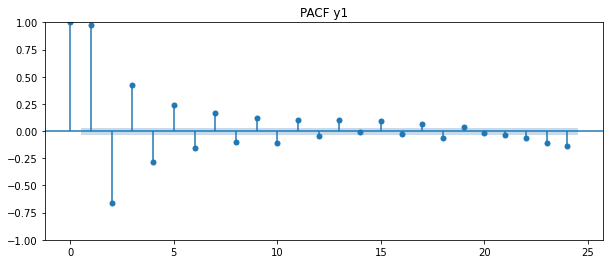

<Figure size 720x288 with 0 Axes>

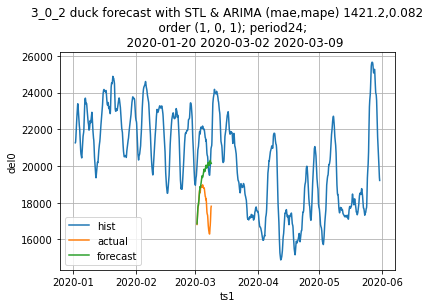

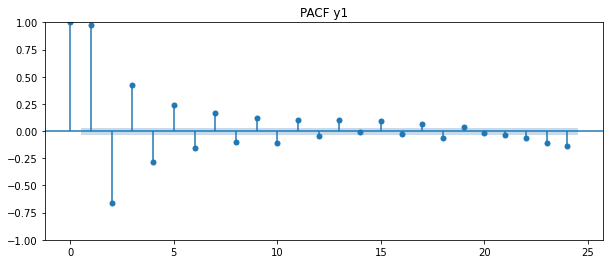

<Figure size 720x288 with 0 Axes>

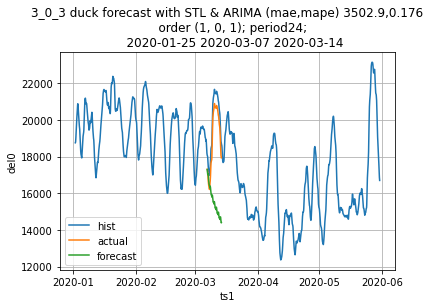

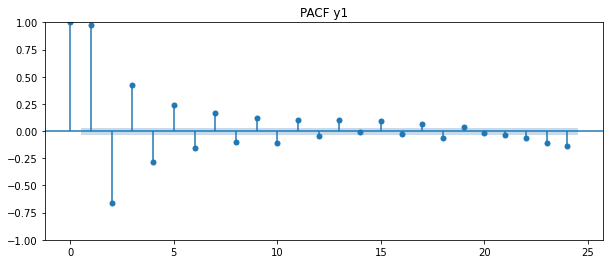

<Figure size 720x288 with 0 Axes>

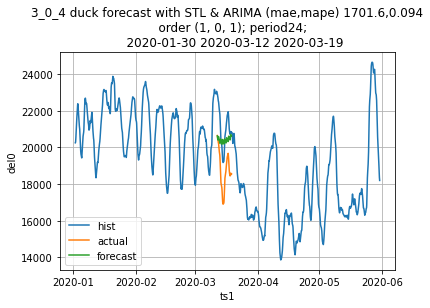

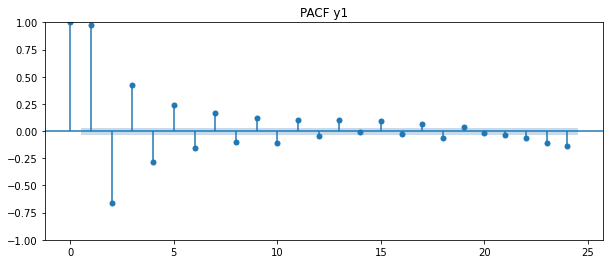

<Figure size 720x288 with 0 Axes>

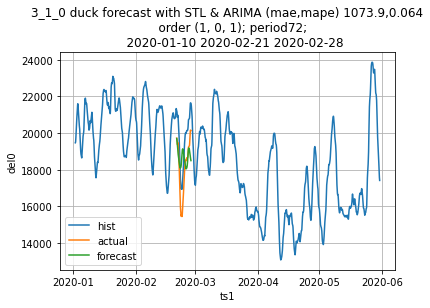

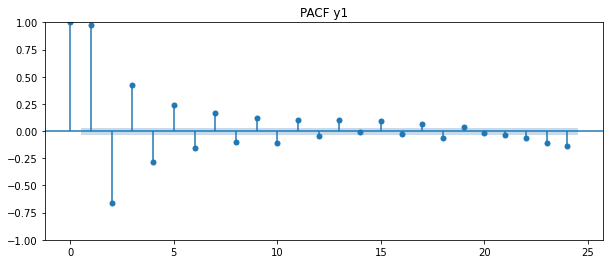

<Figure size 720x288 with 0 Axes>

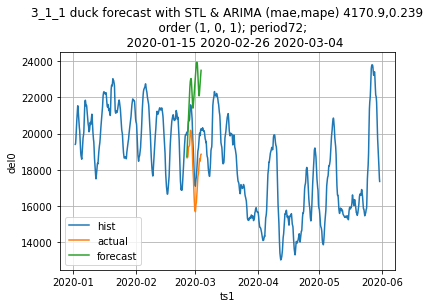

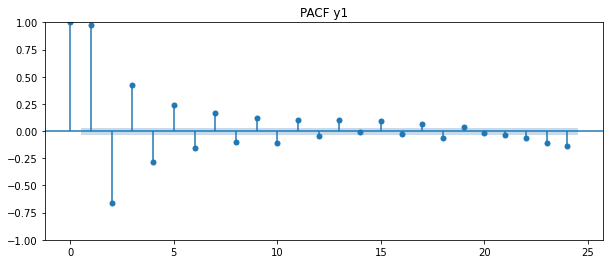

<Figure size 720x288 with 0 Axes>

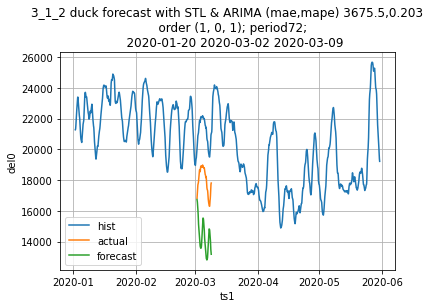

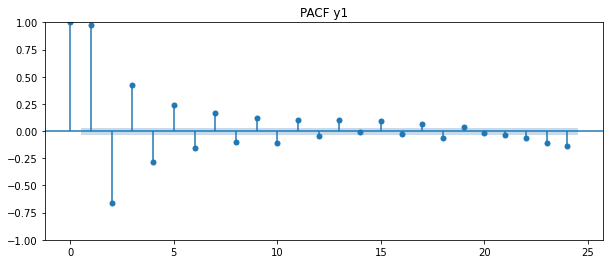

<Figure size 720x288 with 0 Axes>

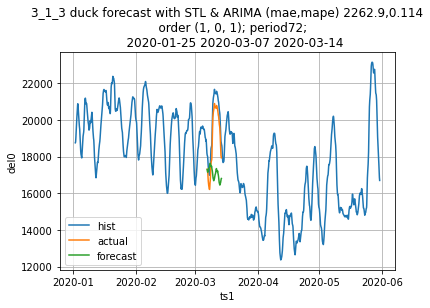

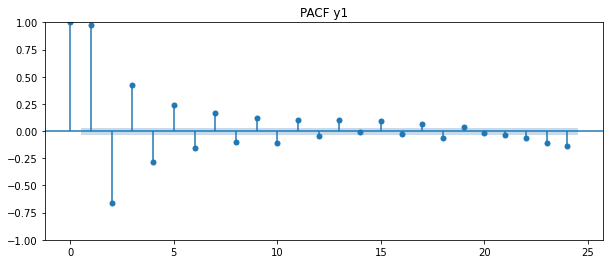

<Figure size 720x288 with 0 Axes>

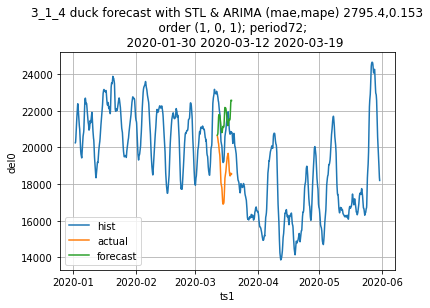

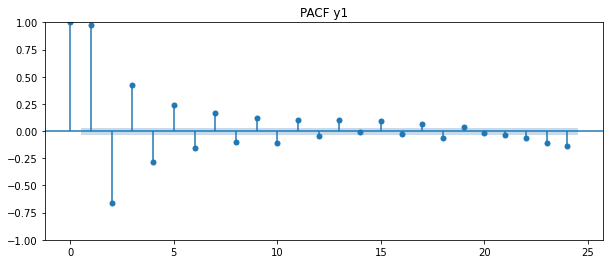

<Figure size 720x288 with 0 Axes>

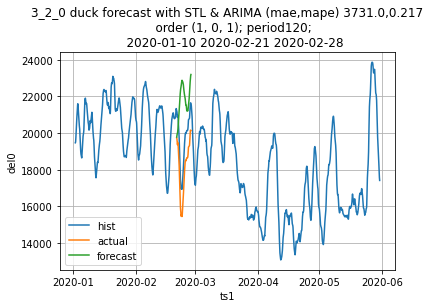

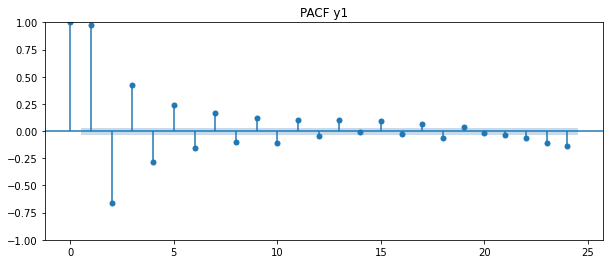

<Figure size 720x288 with 0 Axes>

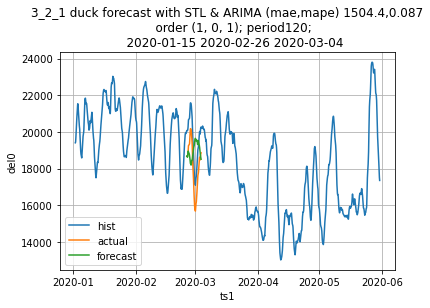

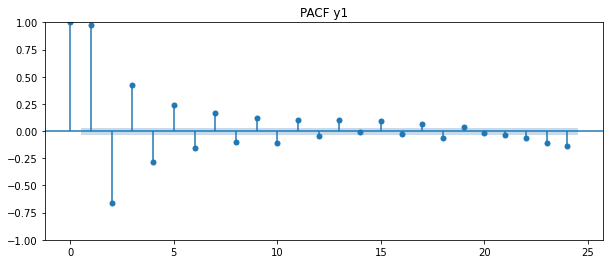

<Figure size 720x288 with 0 Axes>

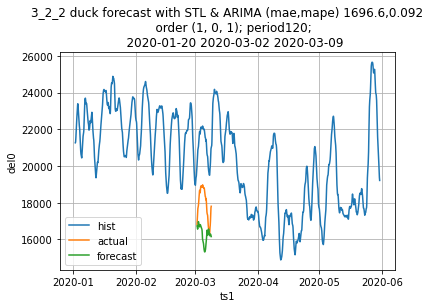

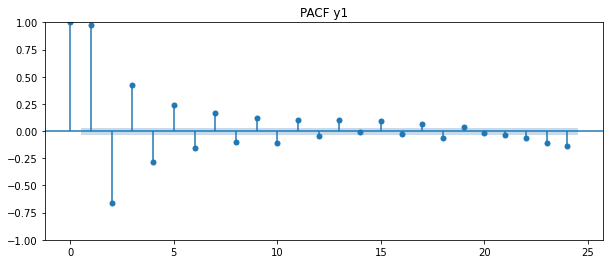

<Figure size 720x288 with 0 Axes>

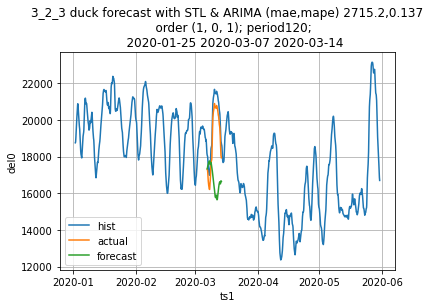

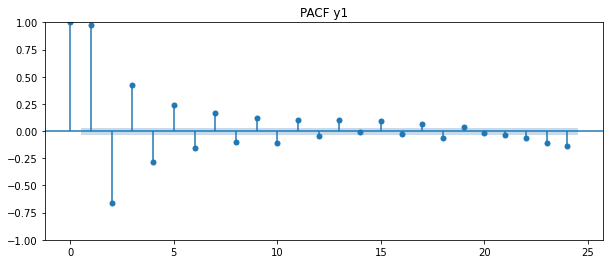

<Figure size 720x288 with 0 Axes>

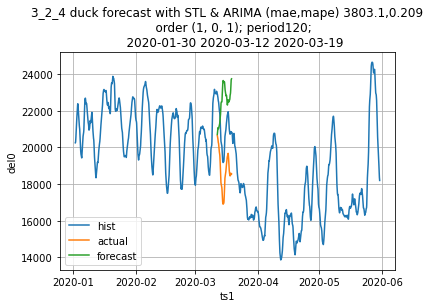

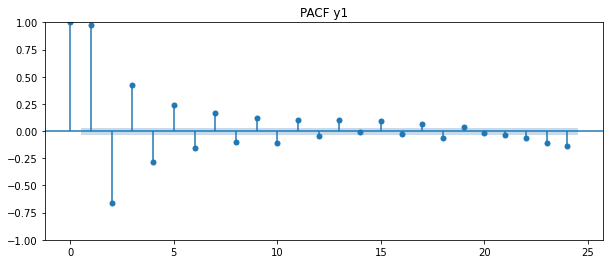

<Figure size 720x288 with 0 Axes>

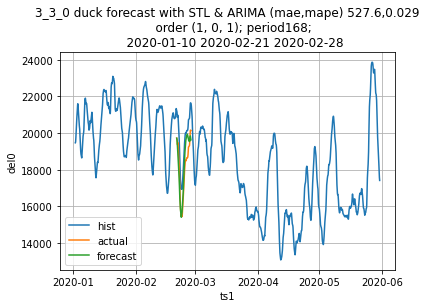

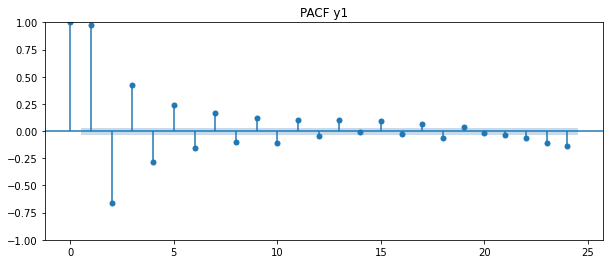

<Figure size 720x288 with 0 Axes>

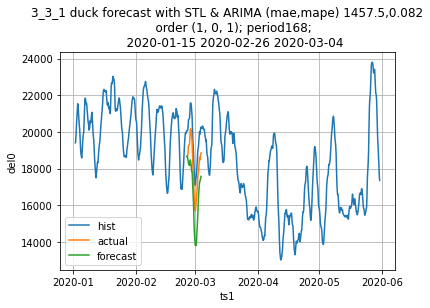

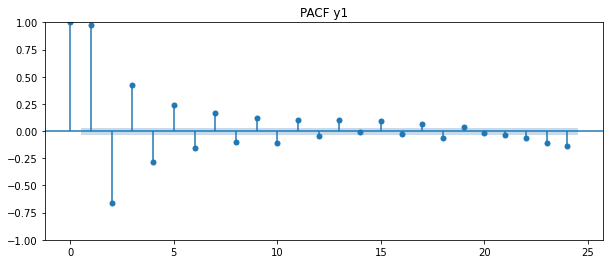

<Figure size 720x288 with 0 Axes>

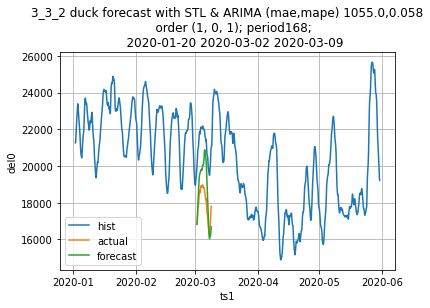

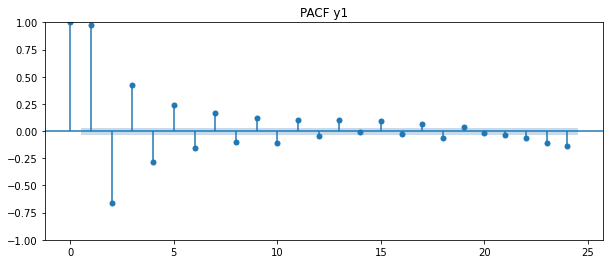

<Figure size 720x288 with 0 Axes>

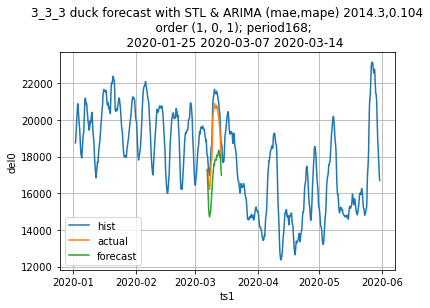

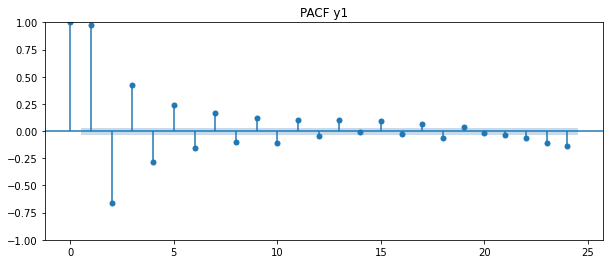

<Figure size 720x288 with 0 Axes>

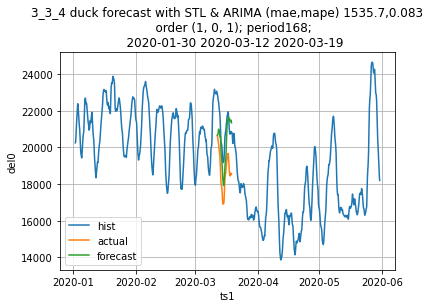

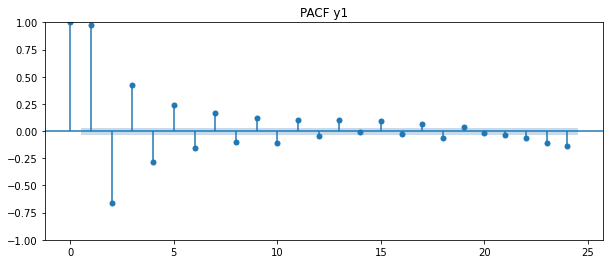

<Figure size 720x288 with 0 Axes>

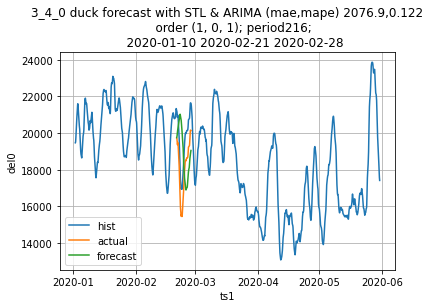

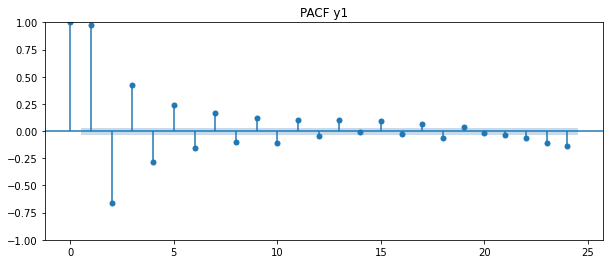

<Figure size 720x288 with 0 Axes>

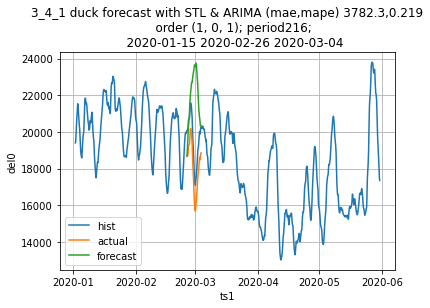

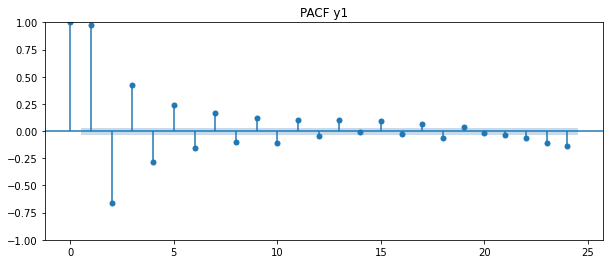

<Figure size 720x288 with 0 Axes>

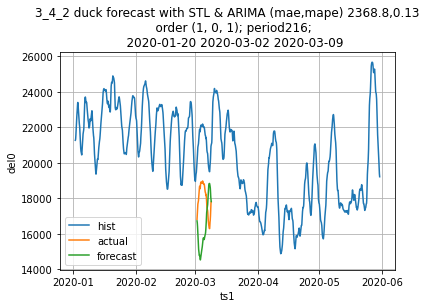

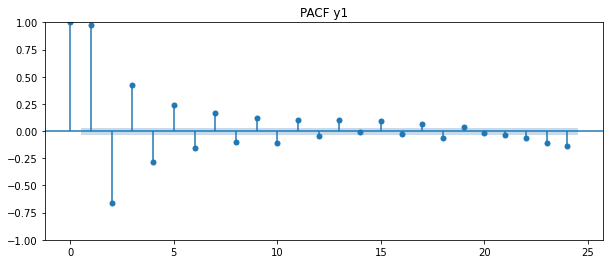

<Figure size 720x288 with 0 Axes>

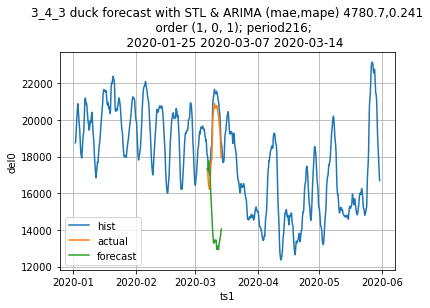

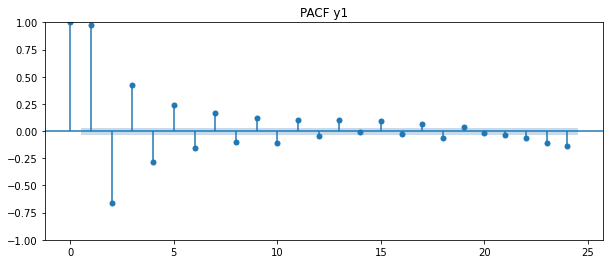

<Figure size 720x288 with 0 Axes>

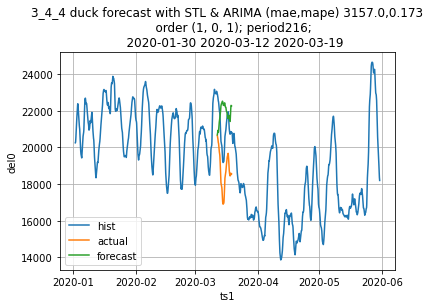

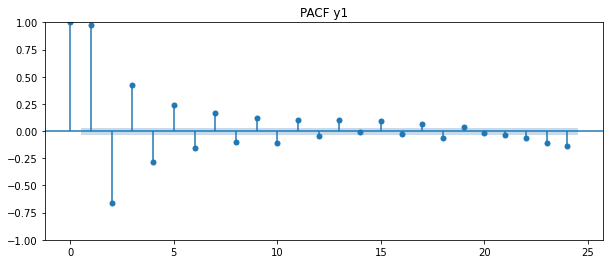

<Figure size 720x288 with 0 Axes>

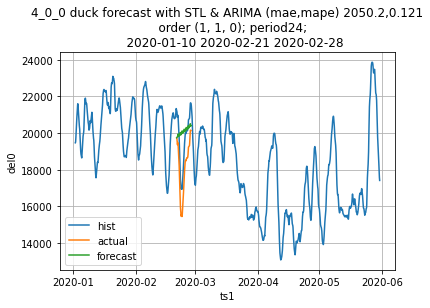

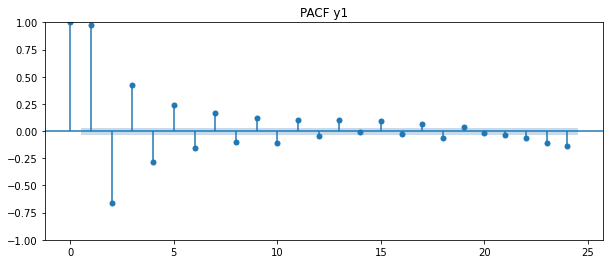

<Figure size 720x288 with 0 Axes>

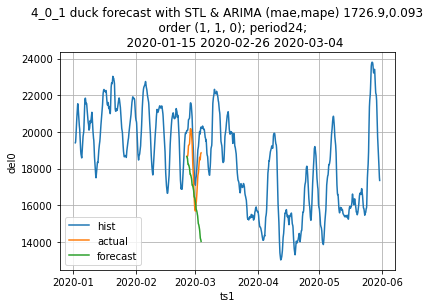

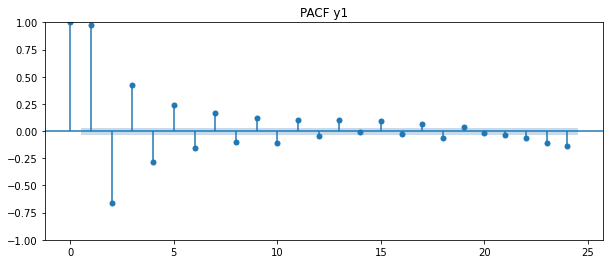

<Figure size 720x288 with 0 Axes>

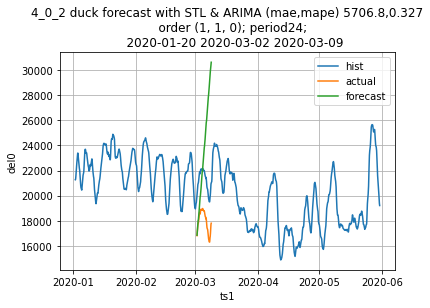

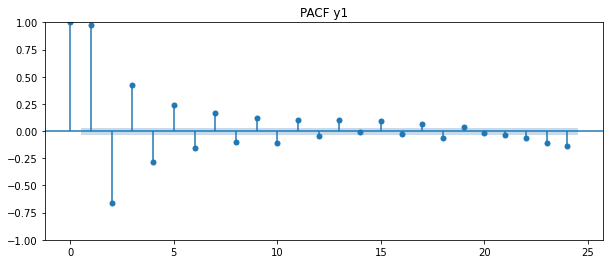

<Figure size 720x288 with 0 Axes>

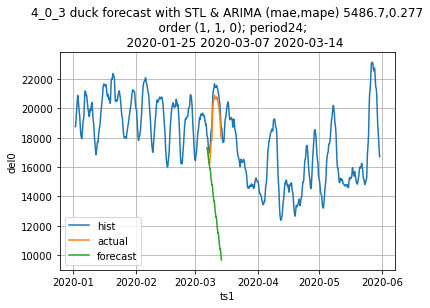

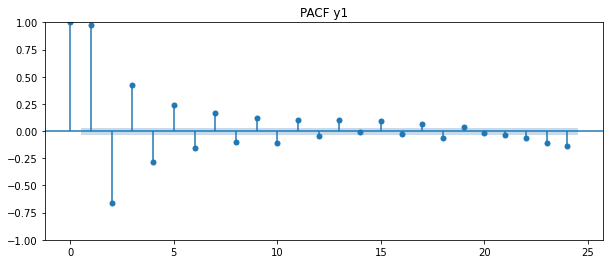

<Figure size 720x288 with 0 Axes>

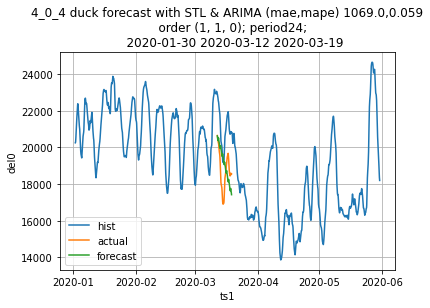

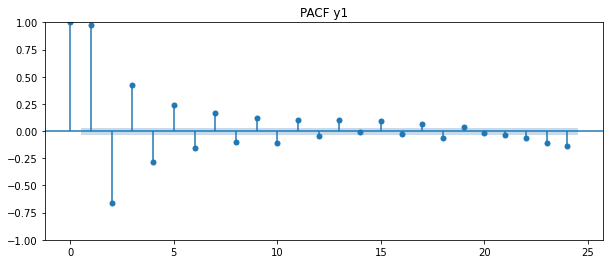

<Figure size 720x288 with 0 Axes>

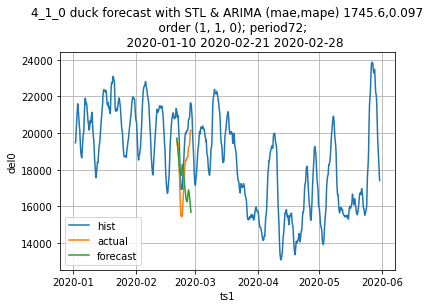

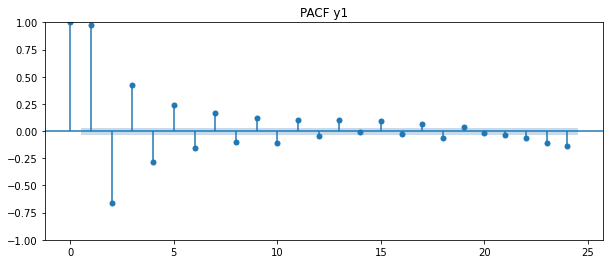

<Figure size 720x288 with 0 Axes>

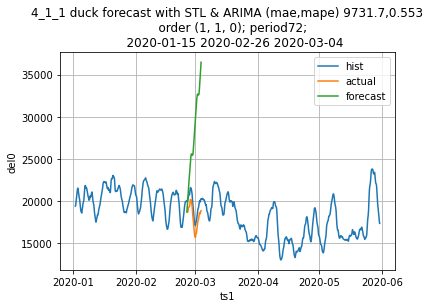

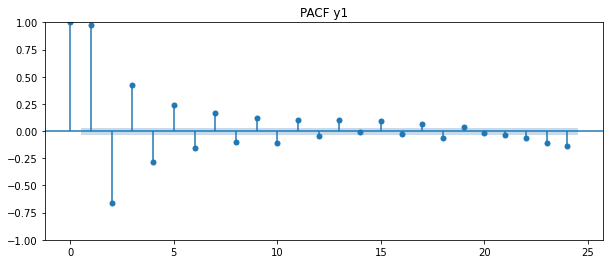

<Figure size 720x288 with 0 Axes>

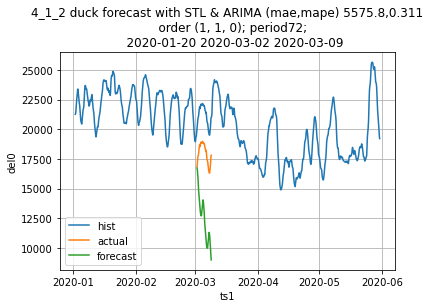

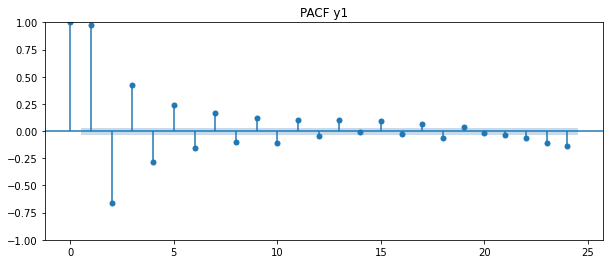

<Figure size 720x288 with 0 Axes>

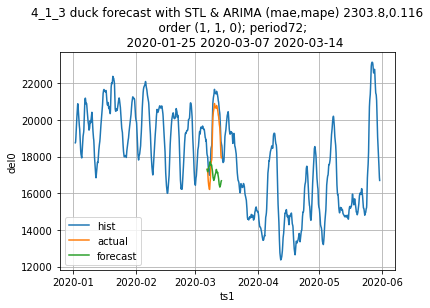

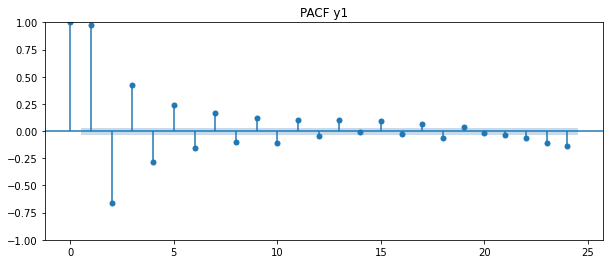

<Figure size 720x288 with 0 Axes>

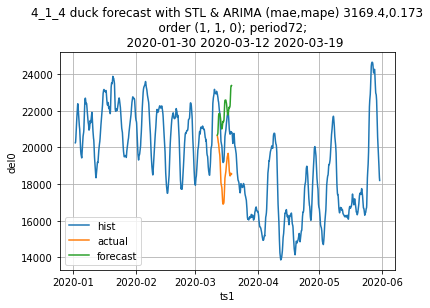

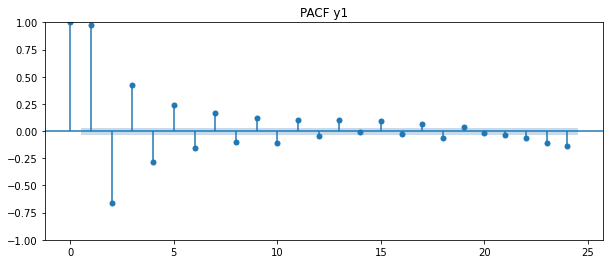

<Figure size 720x288 with 0 Axes>

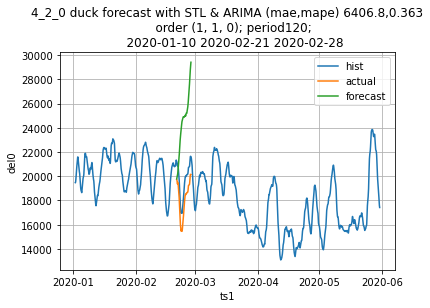

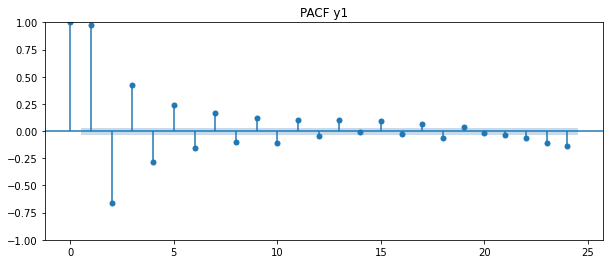

<Figure size 720x288 with 0 Axes>

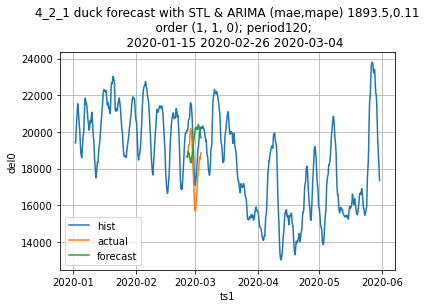

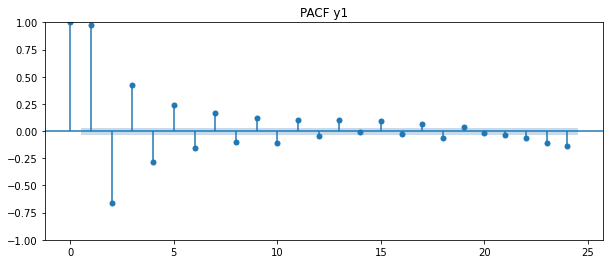

<Figure size 720x288 with 0 Axes>

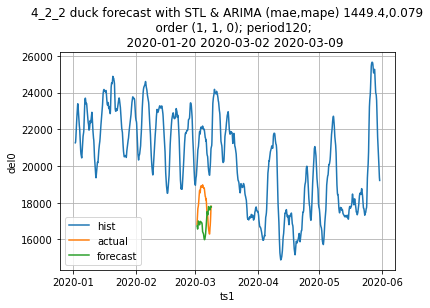

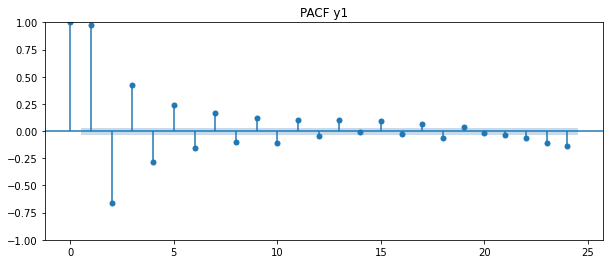

<Figure size 720x288 with 0 Axes>

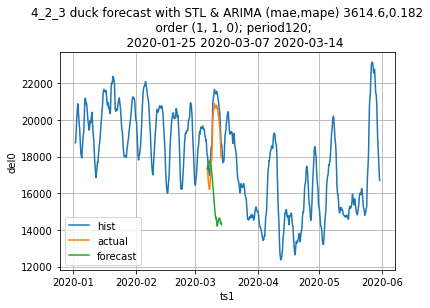

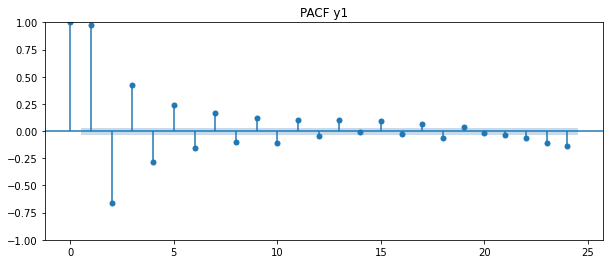

<Figure size 720x288 with 0 Axes>

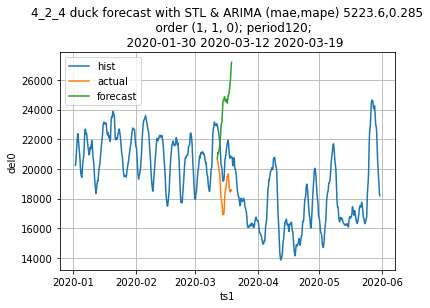

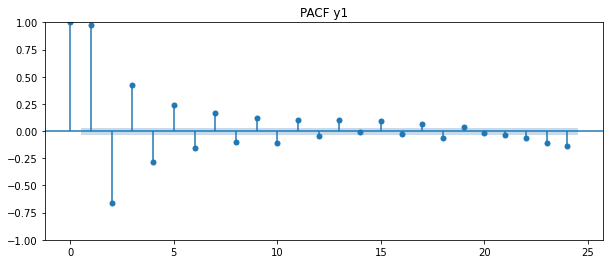

<Figure size 720x288 with 0 Axes>

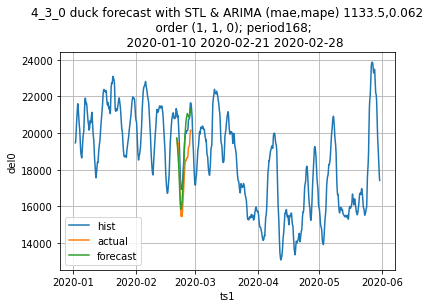

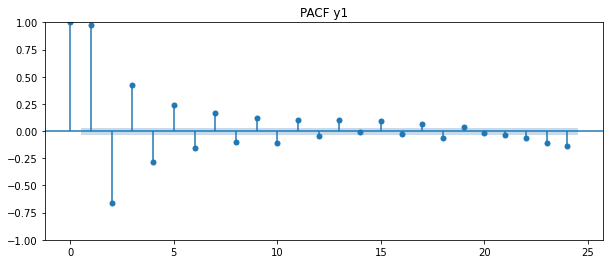

<Figure size 720x288 with 0 Axes>

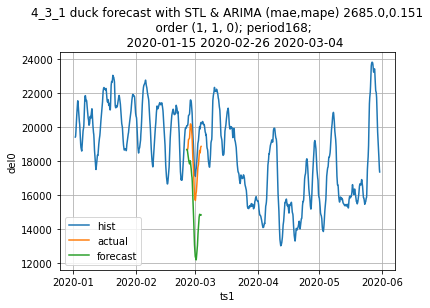

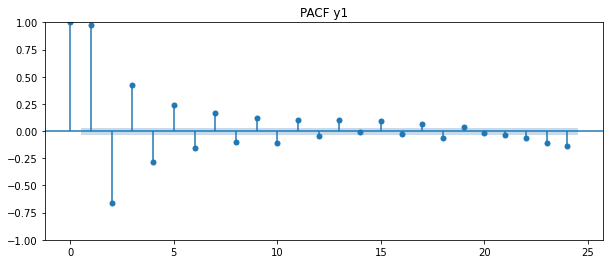

<Figure size 720x288 with 0 Axes>

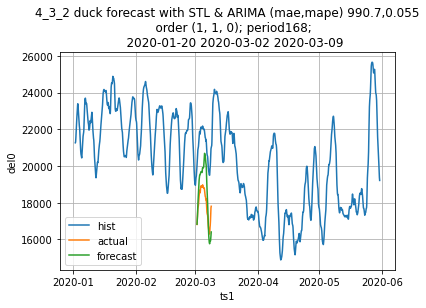

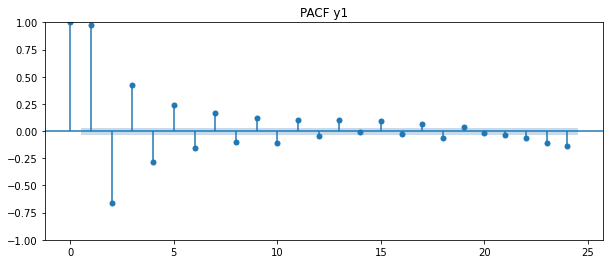

<Figure size 720x288 with 0 Axes>

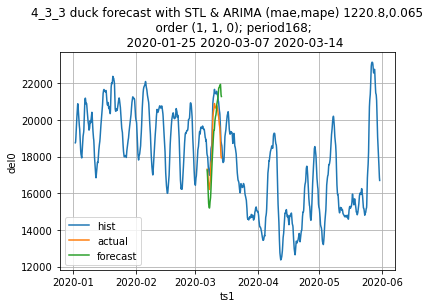

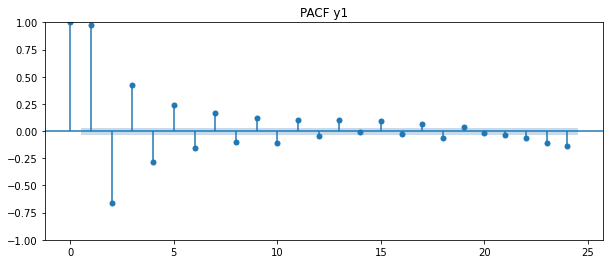

<Figure size 720x288 with 0 Axes>

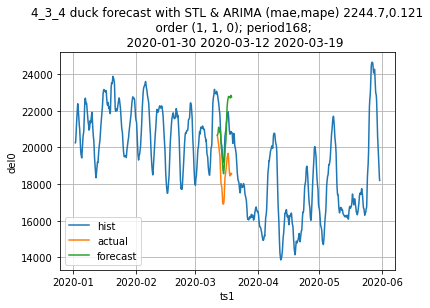

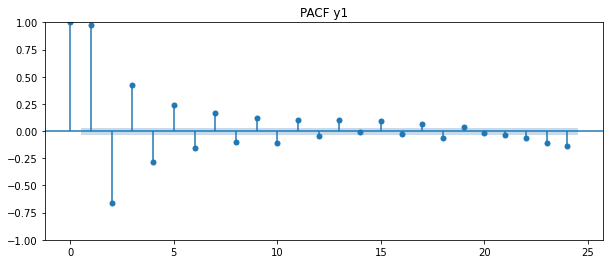

<Figure size 720x288 with 0 Axes>

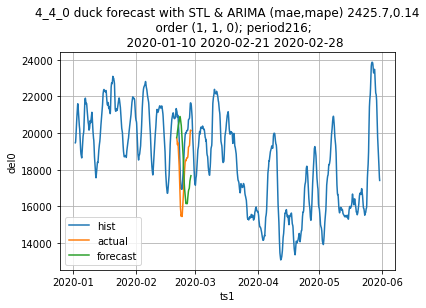

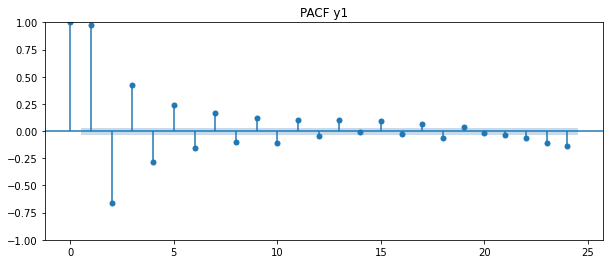

<Figure size 720x288 with 0 Axes>

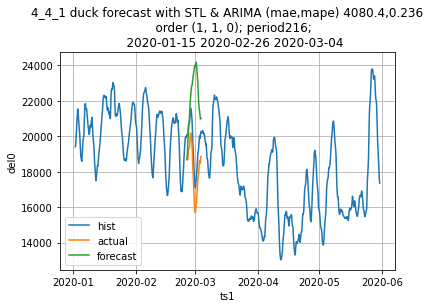

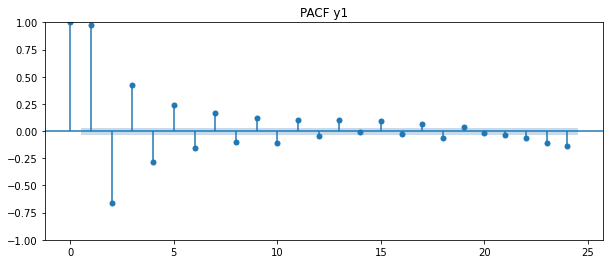

<Figure size 720x288 with 0 Axes>

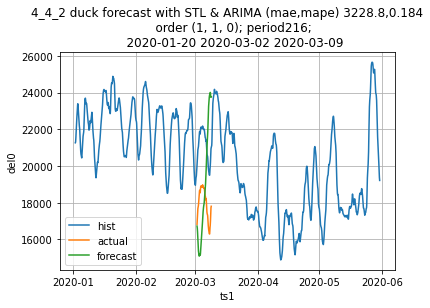

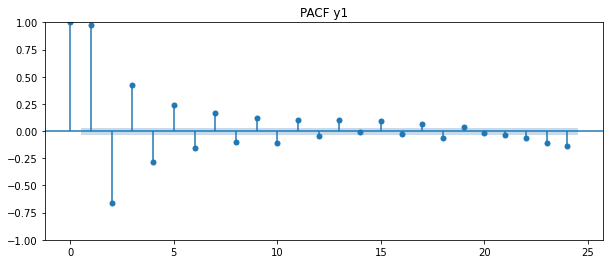

<Figure size 720x288 with 0 Axes>

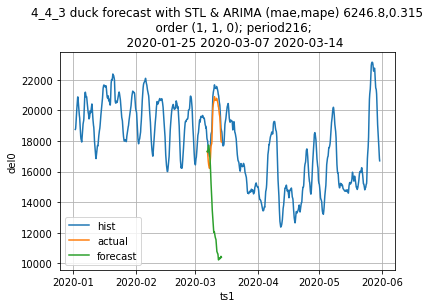

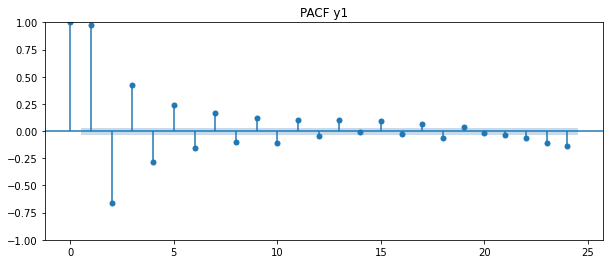

<Figure size 720x288 with 0 Axes>

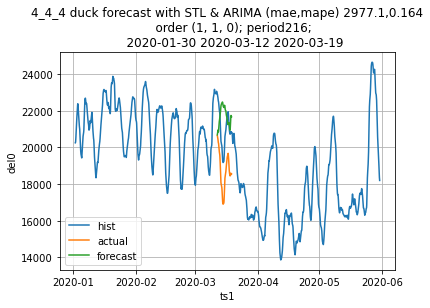

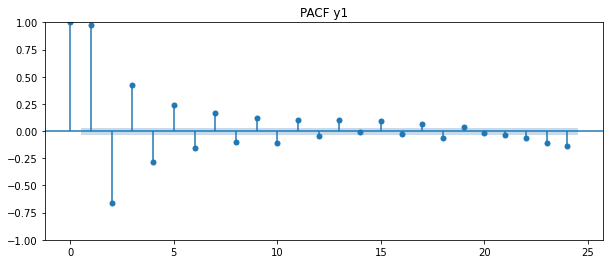

<Figure size 720x288 with 0 Axes>

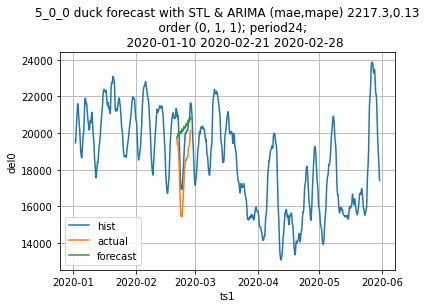

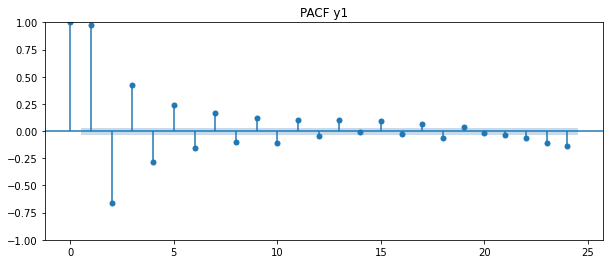

<Figure size 720x288 with 0 Axes>

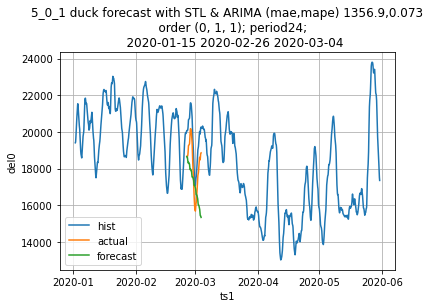

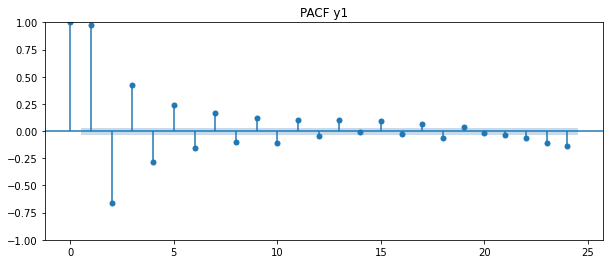

<Figure size 720x288 with 0 Axes>

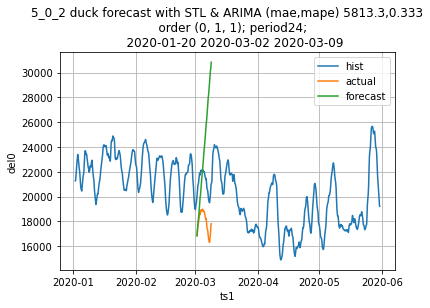

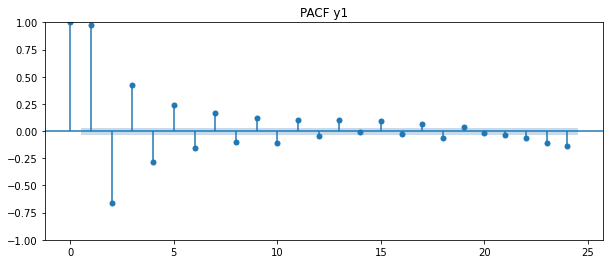

<Figure size 720x288 with 0 Axes>

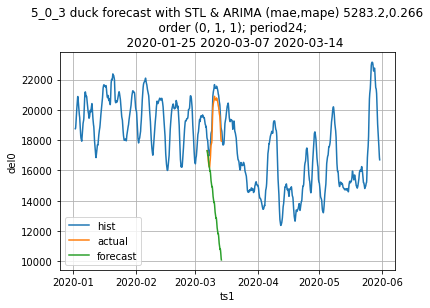

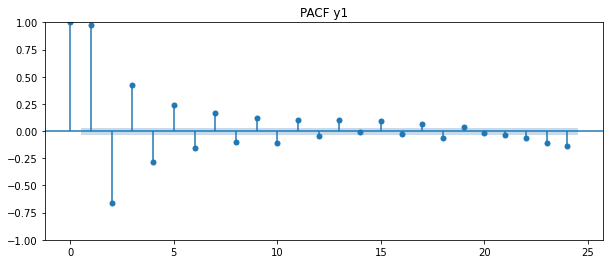

<Figure size 720x288 with 0 Axes>

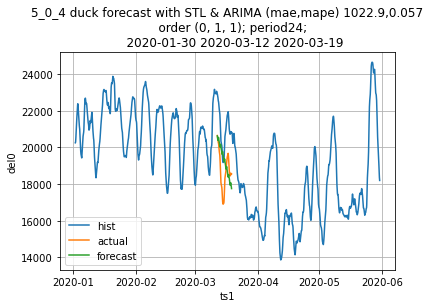

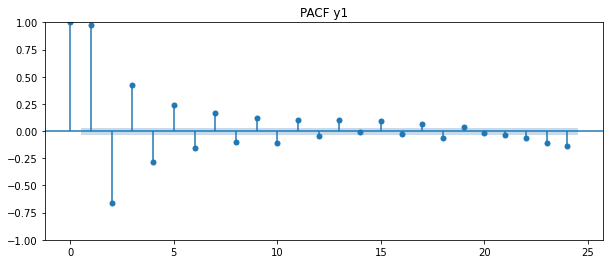

<Figure size 720x288 with 0 Axes>

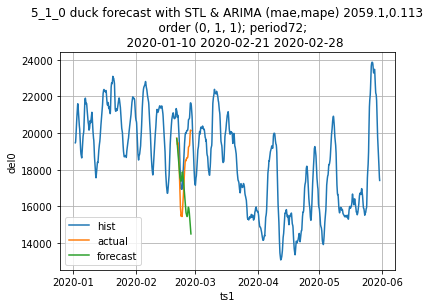

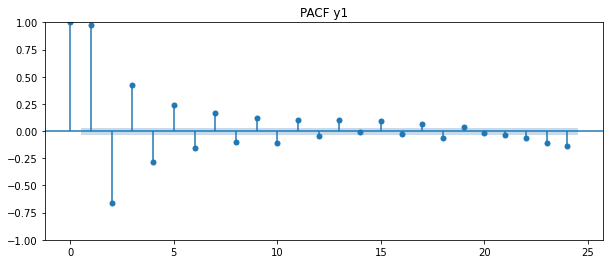

<Figure size 720x288 with 0 Axes>

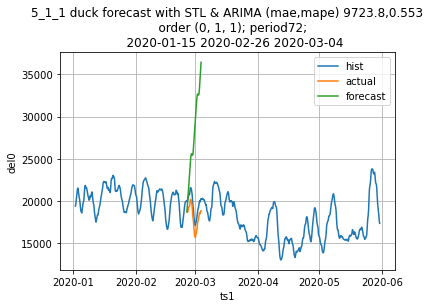

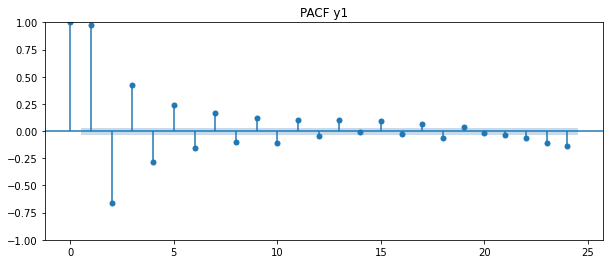

<Figure size 720x288 with 0 Axes>

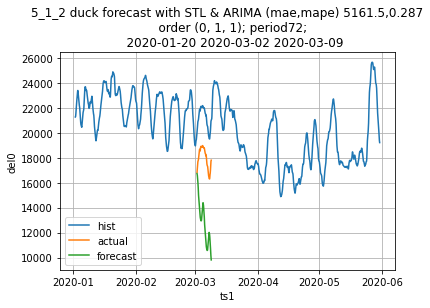

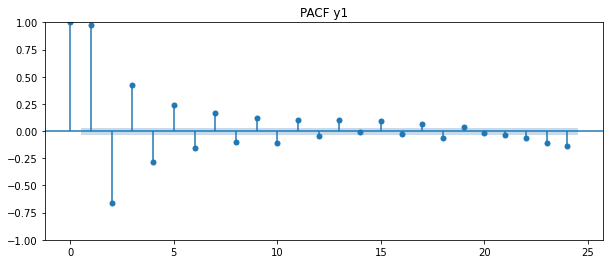

<Figure size 720x288 with 0 Axes>

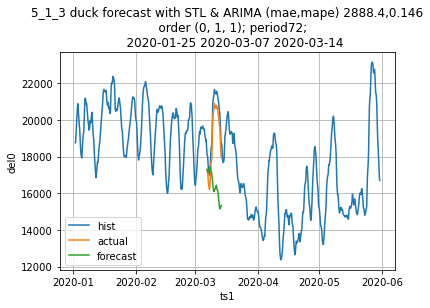

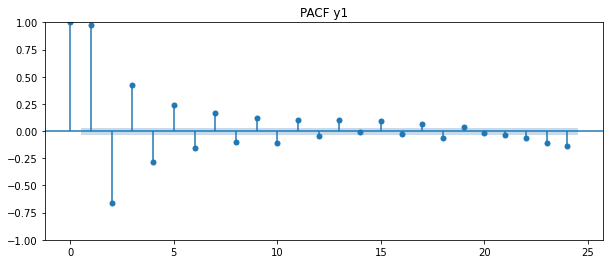

<Figure size 720x288 with 0 Axes>

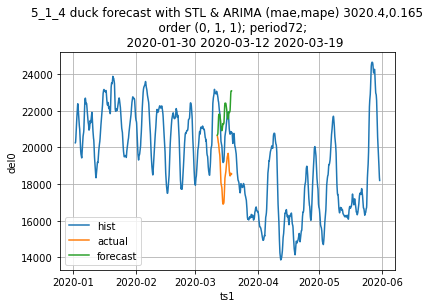

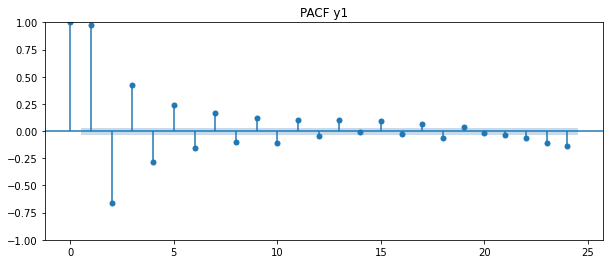

<Figure size 720x288 with 0 Axes>

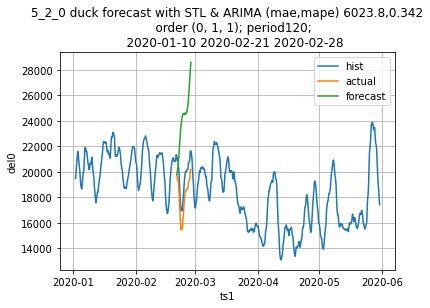

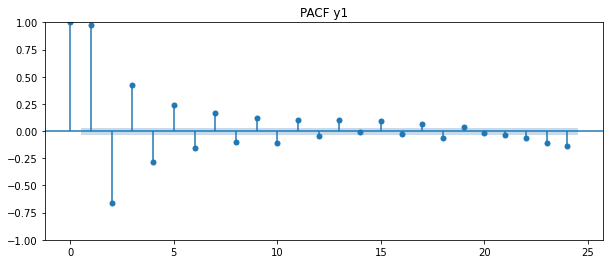

<Figure size 720x288 with 0 Axes>

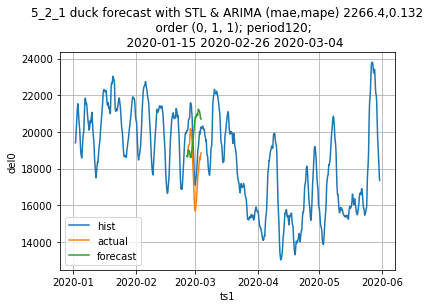

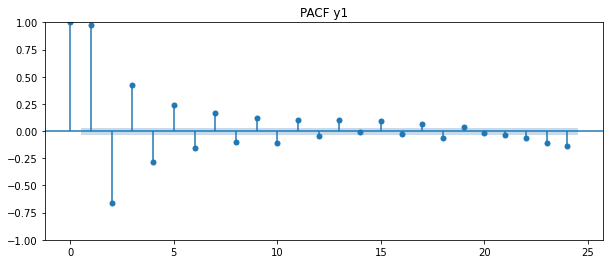

<Figure size 720x288 with 0 Axes>

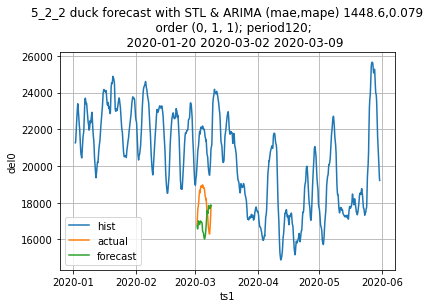

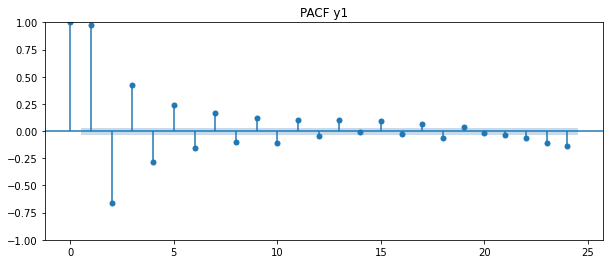

<Figure size 720x288 with 0 Axes>

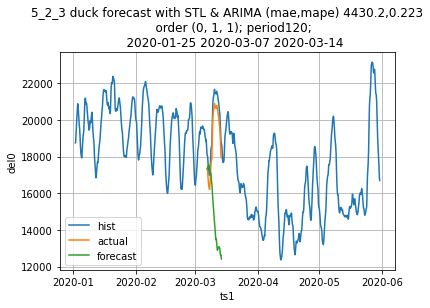

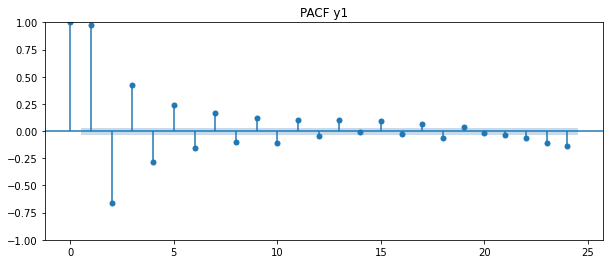

<Figure size 720x288 with 0 Axes>

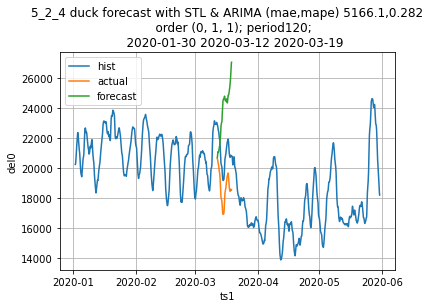

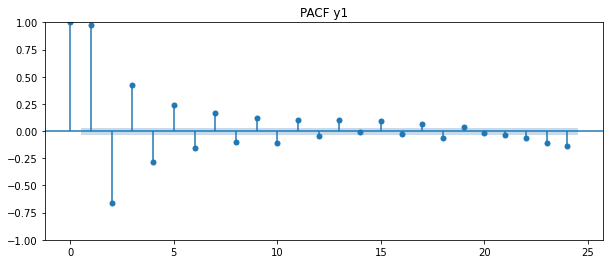

<Figure size 720x288 with 0 Axes>

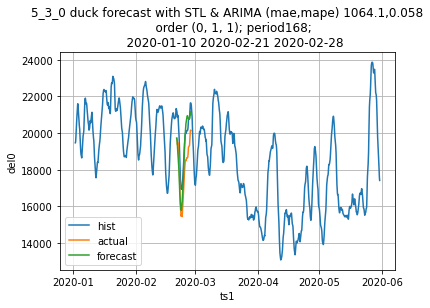

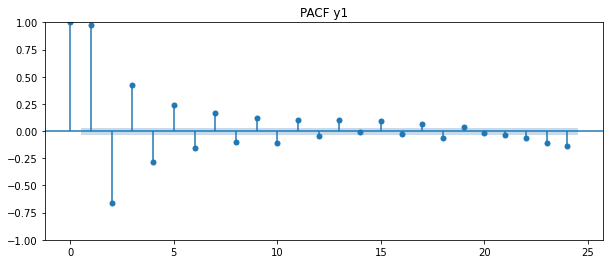

<Figure size 720x288 with 0 Axes>

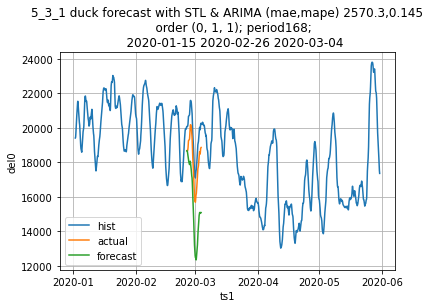

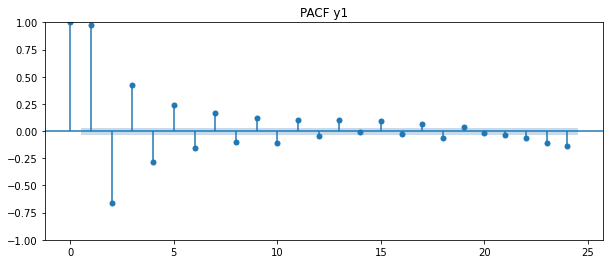

<Figure size 720x288 with 0 Axes>

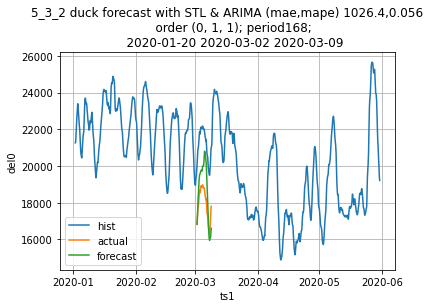

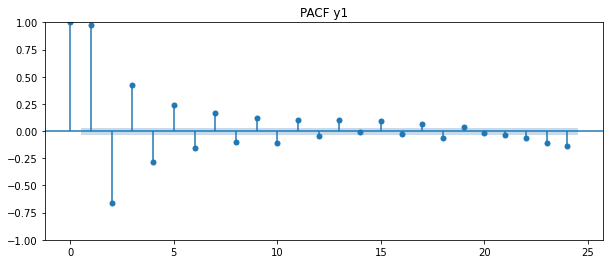

<Figure size 720x288 with 0 Axes>

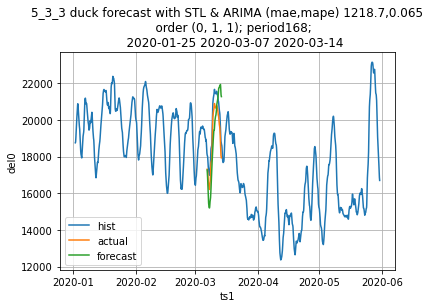

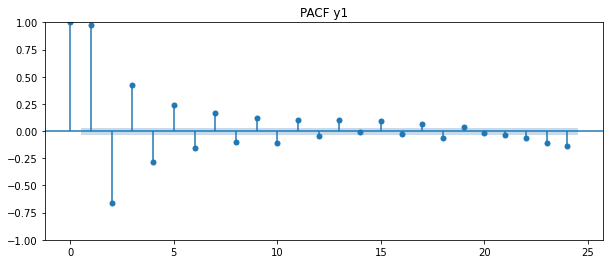

<Figure size 720x288 with 0 Axes>

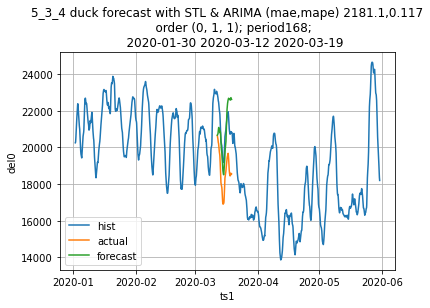

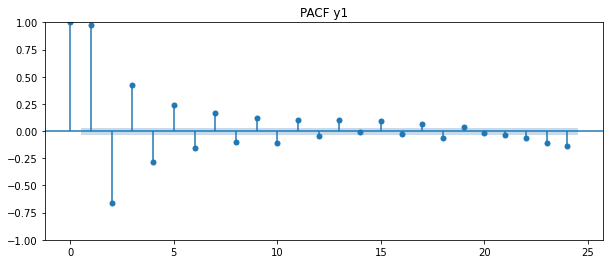

<Figure size 720x288 with 0 Axes>

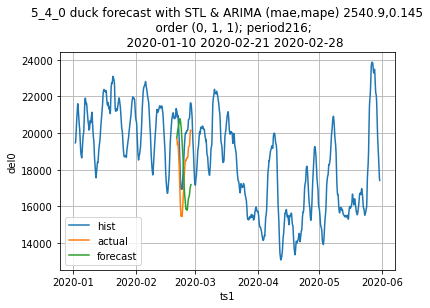

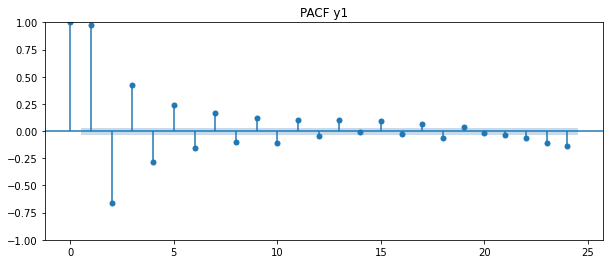

<Figure size 720x288 with 0 Axes>

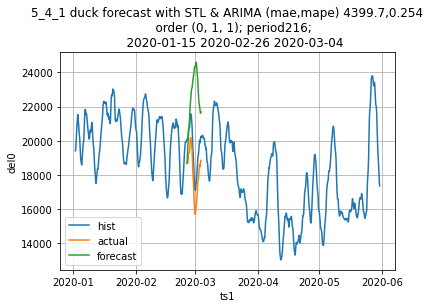

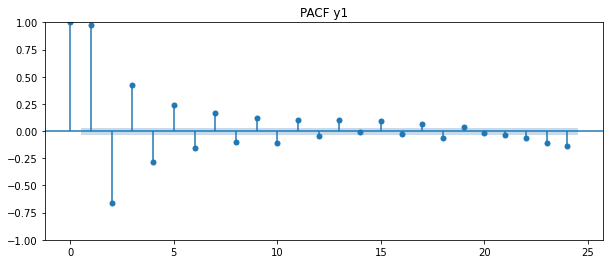

<Figure size 720x288 with 0 Axes>

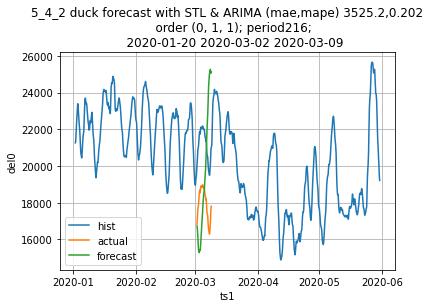

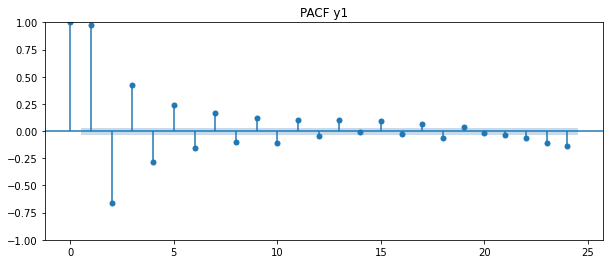

<Figure size 720x288 with 0 Axes>

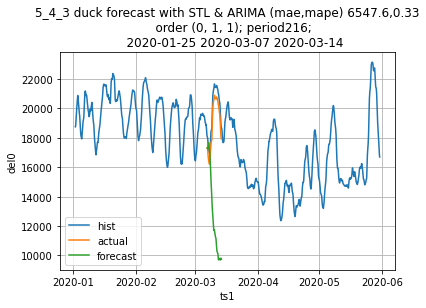

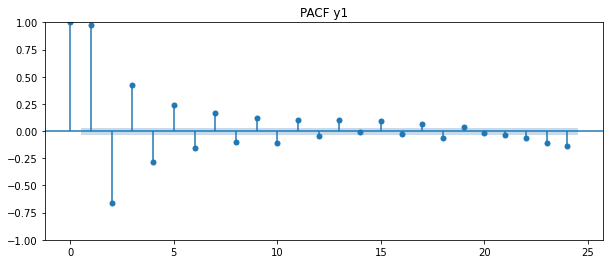

<Figure size 720x288 with 0 Axes>

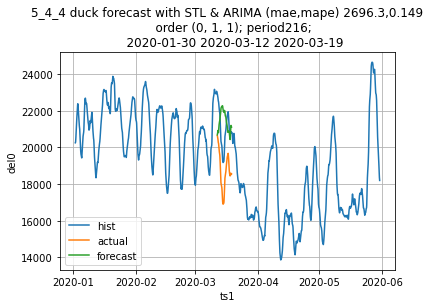

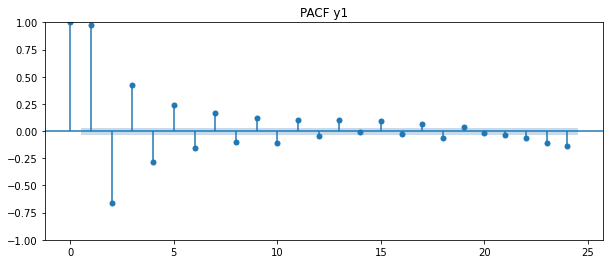

<Figure size 720x288 with 0 Axes>

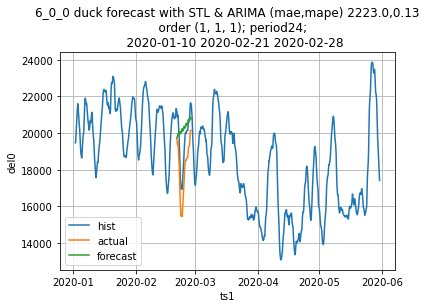

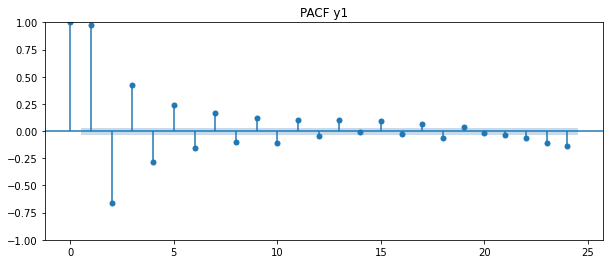

<Figure size 720x288 with 0 Axes>

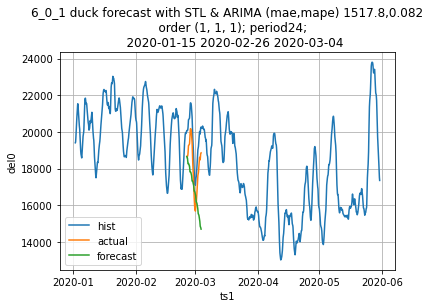

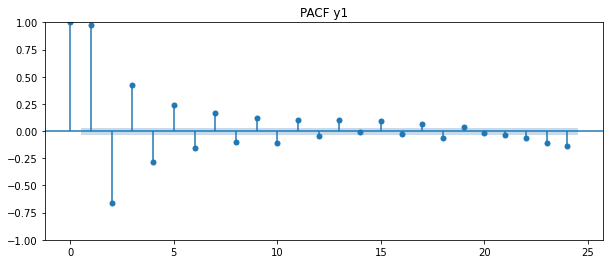

<Figure size 720x288 with 0 Axes>

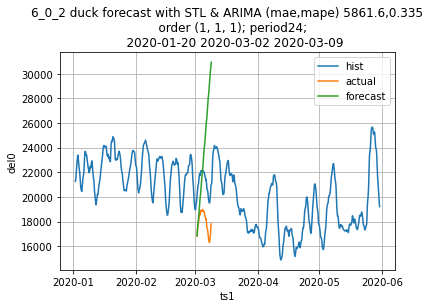

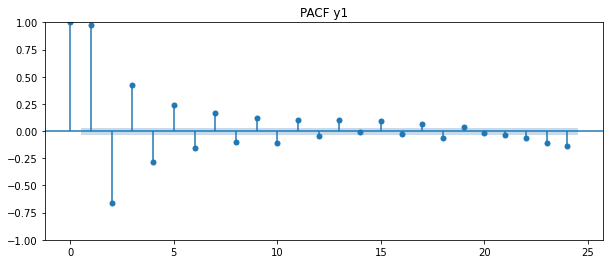

<Figure size 720x288 with 0 Axes>

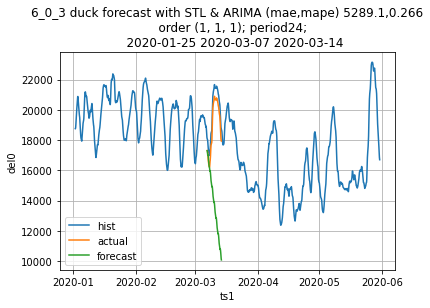

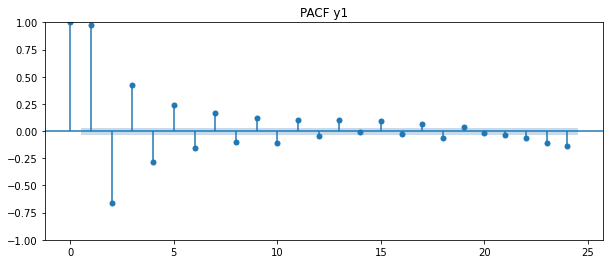

<Figure size 720x288 with 0 Axes>

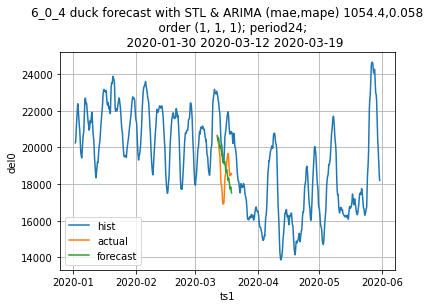

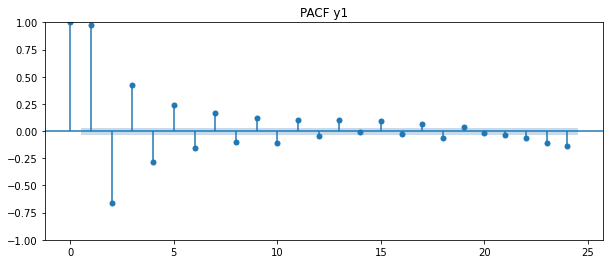

<Figure size 720x288 with 0 Axes>

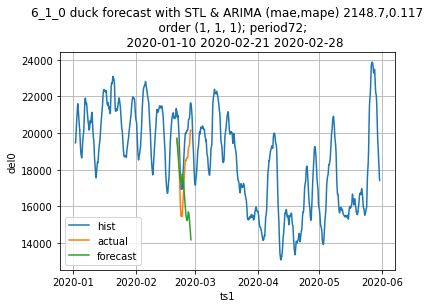

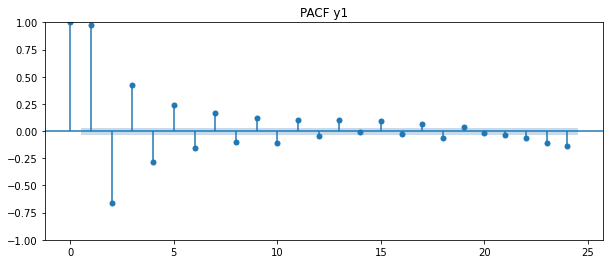

<Figure size 720x288 with 0 Axes>

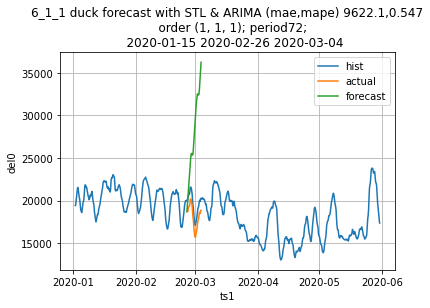

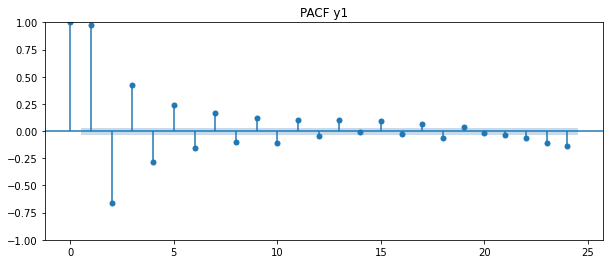

<Figure size 720x288 with 0 Axes>

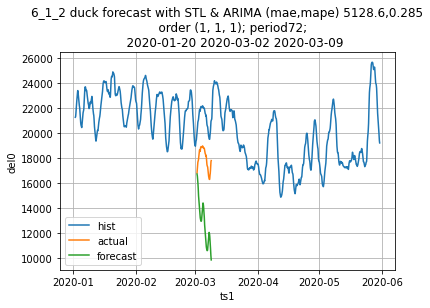

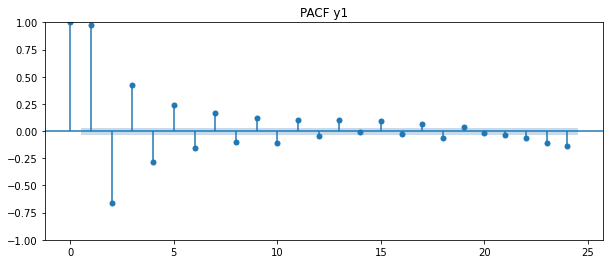

<Figure size 720x288 with 0 Axes>

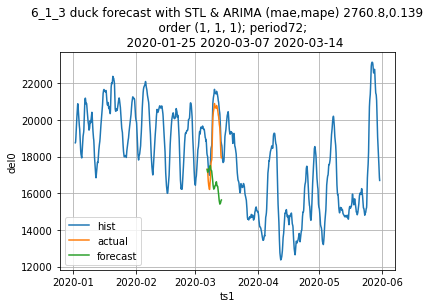

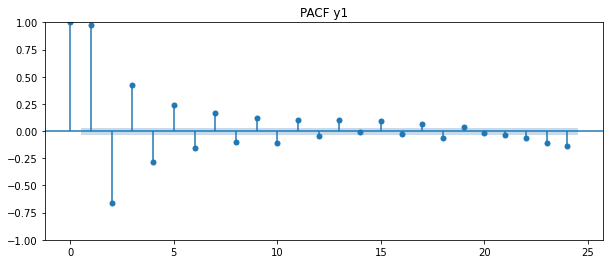

<Figure size 720x288 with 0 Axes>

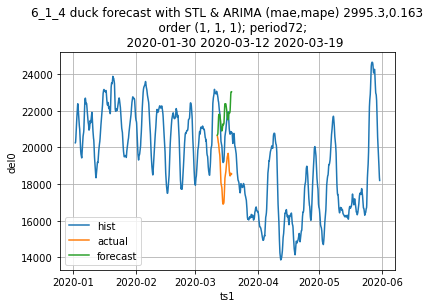

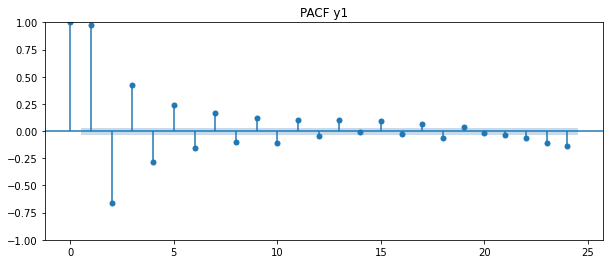

<Figure size 720x288 with 0 Axes>

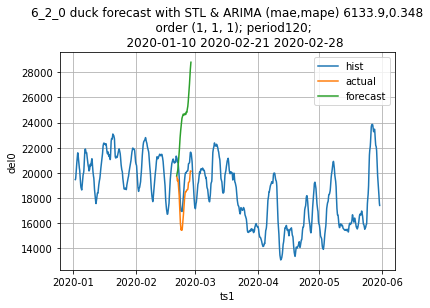

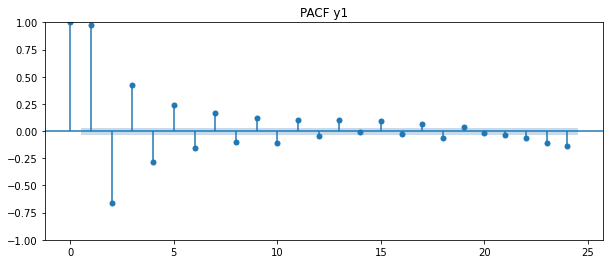

<Figure size 720x288 with 0 Axes>

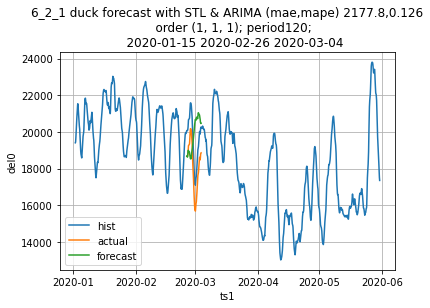

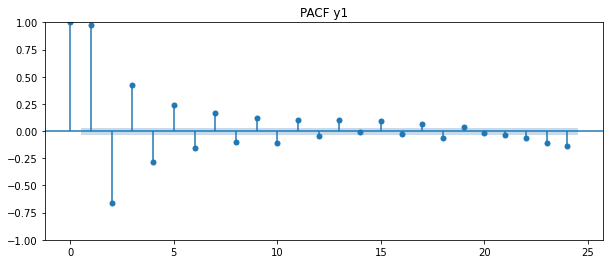

<Figure size 720x288 with 0 Axes>

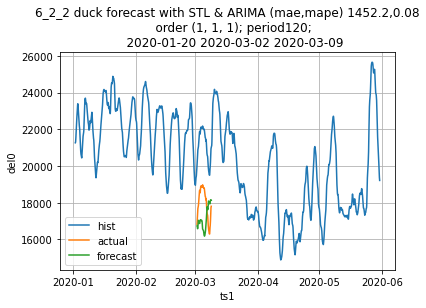

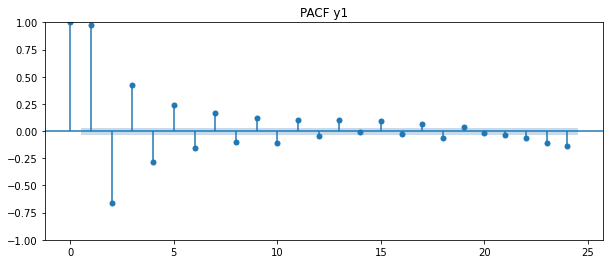

<Figure size 720x288 with 0 Axes>

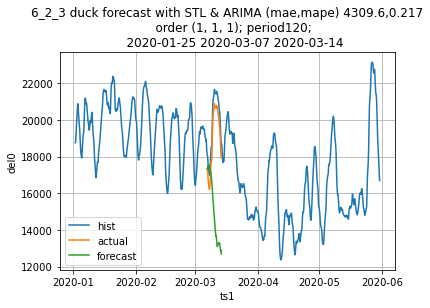

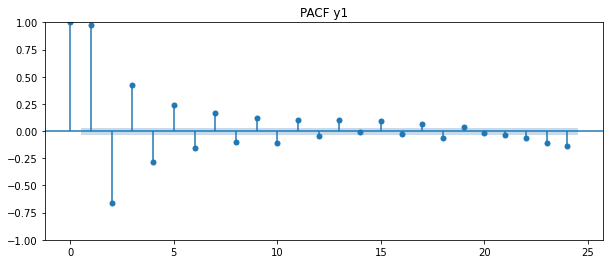

<Figure size 720x288 with 0 Axes>

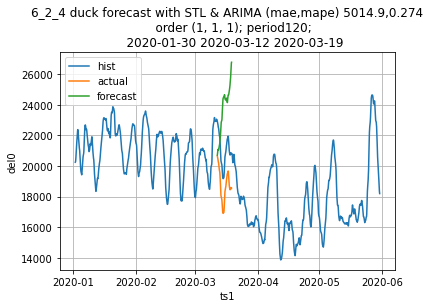

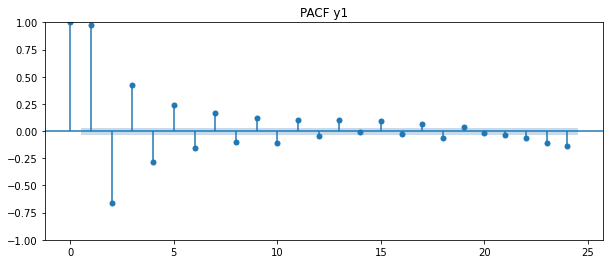

<Figure size 720x288 with 0 Axes>

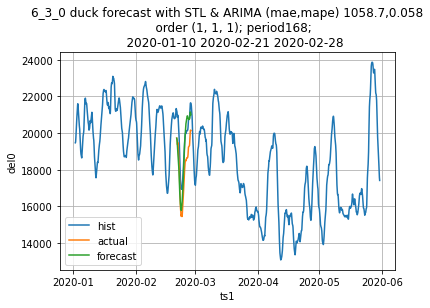

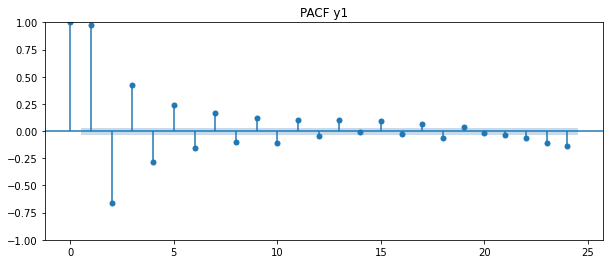

<Figure size 720x288 with 0 Axes>

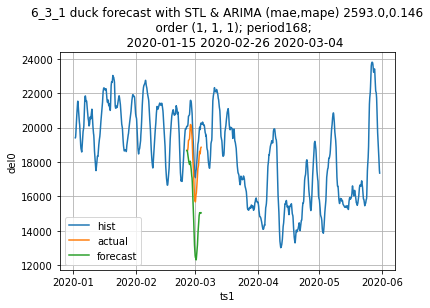

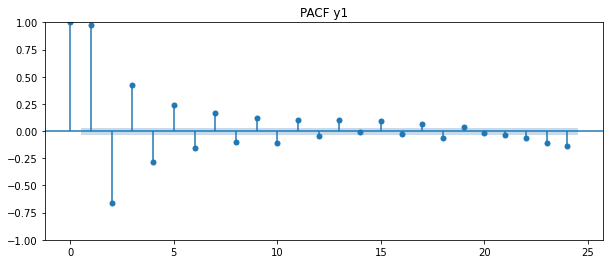

<Figure size 720x288 with 0 Axes>

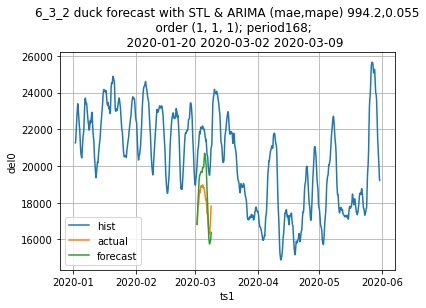

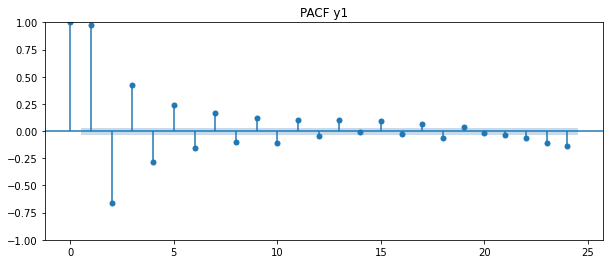

<Figure size 720x288 with 0 Axes>

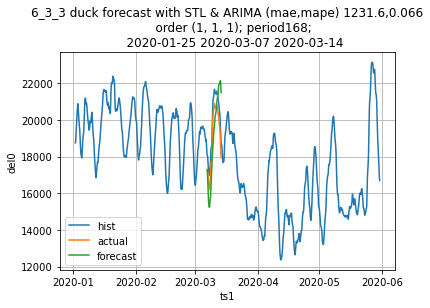

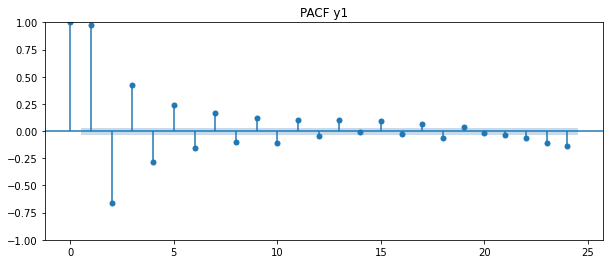

<Figure size 720x288 with 0 Axes>

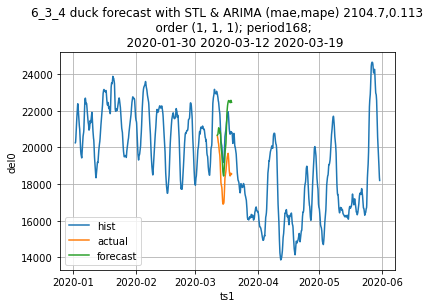

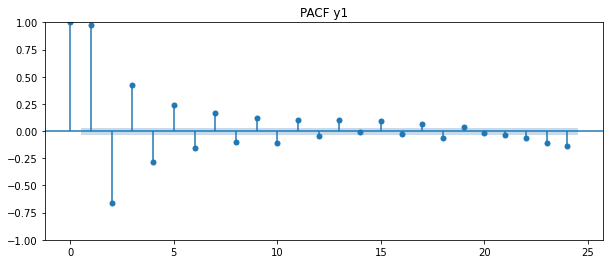

<Figure size 720x288 with 0 Axes>

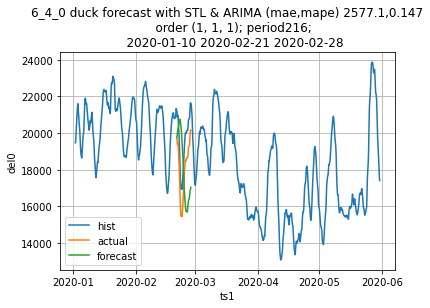

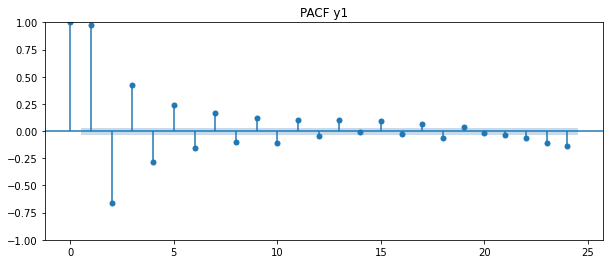

<Figure size 720x288 with 0 Axes>

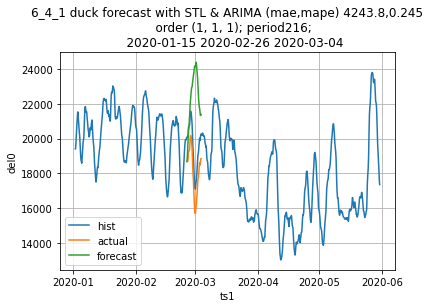

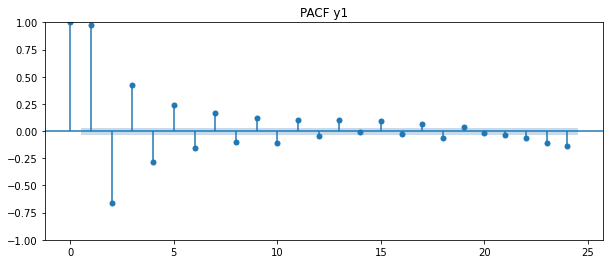

<Figure size 720x288 with 0 Axes>

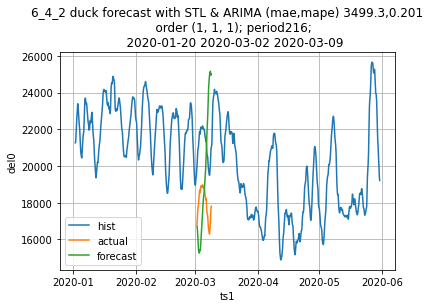

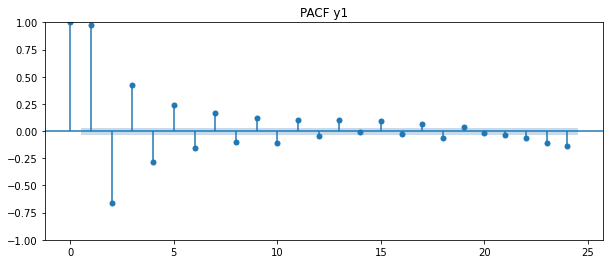

<Figure size 720x288 with 0 Axes>

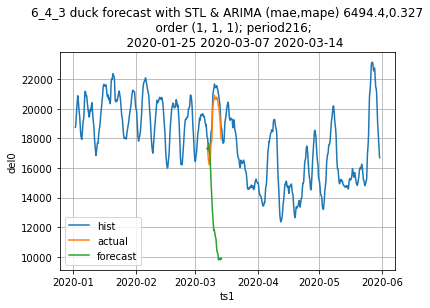

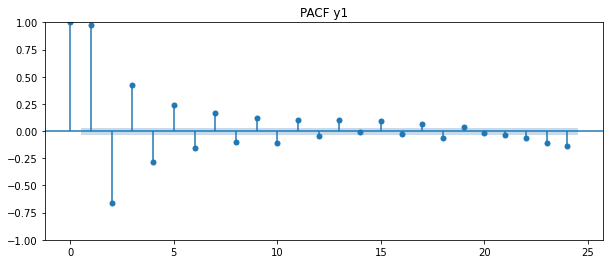

<Figure size 720x288 with 0 Axes>

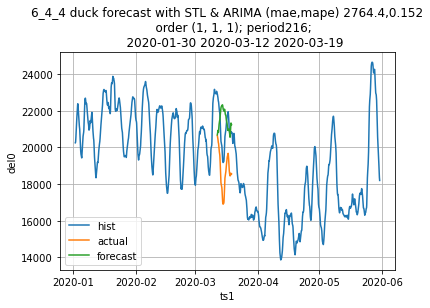

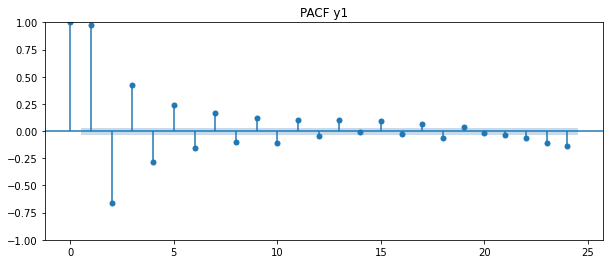

<Figure size 720x288 with 0 Axes>

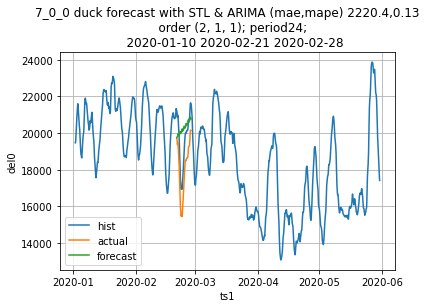

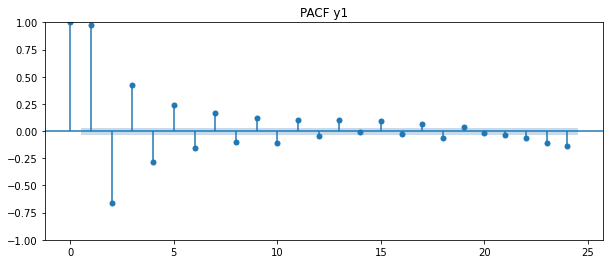

<Figure size 720x288 with 0 Axes>

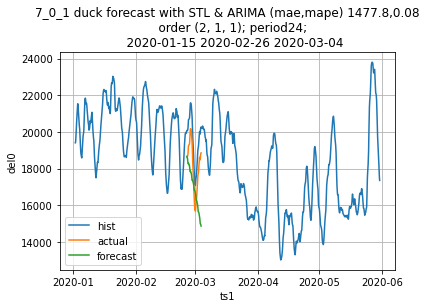

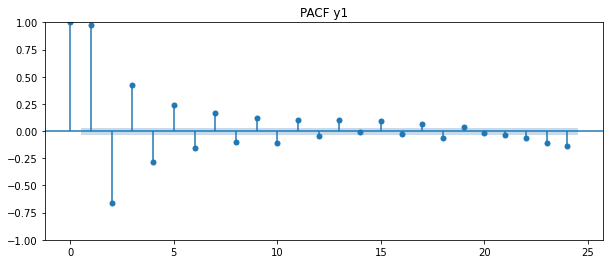

<Figure size 720x288 with 0 Axes>

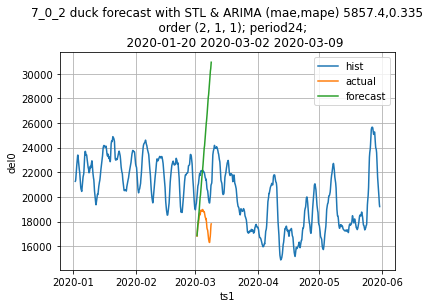

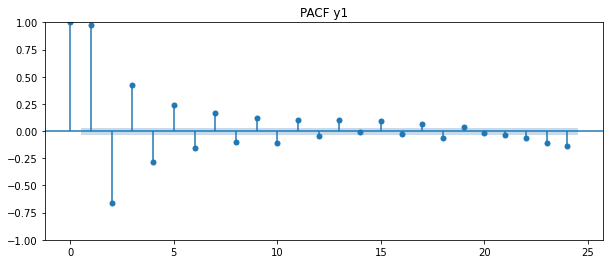

<Figure size 720x288 with 0 Axes>

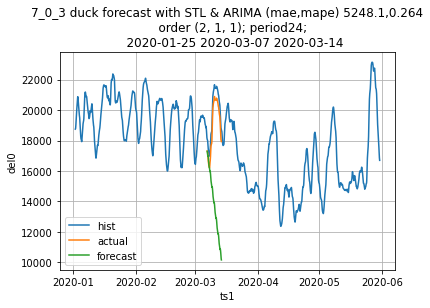

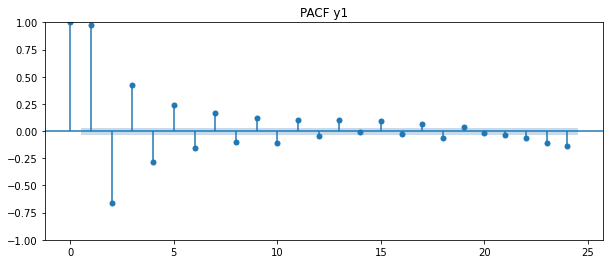

<Figure size 720x288 with 0 Axes>

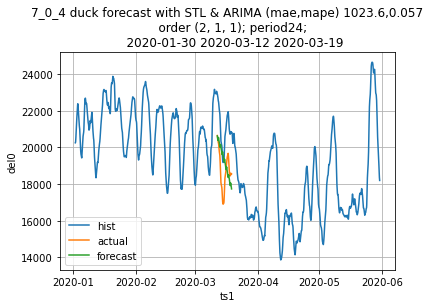

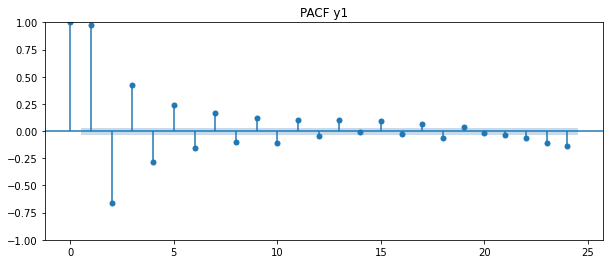

<Figure size 720x288 with 0 Axes>

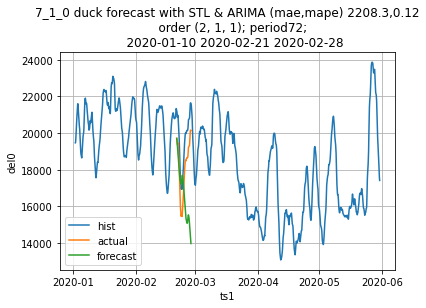

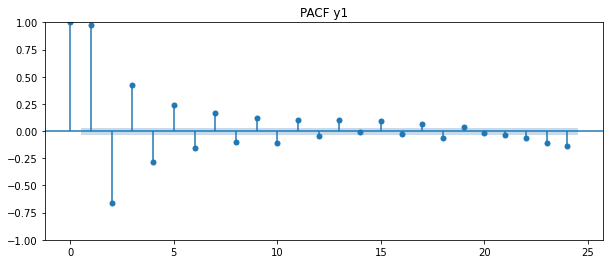

<Figure size 720x288 with 0 Axes>

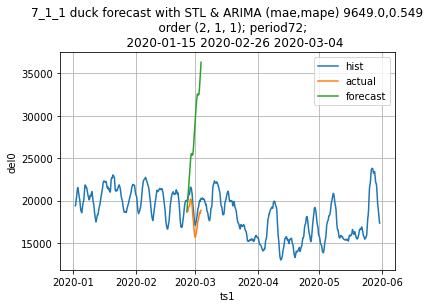

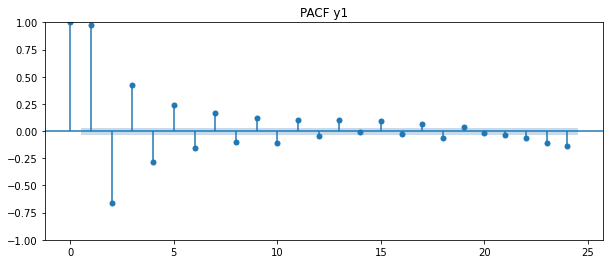

<Figure size 720x288 with 0 Axes>

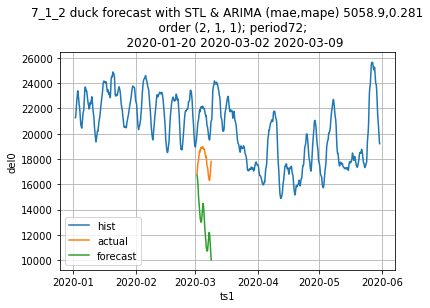

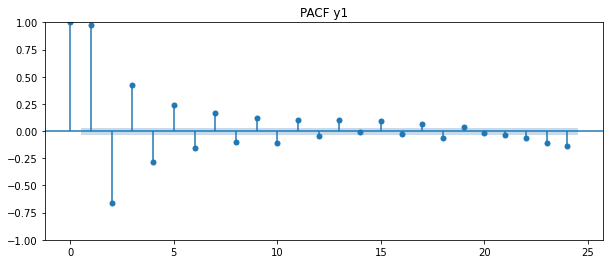

<Figure size 720x288 with 0 Axes>

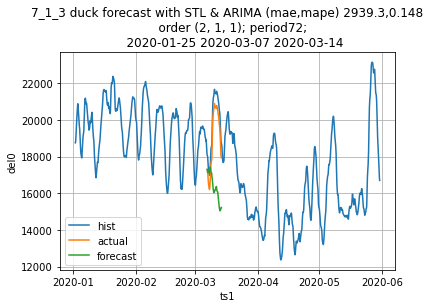

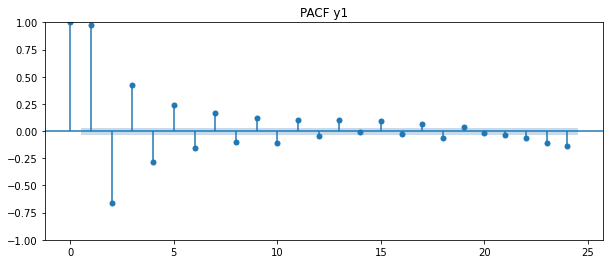

<Figure size 720x288 with 0 Axes>

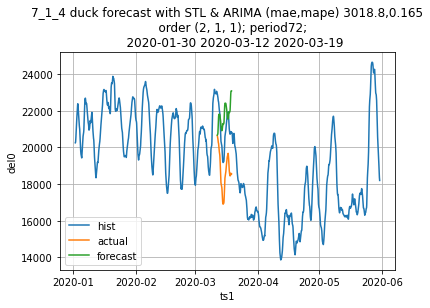

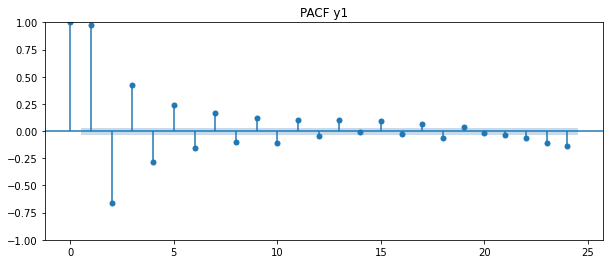

<Figure size 720x288 with 0 Axes>

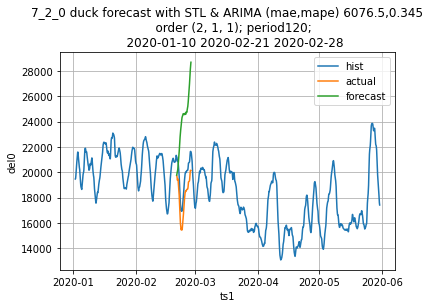

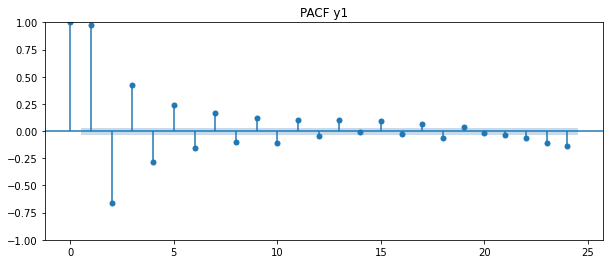

<Figure size 720x288 with 0 Axes>

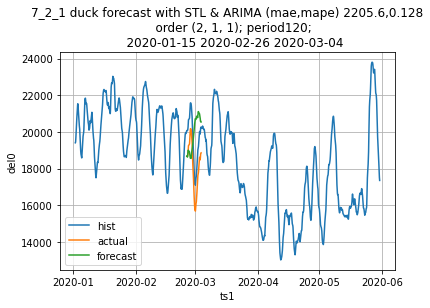

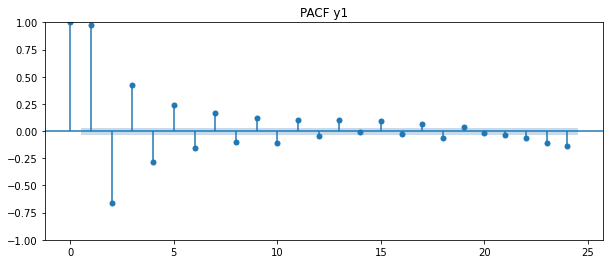

<Figure size 720x288 with 0 Axes>

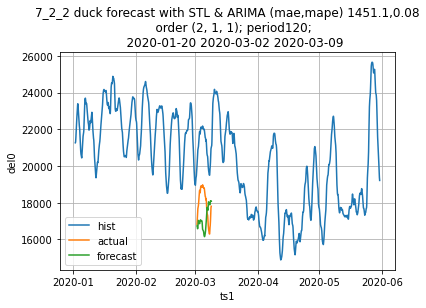

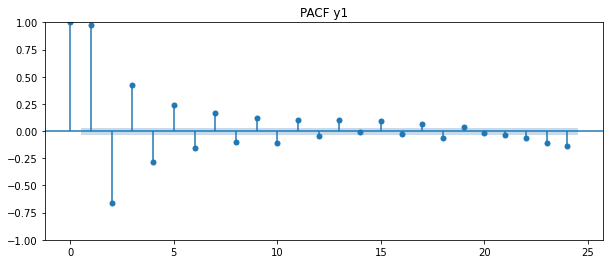

<Figure size 720x288 with 0 Axes>

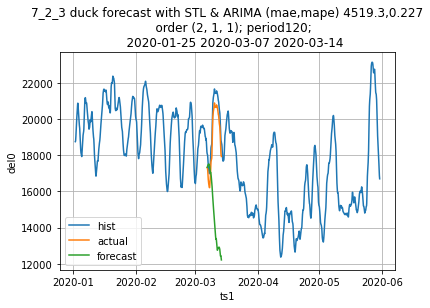

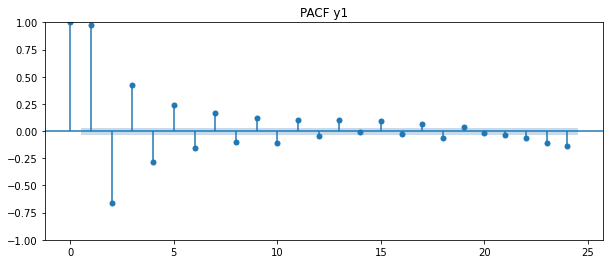

<Figure size 720x288 with 0 Axes>

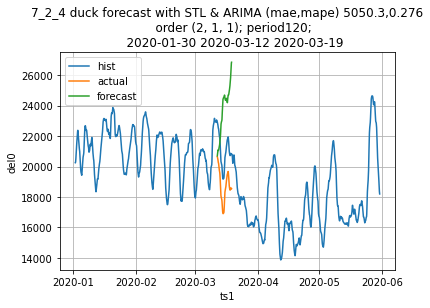

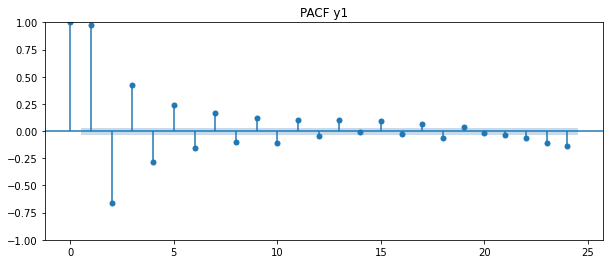

<Figure size 720x288 with 0 Axes>

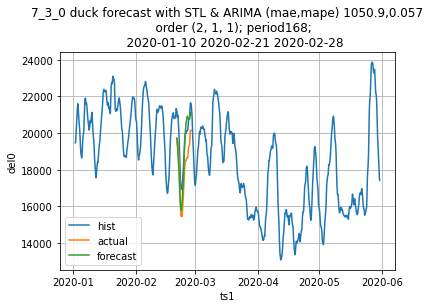

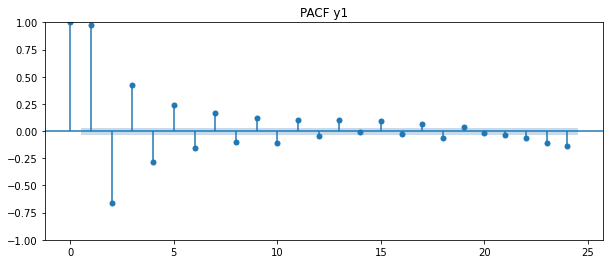

<Figure size 720x288 with 0 Axes>

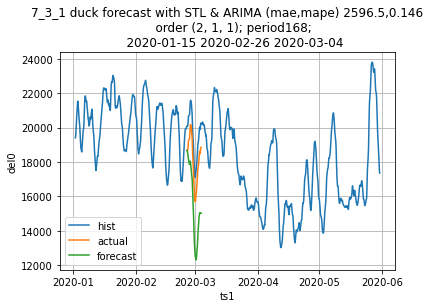

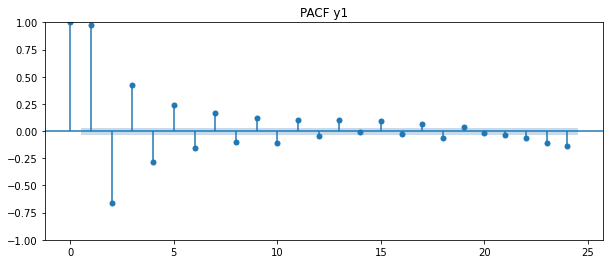

<Figure size 720x288 with 0 Axes>

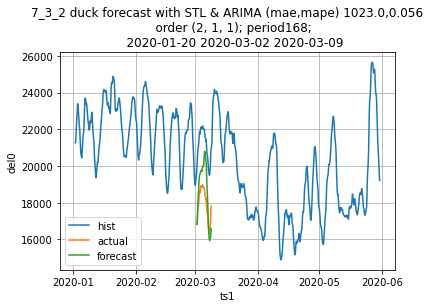

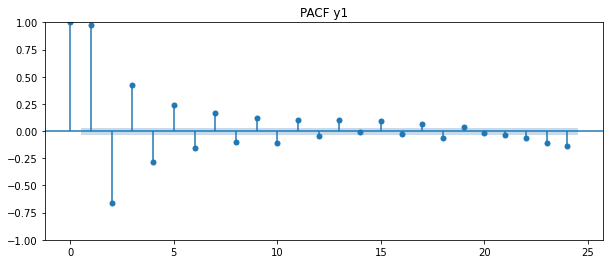

<Figure size 720x288 with 0 Axes>

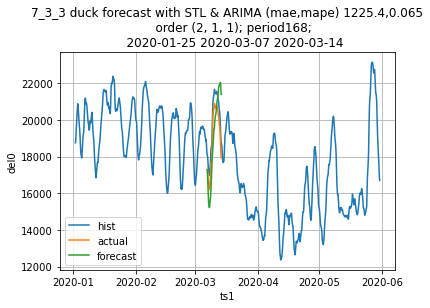

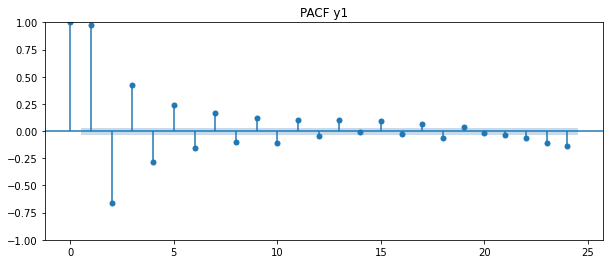

<Figure size 720x288 with 0 Axes>

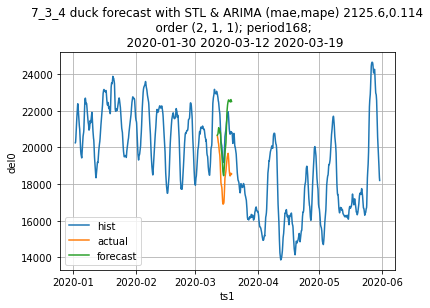

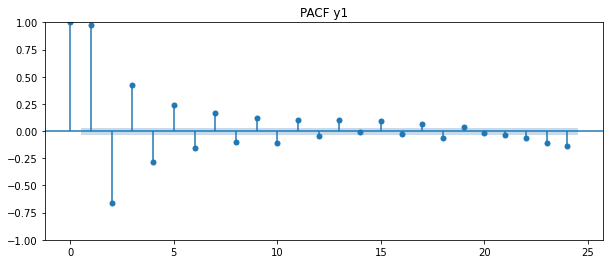

<Figure size 720x288 with 0 Axes>

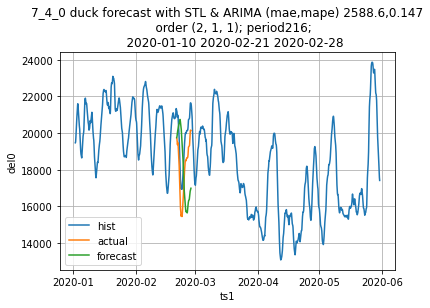

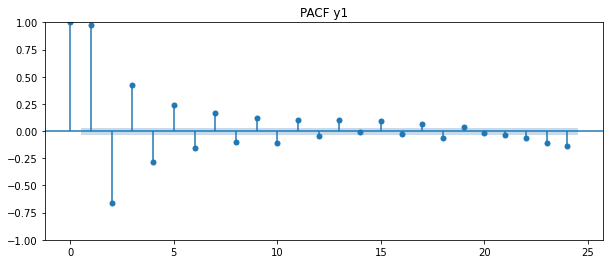

<Figure size 720x288 with 0 Axes>

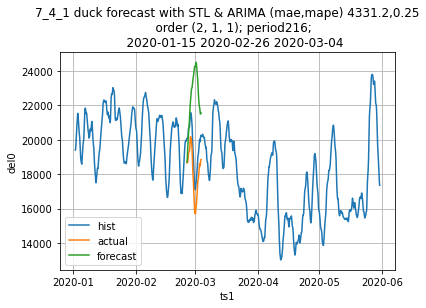

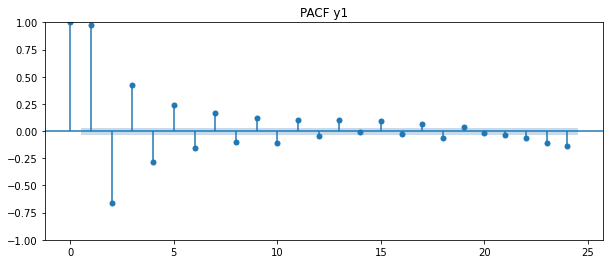

<Figure size 720x288 with 0 Axes>

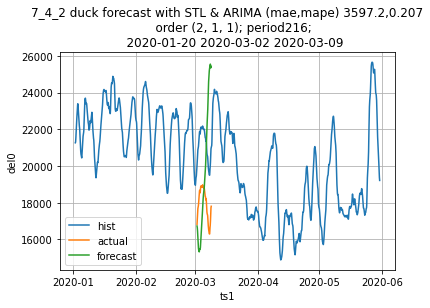

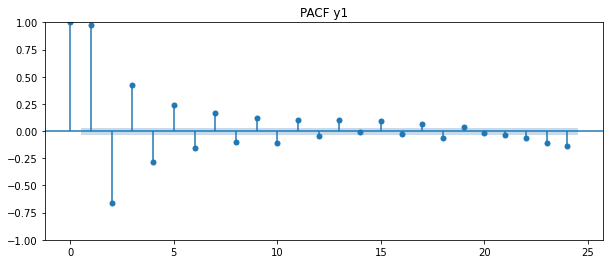

<Figure size 720x288 with 0 Axes>

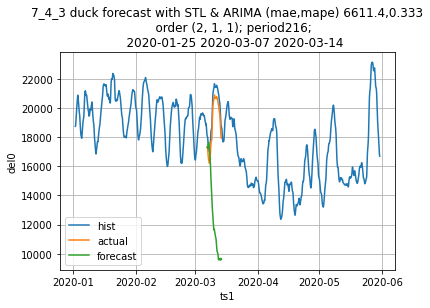

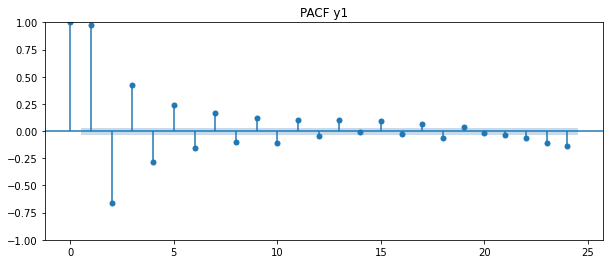

<Figure size 720x288 with 0 Axes>

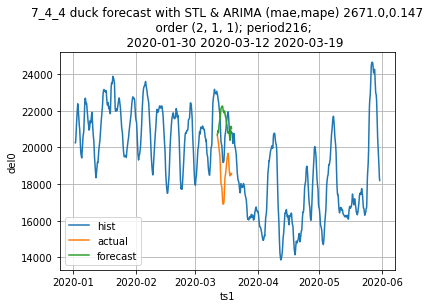

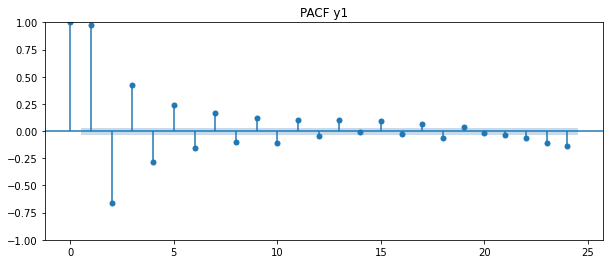

<Figure size 720x288 with 0 Axes>

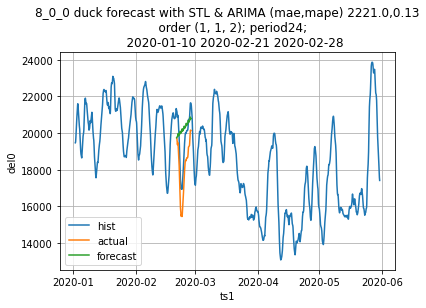

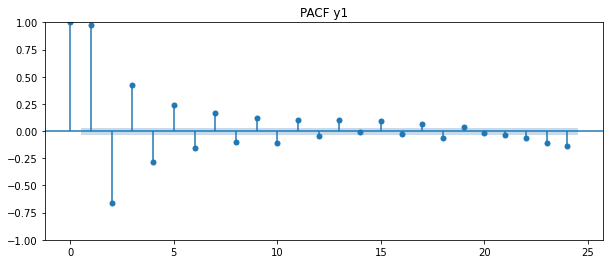

<Figure size 720x288 with 0 Axes>

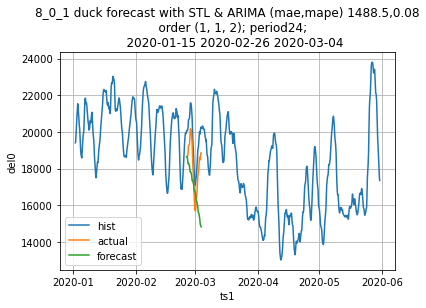

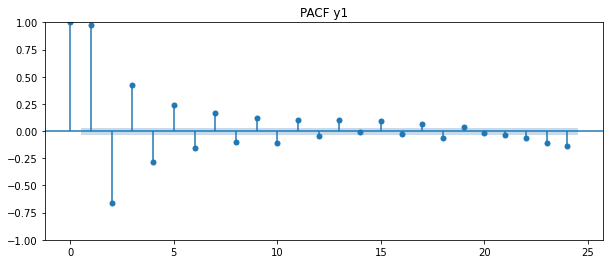

<Figure size 720x288 with 0 Axes>

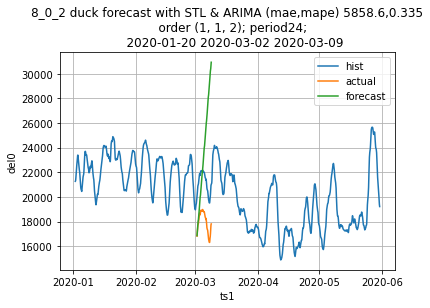

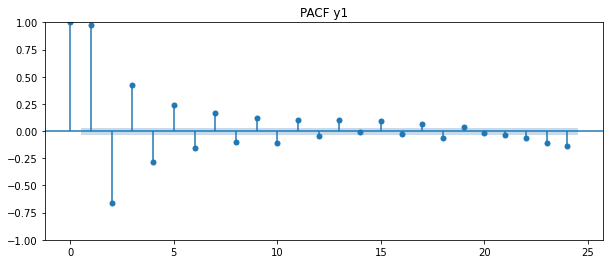

<Figure size 720x288 with 0 Axes>

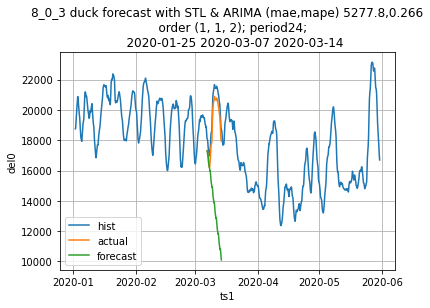

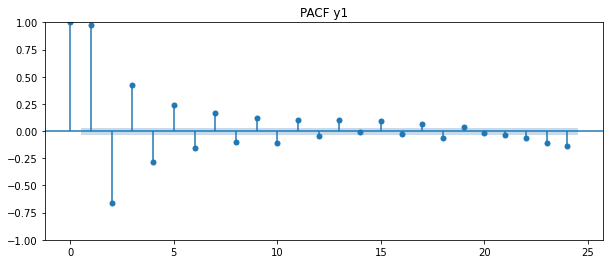

<Figure size 720x288 with 0 Axes>

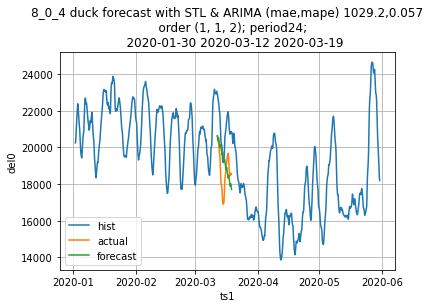

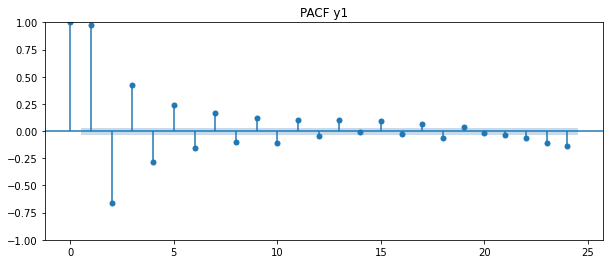

<Figure size 720x288 with 0 Axes>

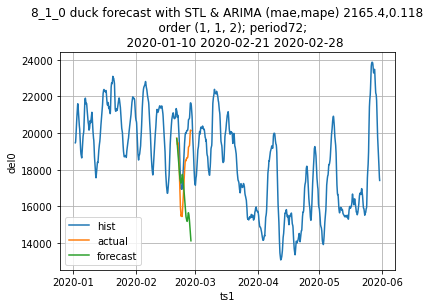

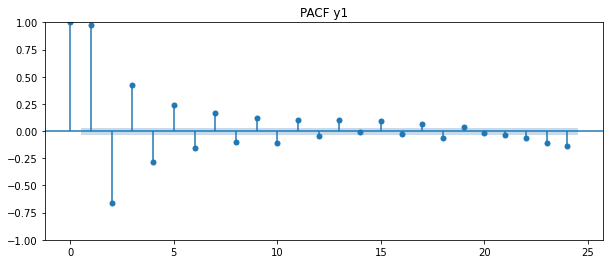

<Figure size 720x288 with 0 Axes>

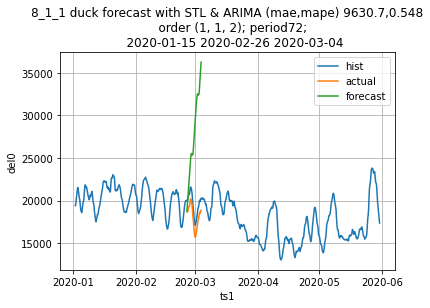

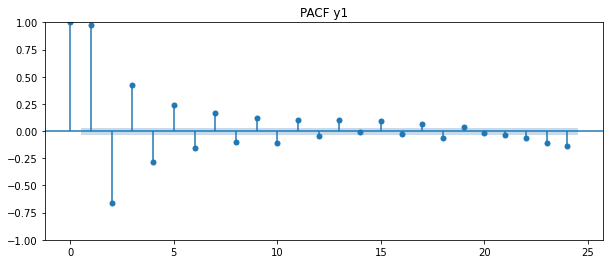

<Figure size 720x288 with 0 Axes>

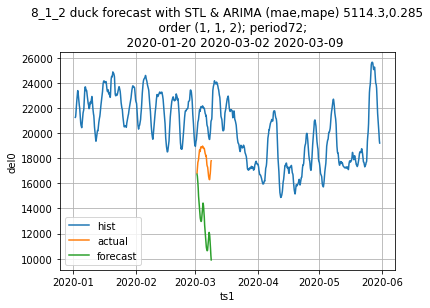

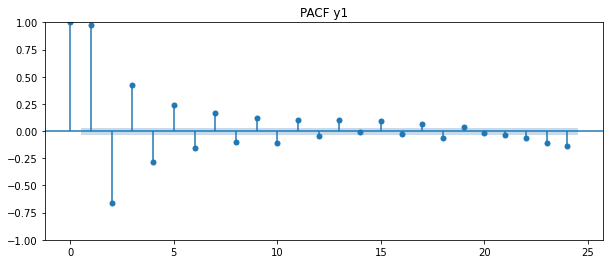

<Figure size 720x288 with 0 Axes>

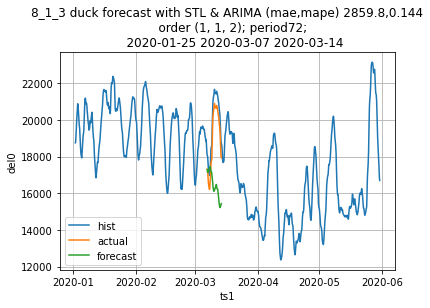

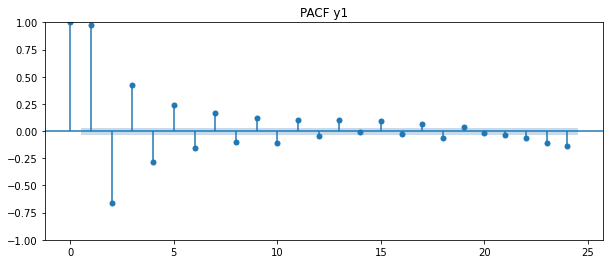

<Figure size 720x288 with 0 Axes>

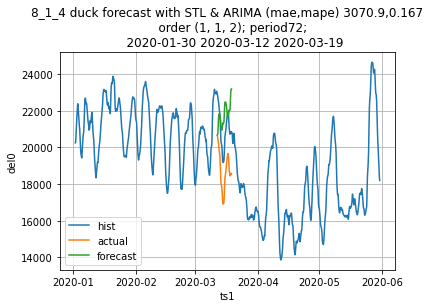

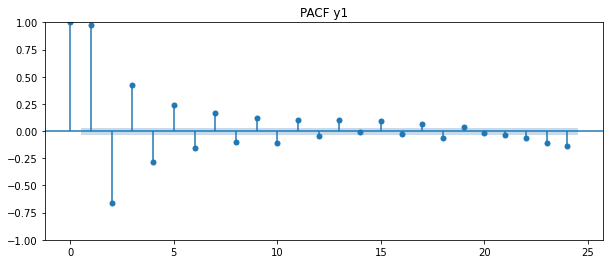

<Figure size 720x288 with 0 Axes>

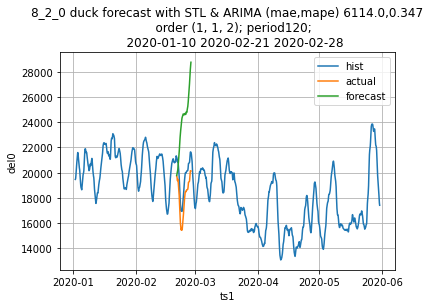

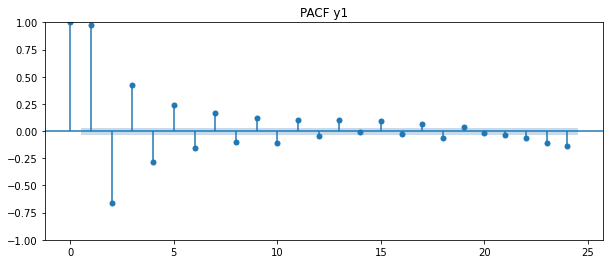

<Figure size 720x288 with 0 Axes>

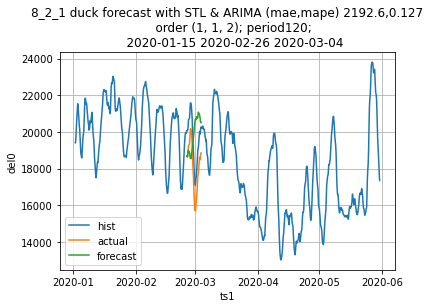

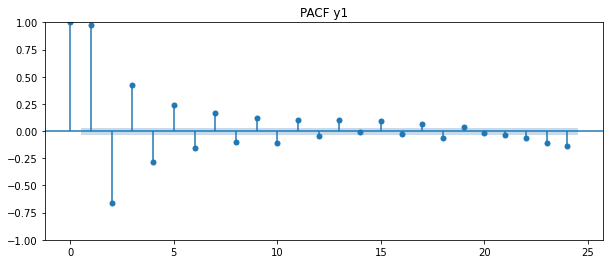

<Figure size 720x288 with 0 Axes>

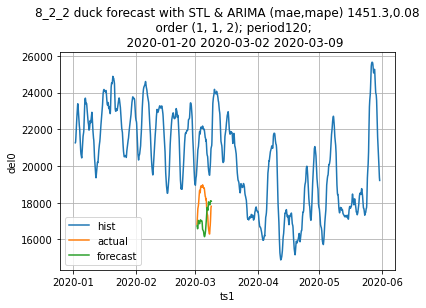

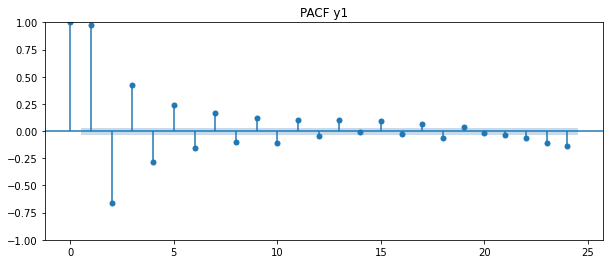

<Figure size 720x288 with 0 Axes>

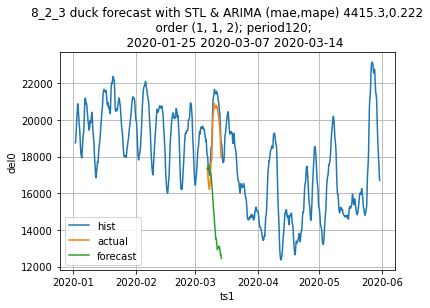

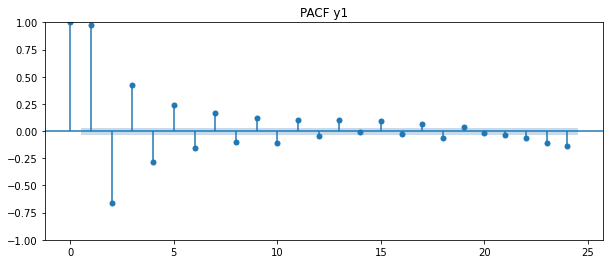

<Figure size 720x288 with 0 Axes>

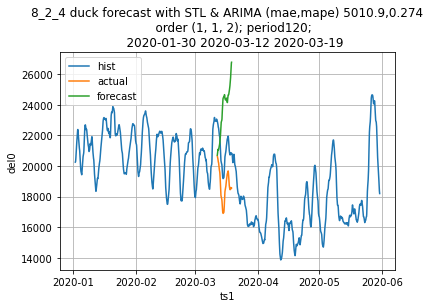

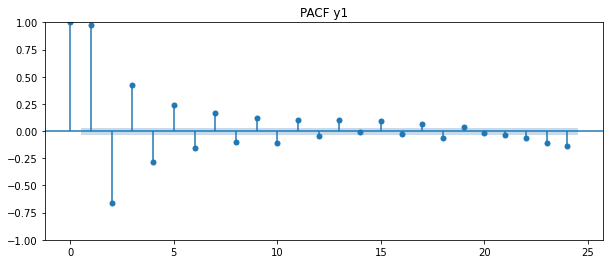

<Figure size 720x288 with 0 Axes>

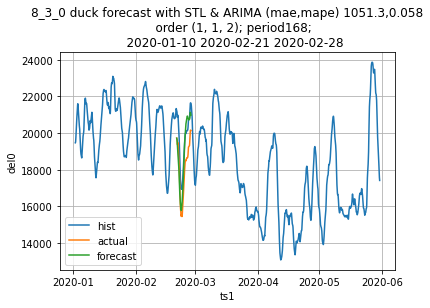

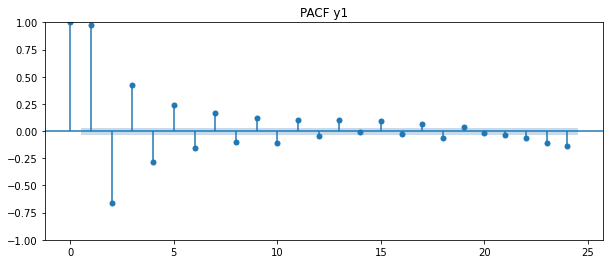

<Figure size 720x288 with 0 Axes>

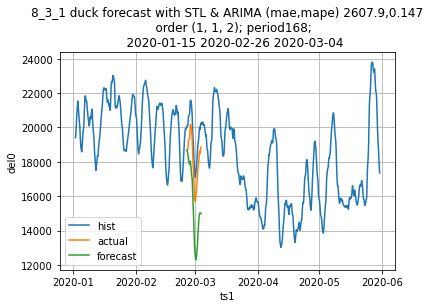

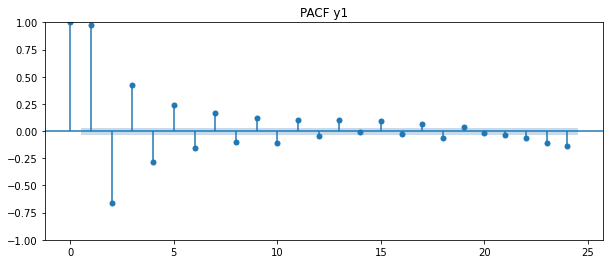

<Figure size 720x288 with 0 Axes>

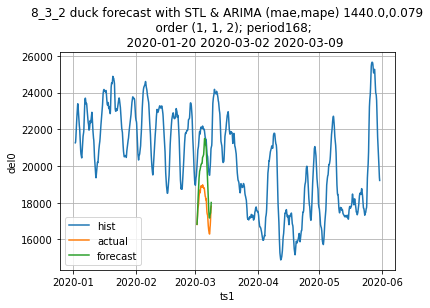

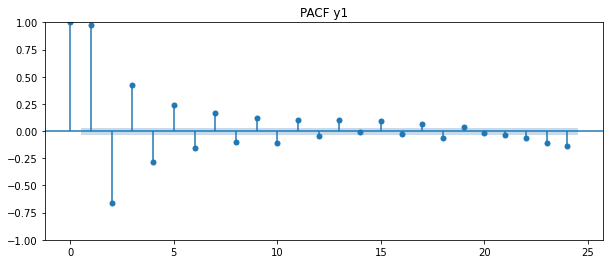

<Figure size 720x288 with 0 Axes>

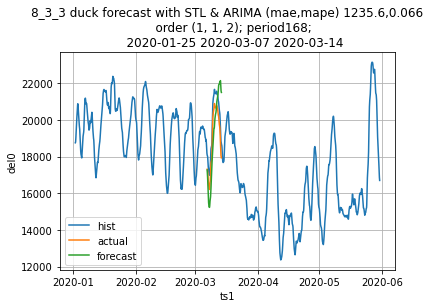

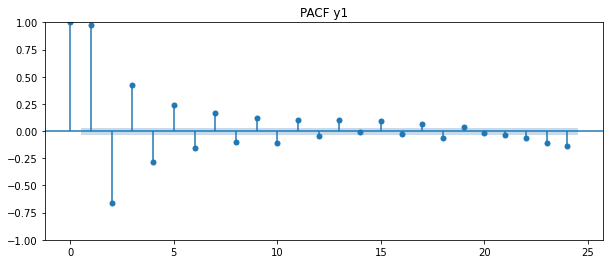

<Figure size 720x288 with 0 Axes>

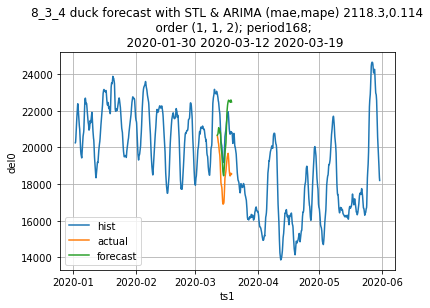

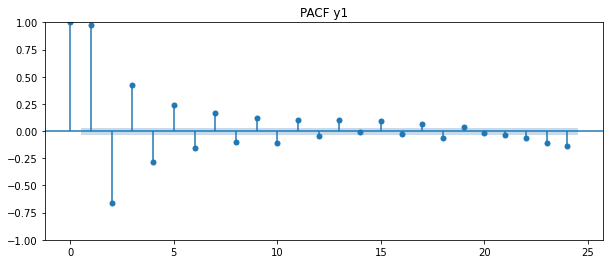

<Figure size 720x288 with 0 Axes>

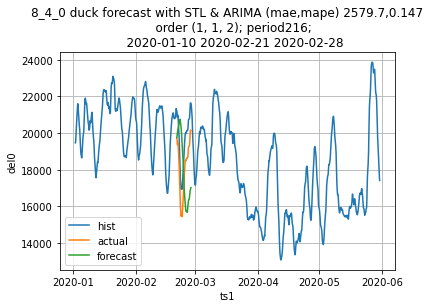

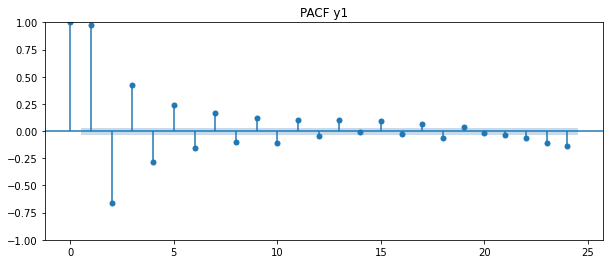

<Figure size 720x288 with 0 Axes>

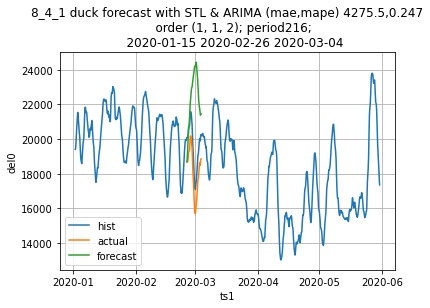

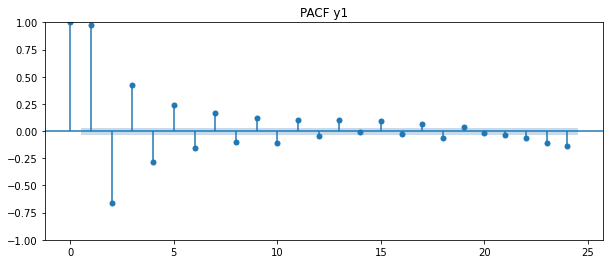

<Figure size 720x288 with 0 Axes>

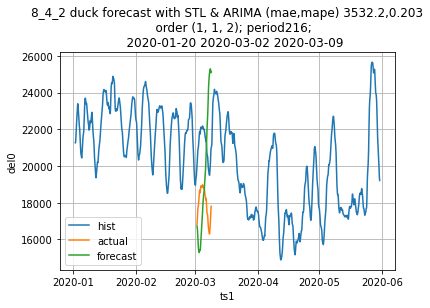

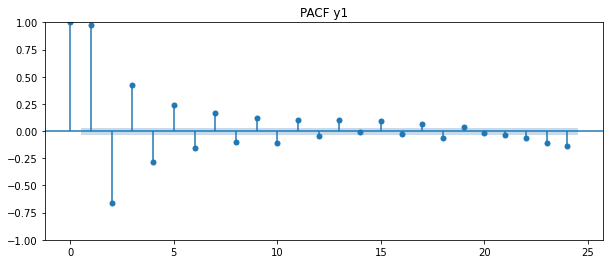

<Figure size 720x288 with 0 Axes>

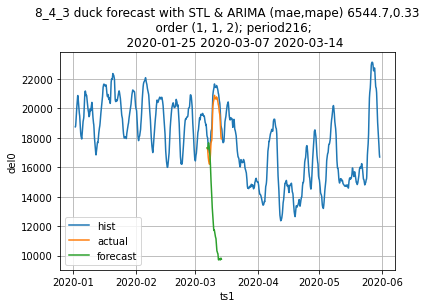

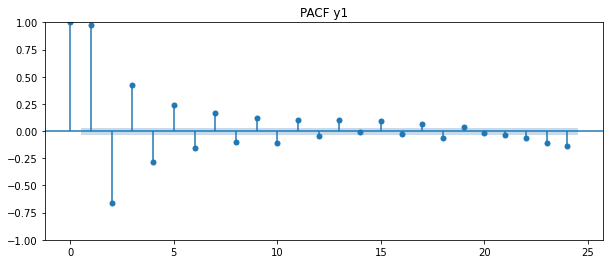

<Figure size 720x288 with 0 Axes>

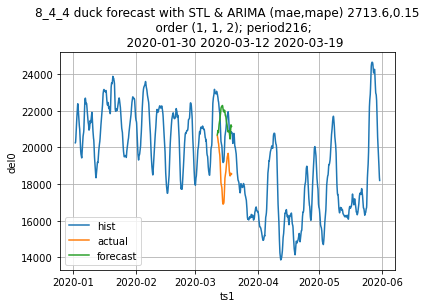

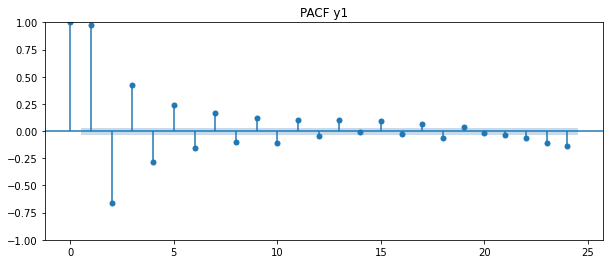

<Figure size 720x288 with 0 Axes>

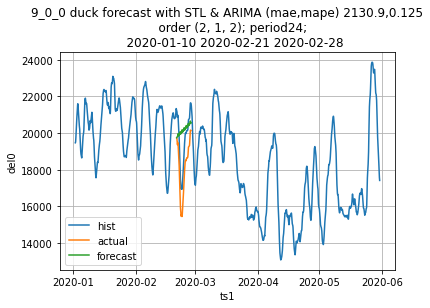

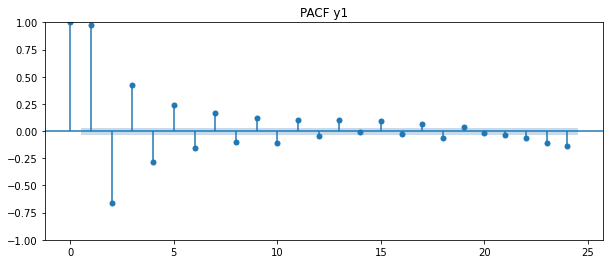

<Figure size 720x288 with 0 Axes>

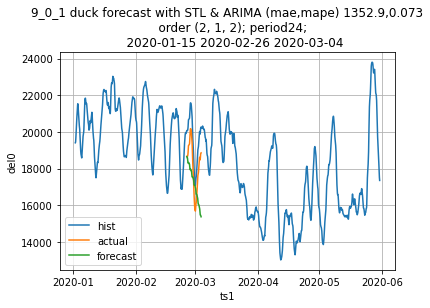

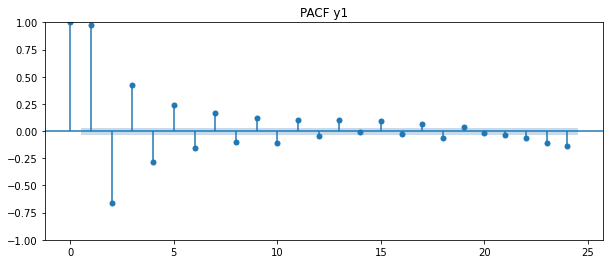

<Figure size 720x288 with 0 Axes>

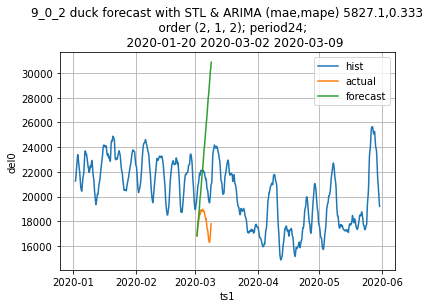

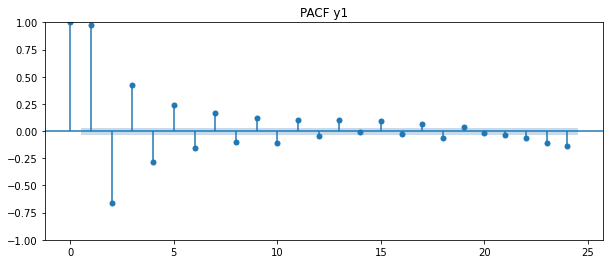

<Figure size 720x288 with 0 Axes>

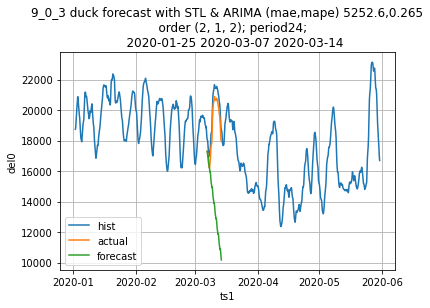

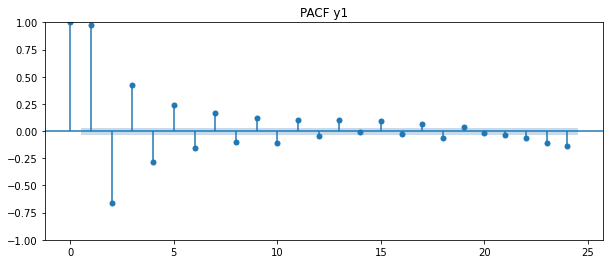

<Figure size 720x288 with 0 Axes>

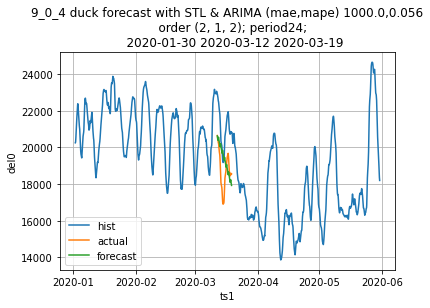

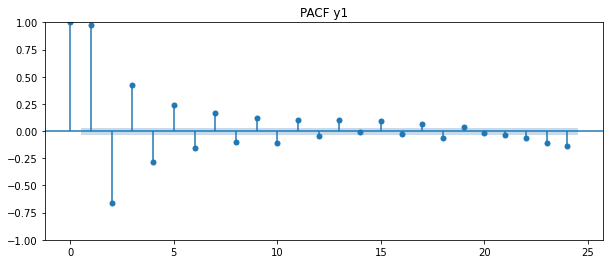

<Figure size 720x288 with 0 Axes>

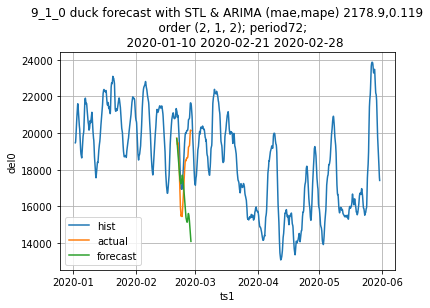

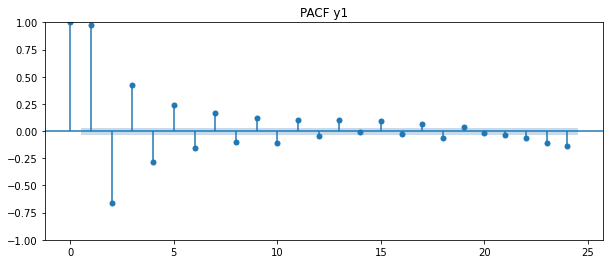

<Figure size 720x288 with 0 Axes>

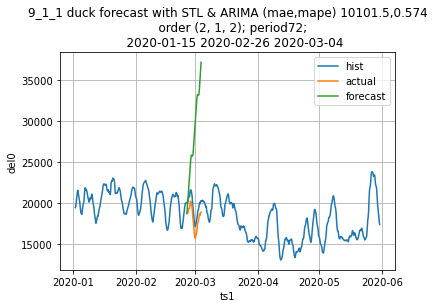

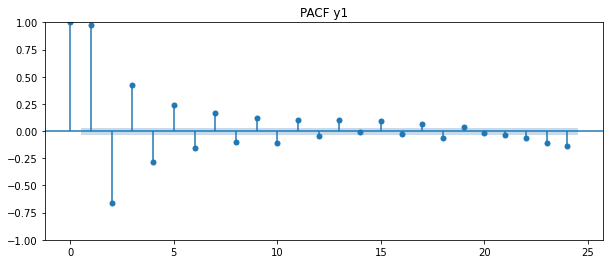

<Figure size 720x288 with 0 Axes>

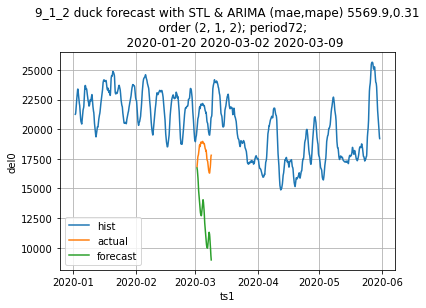

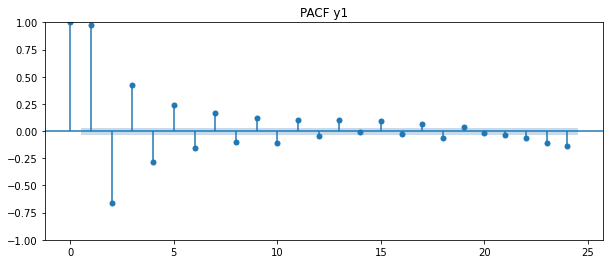

<Figure size 720x288 with 0 Axes>

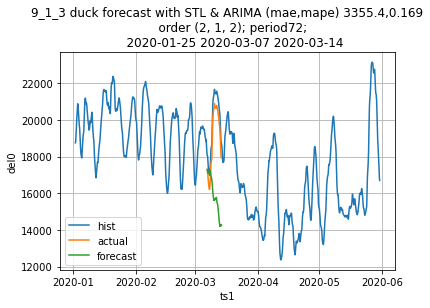

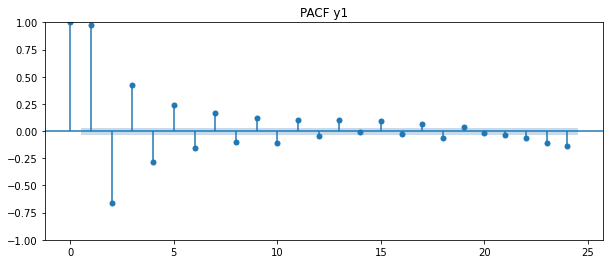

<Figure size 720x288 with 0 Axes>

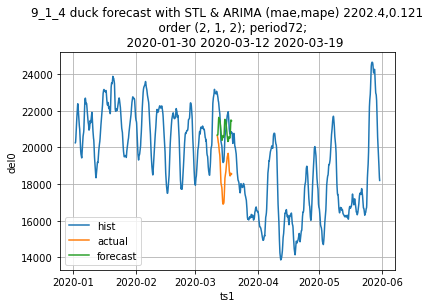

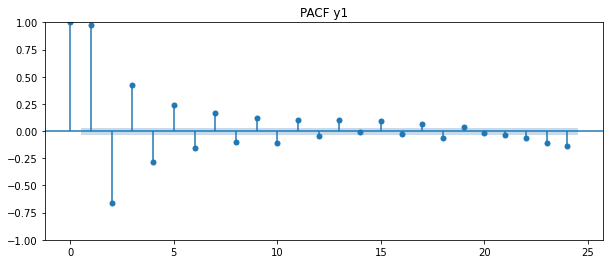

<Figure size 720x288 with 0 Axes>

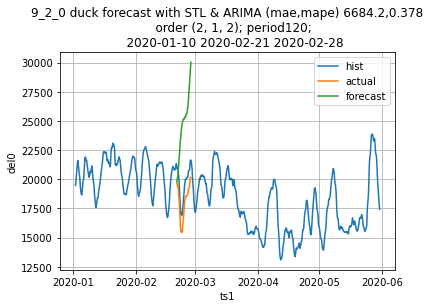

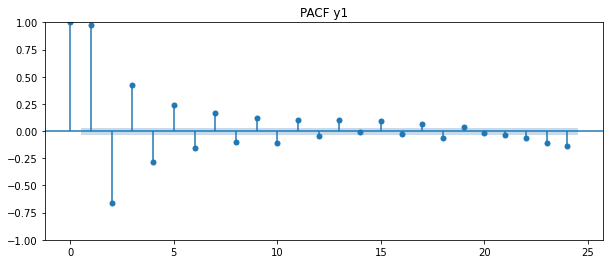

<Figure size 720x288 with 0 Axes>

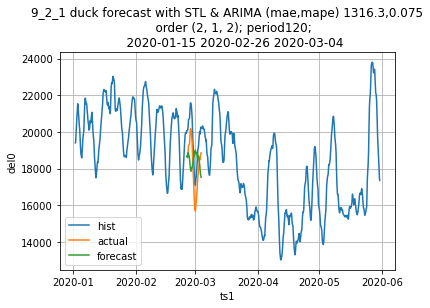

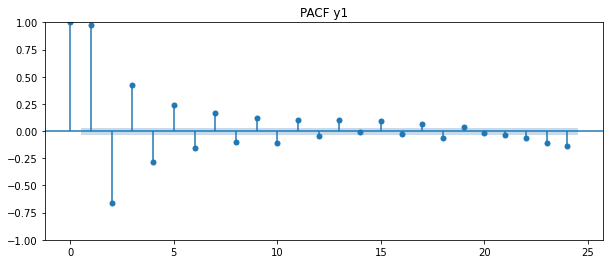

<Figure size 720x288 with 0 Axes>

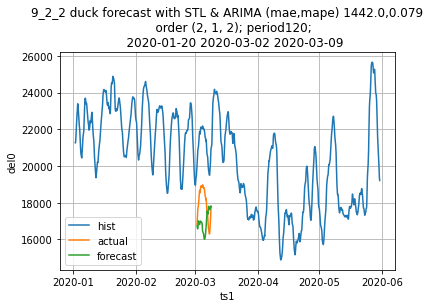

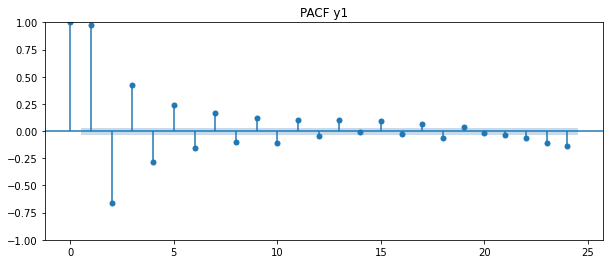

<Figure size 720x288 with 0 Axes>

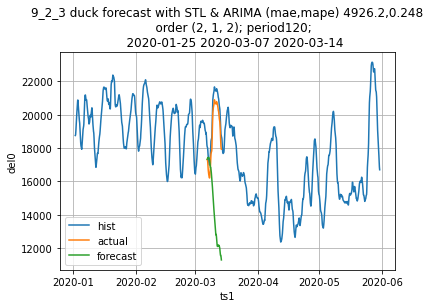

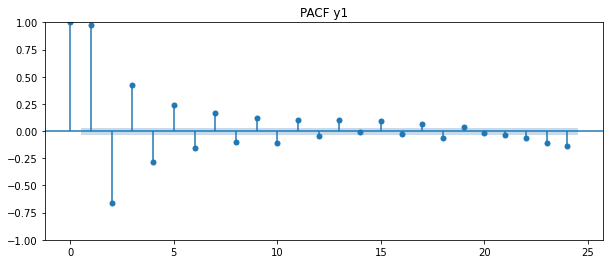

<Figure size 720x288 with 0 Axes>

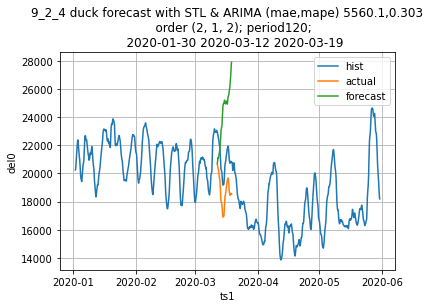

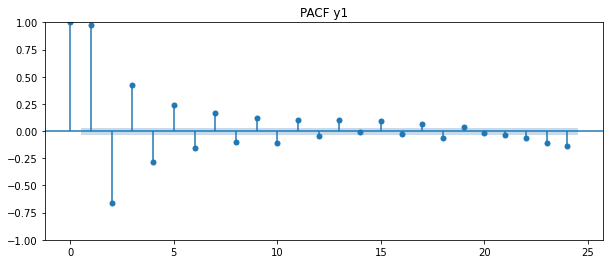

<Figure size 720x288 with 0 Axes>

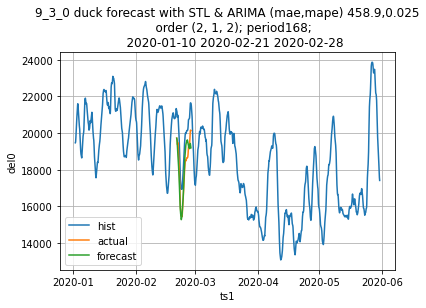

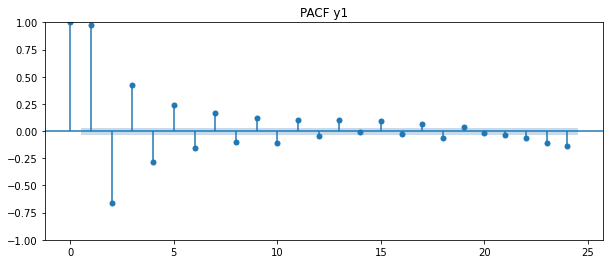

<Figure size 720x288 with 0 Axes>

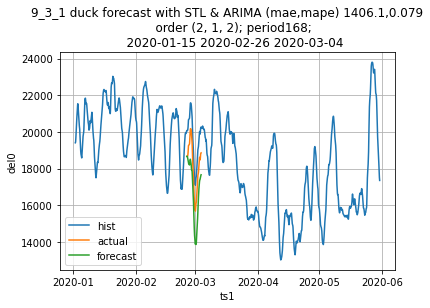

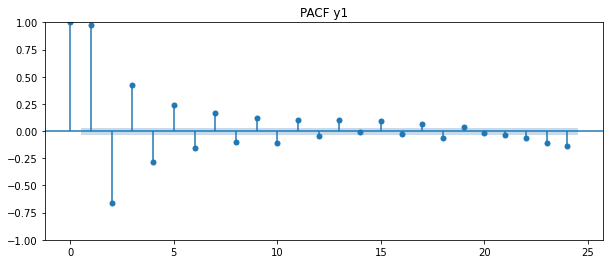

<Figure size 720x288 with 0 Axes>

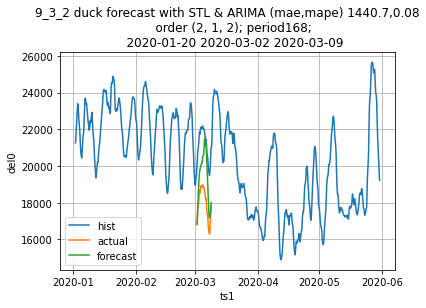

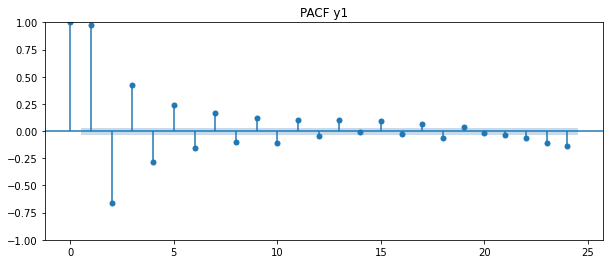

<Figure size 720x288 with 0 Axes>

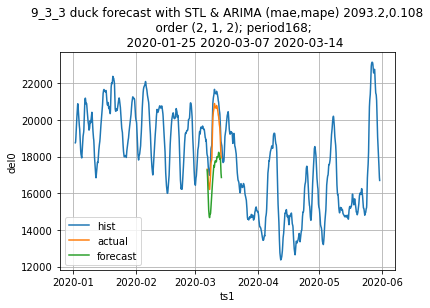

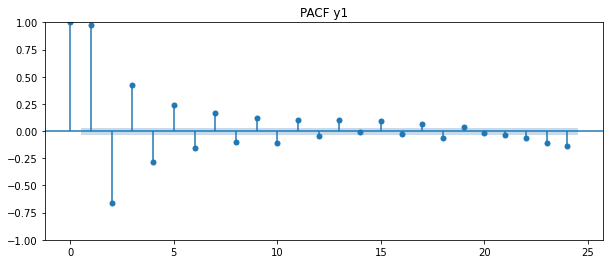

<Figure size 720x288 with 0 Axes>

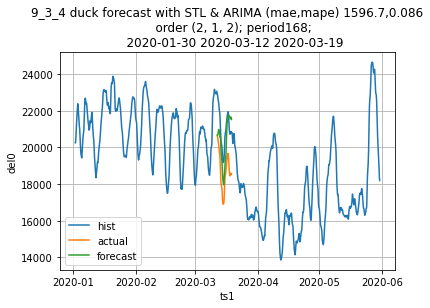

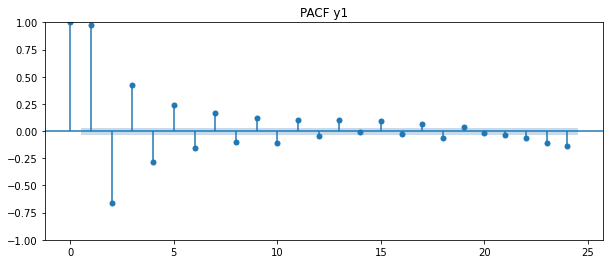

<Figure size 720x288 with 0 Axes>

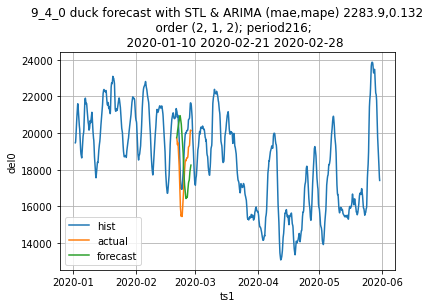

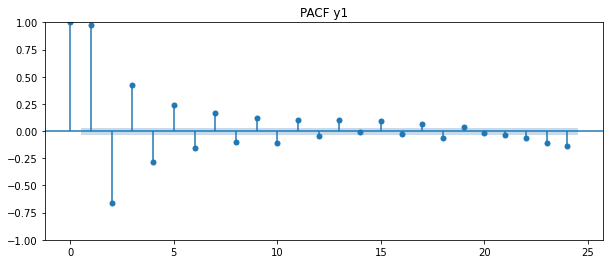

<Figure size 720x288 with 0 Axes>

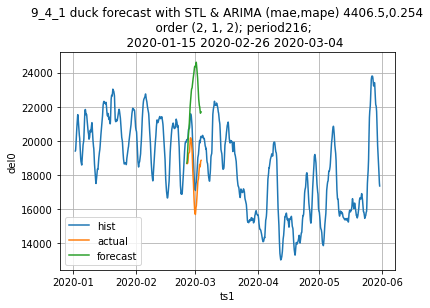

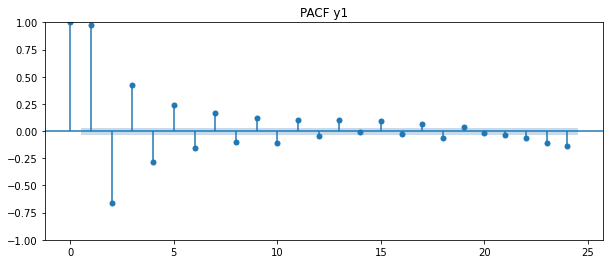

<Figure size 720x288 with 0 Axes>

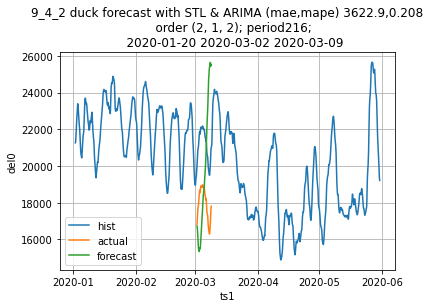

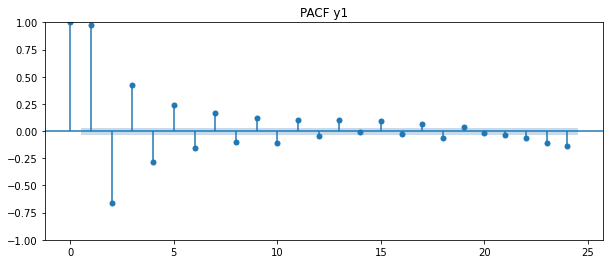

<Figure size 720x288 with 0 Axes>

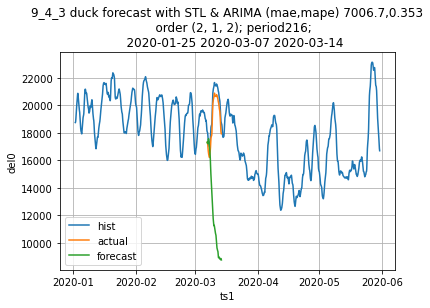

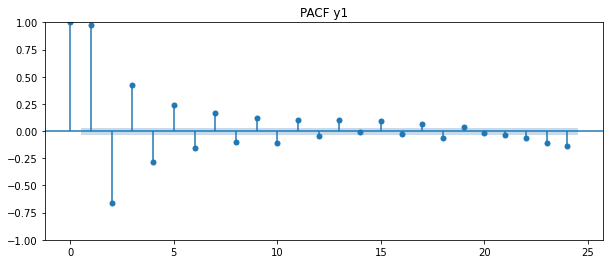

<Figure size 720x288 with 0 Axes>

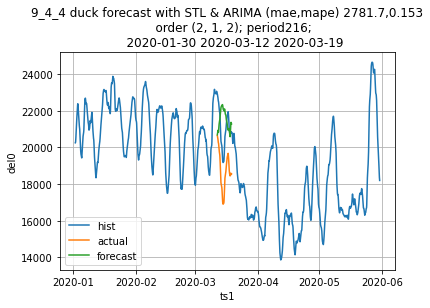

In [41]:
print(f'caiso_3_arima()')

df_trend = self_trend.to_frame(name=tic0)


# NOTE recall that trend starts at 1/8/23 rather than 1/1 (it takes about
# 7 days for the trend and residuals to appear in the underlying data)
sho0 = False
nam0 = f'{tic0}'

arima_order = [
     (1,0,0)
    ,(0,1,0)
    ,(0,0,1)
    ,(1,0,1)
    ,(1,1,0)
    ,(0,1,1)
    ,(1,1,1)
    ,(2,1,1)
    ,(1,1,2)
    ,(2,1,2)
    ]
d00 = dt.datetime.strptime( '2020-01-10 00:00:00' , "%Y-%m-%d %H:%M:%S")
d01 = dt.datetime.strptime( '2020-02-21 00:00:00' , "%Y-%m-%d %H:%M:%S")
d02 = dt.datetime.strptime( '2020-02-28 00:00:00' , "%Y-%m-%d %H:%M:%S")

res0 = []

idx1  = [] 
ord1  = [] 
per1  = [] 
cnt1  = []
mse1  = [] 
rmse1 = [] 
mae1  = [] 
mape1 = [] 


for i0,a0 in enumerate(arima_order):
    #for i1 in range(10):
    for i1 in range(5):
        cnt0  = 0
        per0  = i1*24*2 + 24
        mse0  = [] 
        rmse0 = [] 
        mae0  = [] 
        mape0 = [] 
        idx0  = f'{i0}_{i1}'
        for i2 in range(5):
        #for i2 in range(20):
            idx2 = f'{i0}_{i1}_{i2}'
            ord0 = a0
            d10 = str(d00 + dt.timedelta(days=i2*5))
            d11 = str(d01 + dt.timedelta(days=i2*5))
            d12 = str(d02 + dt.timedelta(days=i2*5))
            
            scor0 = eda_4_caiso_arima(df_trend,sho0,nam0,d10,d11,d12,ord0,per0,idx2)
           
            res1 = f'{i0} {i1} {i2} {a0} {per0}  {d10[:10]}   {d11[:10]}  {d12[:10]}  {scor0[0]} {scor0[1]} {scor0[2]} {scor0[3]} '
            res0.append(res1)
            print(f'({i0},{i1},{i2})', end=' ')
            cnt0 = i2 
            mse0.append( scor0[0])
            rmse0.append(scor0[1])
            mae0.append( scor0[2])
            mape0.append(scor0[3])

        idx1.append(idx0)
        ord1.append(a0)
        per1.append(per0)
        cnt1.append(cnt0)
        mse1.append( sum(mse0))
        rmse1.append(sum(rmse0))
        mae1.append( sum(mae0))
        mape1.append(sum(mape0))


# put output to text file so it can be converted to csv and analyzed
# via excel.          
with open(f"_out/result_{tic0}.txt", "w") as f0:
    lin0 = f' i0 tic0  idx2 ord1  per2  cnt2  mse2  mae2  mape2 mse3  rmse3 mae3  mape3 '
    #print(lin0)
    f0.write(lin0+'\n')
    for i0,a0 in enumerate(ord1):
        idx2  = idx1[i0]
        per2  = per1[i0]
        cnt2  = cnt1[i0]
        mse2  = mse1[i0]  
        rmse2 = rmse1[i0]  
        mae2  = mae1[i0]   
        mape2 = mape1[i0]  

        mse3  = mse2/( cnt2+1)
        rmse3 = rmse2/(cnt2+1)
        mae3  = mae2/( cnt2+1)
        mape3 = mape2/(cnt2+1)

        lin1 = f'{i0} {tic0} {idx2}  {a0}   {per2}   {cnt2}   {mse2}   {mae2}   {mape2} {mse3}   {rmse3} {mae3}   {mape3} '
        #print(lin1)
        f0.write(lin1+'\n')



#"""
#df_trend = self._df0
##df_trend = trend.to_frame()
##df_trend.columns = ['close']
##df_trend.reset_index(inplace=True)
#
##log0.debug(f'type(df_trend) {type(df_trend)}')
##log0.debug(f'df_trend.index {df_trend.index}')
##log0.debug(f'df_trend[:5] {df_trend[:5]}')
#
## NOTE recall that trend starts at 1/8/23 rather than 1/1 (it takes about
## 7 days for the trend and residuals to appear in the underlying data)
#sho0 = True
##nam0 = 'CAISO'
#nam0 = f'{tic0}'
#self.eda_4_caiso_arima(df_trend,sho0,nam0,'2024-01-10','2024-02-15','2024-03-01')
#"""





### (8) SARIMAX definition   


In [42]:

print('def sarimax forecast')
def sarimax_forecast(SARIMAX_model, periods=sper):
    # Forecast
    n_periods = periods

    forecast_df = pd.DataFrame({'date_index': pd.date_range(df_trend.index[-1]
                              , periods=n_periods
                              , freq='D').day}
                              , index=pd.date_range(
                                  df_trend.index[-1] + pd.DateOffset(days=0)
                                  , periods=n_periods
                                  , freq='D'
                              ))


    fitted, confint = SARIMAX_model.predict(n_periods=n_periods
                              , return_conf_int=True
                              , exogenous=forecast_df[['date_index']])
    index_of_fc = pd.date_range(df_trend.index[-1]+timedelta(days=0)
                              , periods=n_periods, freq='D')

    fitted_series = pd.Series(list(fitted) , index=index_of_fc)
    lower_series  = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series  = pd.Series(confint[:, 1], index=index_of_fc)

    f0 = fitted[0] 
    #print(f' index_of_fc      { index_of_fc }')
    #print(f' fitted           { fitted }')
    #print(f' f0               { f0 }')
    #print(f' confint          { confint }')
    #print(f'fitted_series     { fitted_series }')
    #print(f'lower_series      { lower_series }')
    #print(f'upper_series      { upper_series }')

    plt.figure(figsize=(15, 7))

    y1 = y0-f0
    plt.plot(df_trend[tic0], color='#1f76b4')
    plt.plot((fitted_series+y1), color='darkgreen')
    plt.fill_between(lower_series.index
                     , (lower_series+y1)
                     , (upper_series+y1)
                     , color='k', alpha=.15)


    plt.title(f'SARIMAX - Forecast of {tic0} w/ period {sper}')
    plt.savefig(f'_out/sarimax_{nam0}.png')

    plt.show()



def sarimax forecast


### (9) SARIMAX model prep and call     


sarimax()


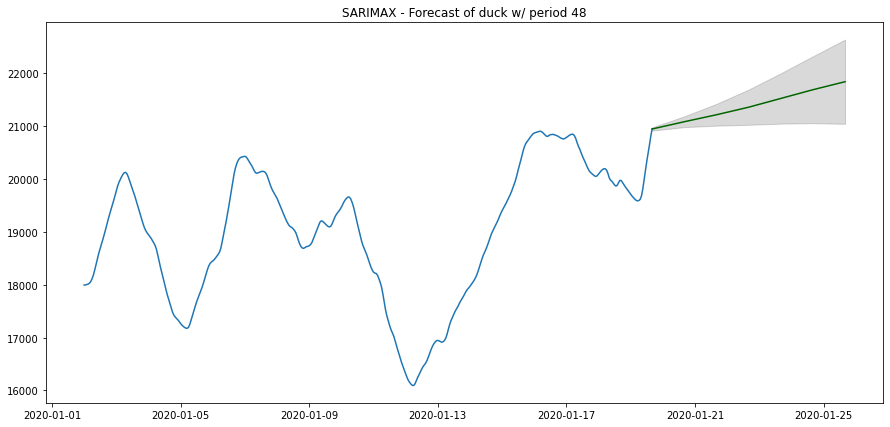

In [43]:
print(f'sarimax()')
df_trend0 = self_trend.to_frame(name=tic0)
#df_trend = df_trend0[252:325]
df_trend = df_trend0[0:425]

df_trend[tic0].dropna()
df_trend['del0'] = df_trend[tic0].diff(periods=sper)
df_trend['del0'].fillna(method='backfill',inplace=True)

x0 = df_trend.index.min()
x1 = df_trend.index.max()
y0 = float(df_trend.loc[x1,[tic0]][0])
df_trend['date_index'] = df_trend.index.day

mod0 = pm.auto_arima(df_trend[['del0']]
                     ,exogenous=df_trend[['date_index']]
                     ,start_p=1
                     ,start_q=2
                     ,test='adf'
                     ,max_p=3
                     ,max_q=3
                     ,m=12
                     ,start_P=0
                     ,seasonal=True
                     ,d=None
                     ,D=1
                     ,trace=False
                     ,error_action='ignore'
                     ,suppress_warnings=True
                     ,stepwise=True
                     )

fcst_per_days = 7

sarimax_forecast(mod0, periods=fcst_per_days)

